1) Line Graphs for comparing Epochs Vs Metrics according to weight Initialization techniques for Vanilla Architecture across different activation functions.

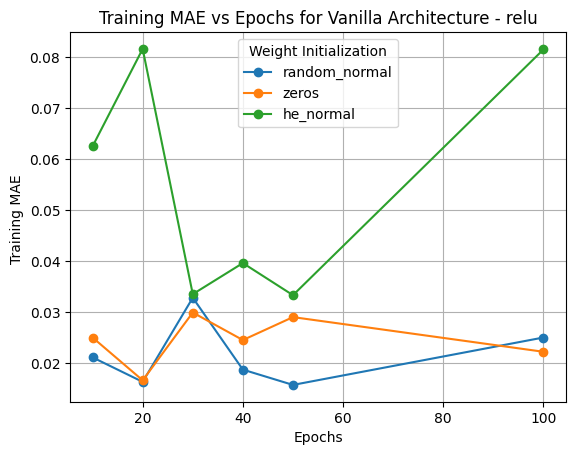

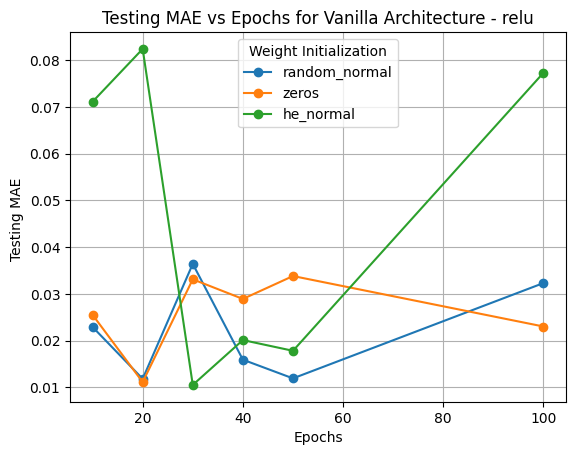

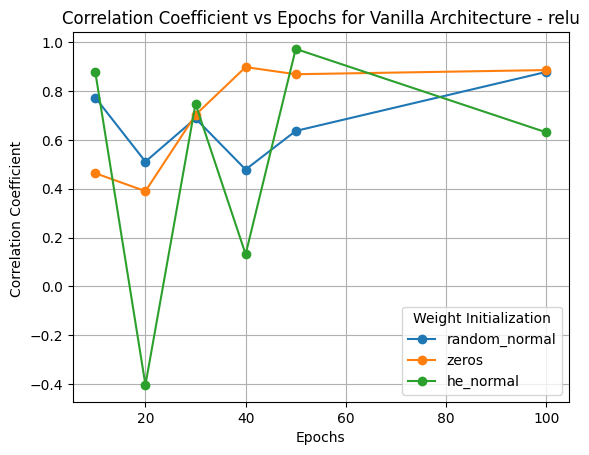

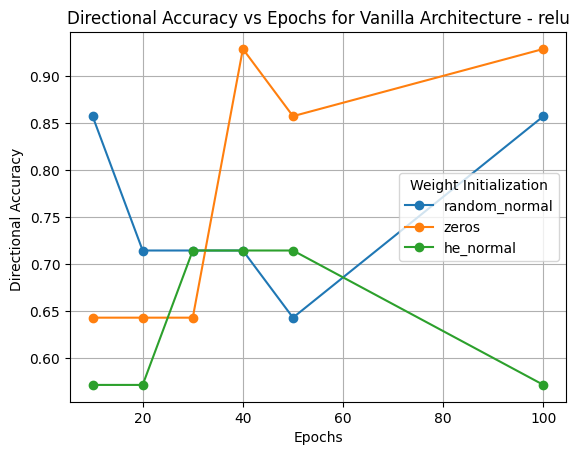

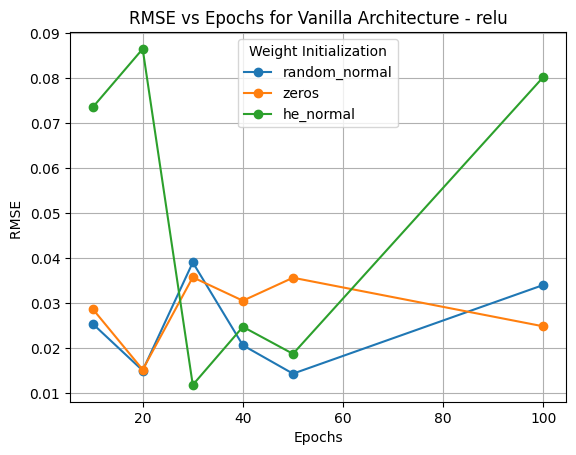

...

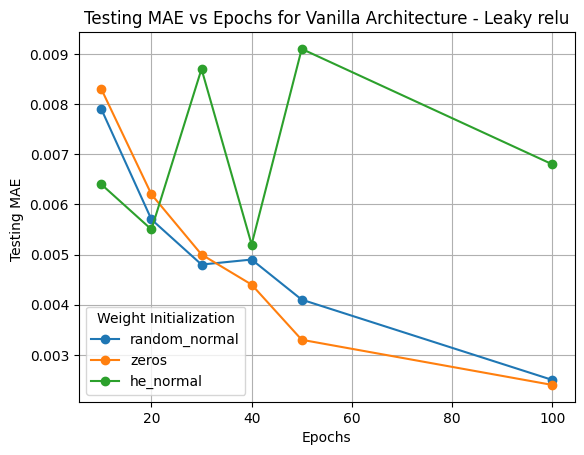

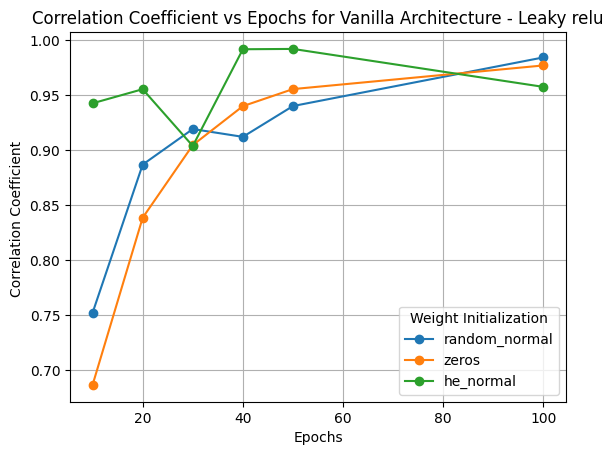

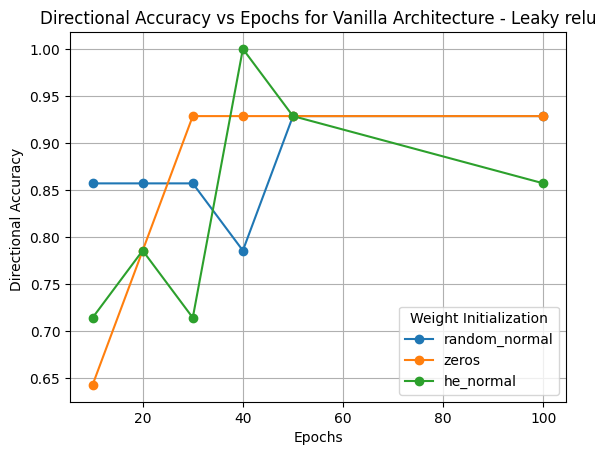

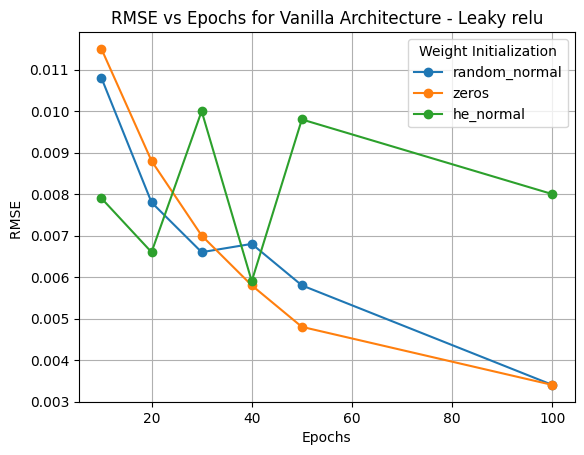

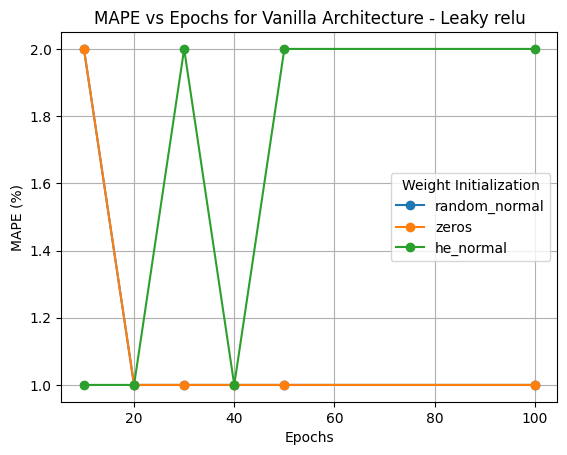

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

data = '''
Sl.No\tActivation Function\tWeight Initialization\tEpochs\tTraining MAE\tTesting MAE\tCorrelation Coefficient\tDirectional Accuracy\tRMSE\tMAPE\tGeneralization Gap (MAE)
1\trelu\trandom_normal\t10\t0.0211\t0.0229\t0.7734\t0.8571\t0.0255\t5%\t0.0018
2\trelu\trandom_normal\t20\t0.0163\t0.0118\t0.5111\t0.7143\t0.0151\t3%\t-0.0045
3\trelu\trandom_normal\t30\t0.0328\t0.0364\t0.6880\t0.7143\t0.0391\t8%\t0.0035
4\trelu\trandom_normal\t40\t0.0187\t0.0159\t0.4788\t0.7143\t0.0207\t4%\t-0.0028
5\trelu\trandom_normal\t50\t0.0157\t0.0119\t0.6369\t0.6429\t0.0144\t3%\t-0.0038
6\trelu\trandom_normal\t100\t0.0250\t0.0323\t0.8785\t0.8571\t0.0341\t7%\t0.0073
1\trelu\tzeros\t10\t0.0250\t0.0255\t0.4637\t0.6429\t0.0288\t6%\t0.0005
2\trelu\tzeros\t20\t0.0166\t0.0111\t0.3901\t0.6429\t0.0153\t3%\t-0.0054
3\trelu\tzeros\t30\t0.0299\t0.0331\t0.7027\t0.6429\t0.0358\t8%\t0.0032
4\trelu\tzeros\t40\t0.0245\t0.0289\t0.8984\t0.9286\t0.0306\t7%\t0.0043
5\trelu\tzeros\t50\t0.0290\t0.0338\t0.8691\t0.8571\t0.0357\t8%\t0.0048
6\trelu\tzeros\t100\t0.0222\t0.0230\t0.8862\t0.9286\t0.0249\t5%\t0.0008
1\trelu\the_normal\t10\t0.0625\t0.0711\t0.8773\t0.5714\t0.0735\t16%\t0.0086
2\trelu\the_normal\t20\t0.0816\t0.0824\t-0.4034\t0.5714\t0.0865\t19%\t0.0008
3\trelu\the_normal\t30\t0.0335\t0.0105\t0.7477\t0.7143\t0.0119\t2%\t-0.0231
4\trelu\the_normal\t40\t0.0396\t0.0201\t0.1317\t0.7143\t0.0248\t5%\t-0.0195
5\trelu\the_normal\t50\t0.0333\t0.0178\t0.9728\t0.7143\t0.0188\t4%\t-0.0155
6\trelu\the_normal\t100\t0.0815\t0.0773\t0.6311\t0.5714\t0.0803\t18%\t-0.0042
1\ttanh\trandom_normal\t10\t0.0065\t0.0038\t0.9478\t0.7143\t0.0053\t1%\t-0.0027
2\ttanh\trandom_normal\t20\t0.0044\t0.0016\t0.9890\t1.0000\t0.0024\t0%\t-0.0027
3\ttanh\trandom_normal\t30\t0.0033\t0.0014\t0.9938\t0.9286\t0.0018\t0%\t-0.0020
4\ttanh\trandom_normal\t40\t0.0032\t0.0011\t0.9961\t1.0000\t0.0014\t0%\t-0.0021
5\ttanh\trandom_normal\t50\t0.0021\t0.0006\t0.9989\t1.0000\t0.0008\t0%\t-0.0015
6\ttanh\trandom_normal\t100\t0.0021\t0.0005\t0.9994\t1.0000\t0.0006\t0%\t-0.0017
1\ttanh\tzeros\t10\t0.0108\t0.0071\t0.7638\t0.7143\t0.0102\t2%\t-0.0037
2\ttanh\tzeros\t20\t0.0047\t0.0033\t0.9700\t0.9286\t0.0044\t1%\t-0.0014
3\ttanh\tzeros\t30\t0.0043\t0.0034\t0.9763\t0.9286\t0.0044\t1%\t-0.0009
4\ttanh\tzeros\t40\t0.0033\t0.0015\t0.9918\t1.0000\t0.0021\t0%\t-0.0019
5\ttanh\tzeros\t50\t0.0033\t0.0017\t0.9905\t1.0000\t0.0024\t0%\t-0.0017
6\ttanh\tzeros\t100\t0.0022\t0.0007\t0.9984\t1.0000\t0.0009\t0%\t-0.0015
1\ttanh\the_normal\t10\t0.0062\t0.0049\t0.9600\t0.9286\t0.0064\t1%\t-0.0013
2\ttanh\the_normal\t20\t0.0052\t0.0030\t0.9697\t0.8571\t0.0039\t1%\t-0.0022
3\ttanh\the_normal\t30\t0.0041\t0.0035\t0.9816\t0.8571\t0.0041\t1%\t-0.0006
4\ttanh\the_normal\t40\t0.0040\t0.0026\t0.9829\t1.0000\t0.0038\t1%\t-0.0014
5\ttanh\the_normal\t50\t0.0030\t0.0015\t0.9925\t0.9286\t0.0022\t0%\t-0.0015
6\ttanh\the_normal\t100\t0.0032\t0.0027\t0.9980\t1.0000\t0.0030\t1%\t-0.0004
1\tLeaky relu\trandom_normal\t10\t0.0107\t0.0079\t0.7521\t0.8571\t0.0108\t2%\t-0.0028
2\tLeaky relu\trandom_normal\t20\t0.0074\t0.0057\t0.8868\t0.8571\t0.0078\t1%\t-0.0017
3\tLeaky relu\trandom_normal\t30\t0.0064\t0.0048\t0.9191\t0.8571\t0.0066\t1%\t-0.0016
4\tLeaky relu\trandom_normal\t40\t0.0065\t0.0049\t0.9120\t0.7857\t0.0068\t1%\t-0.0016
5\tLeaky relu\trandom_normal\t50\t0.0055\t0.0041\t0.9400\t0.9286\t0.0058\t1%\t-0.0014
6\tLeaky relu\trandom_normal\t100\t0.0040\t0.0025\t0.9842\t0.9286\t0.0034\t1%\t-0.0015
1\tLeaky relu\tzeros\t10\t0.0121\t0.0083\t0.6866\t0.6429\t0.0115\t2%\t-0.0038
2\tLeaky relu\tzeros\t20\t0.0092\t0.0062\t0.8385\t0.7857\t0.0088\t1%\t-0.0031
3\tLeaky relu\tzeros\t30\t0.0073\t0.0050\t0.9045\t0.9286\t0.0070\t1%\t-0.0023
4\tLeaky relu\tzeros\t40\t0.0060\t0.0044\t0.9399\t0.9286\t0.0058\t1%\t-0.0017
5\tLeaky relu\tzeros\t50\t0.0053\t0.0033\t0.9554\t0.9286\t0.0048\t1%\t-0.0021
6\tLeaky relu\tzeros\t100\t0.0036\t0.0024\t0.9769\t0.9286\t0.0034\t1%\t-0.0012
1\tLeaky relu\the_normal\t10\t0.0149\t0.0064\t0.9425\t0.7143\t0.0079\t1%\t-0.0085
2\tLeaky relu\the_normal\t20\t0.0158\t0.0055\t0.9553\t0.7857\t0.0066\t1%\t-0.0103
3\tLeaky relu\the_normal\t30\t0.0130\t0.0087\t0.9037\t0.7143\t0.0100\t2%\t-0.0043
4\tLeaky relu\the_normal\t40\t0.0066\t0.0052\t0.9916\t1.0000\t0.0059\t1%\t-0.0014
5\tLeaky relu\the_normal\t50\t0.0075\t0.0091\t0.9919\t0.9286\t0.0098\t2%\t0.0016
6\tLeaky relu\the_normal\t100\t0.0070\t0.0068\t0.9574\t0.8571\t0.0080\t2%\t-0.0001
'''

# Read data into pandas DataFrame
df = pd.read_csv(StringIO(data), sep='\t')

# Remove % sign from MAPE and convert to numeric
df['MAPE'] = df['MAPE'].str.replace('%', '').astype(float)

# Convert 'Epochs' to numeric
df['Epochs'] = pd.to_numeric(df['Epochs'])

# Get unique activation functions and metrics
activation_functions = df['Activation Function'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting
for activation_function in activation_functions:
    df_af = df[df['Activation Function'] == activation_function]
    for metric in metrics:
        plt.figure()
        for weight_init in df_af['Weight Initialization'].unique():
            df_wi = df_af[df_af['Weight Initialization'] == weight_init]
            plt.plot(df_wi['Epochs'], df_wi[metric], marker='o', label=weight_init)
        plt.xlabel('Epochs')
        plt.ylabel(f"{metric} {'(%)' if metric == 'MAPE' else ''}")
        plt.title(f'{metric} vs Epochs for Vanilla Architecture - {activation_function}')
        plt.legend(title='Weight Initialization')
        plt.grid(True)
        plt.show()


2) Line Graphs for comparing Epochs Vs Metrics according to weight Initialization techniques for GRU Architecture across different activation functions.

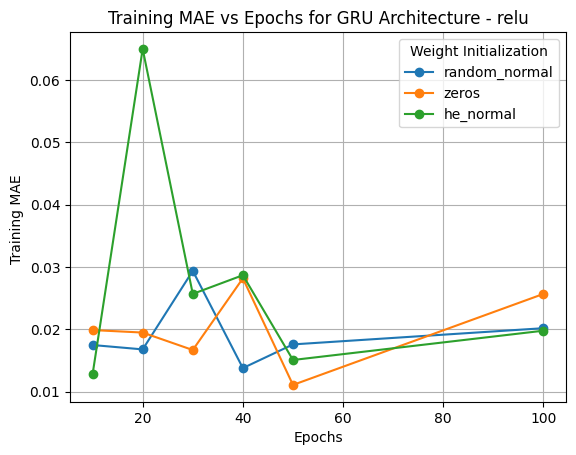

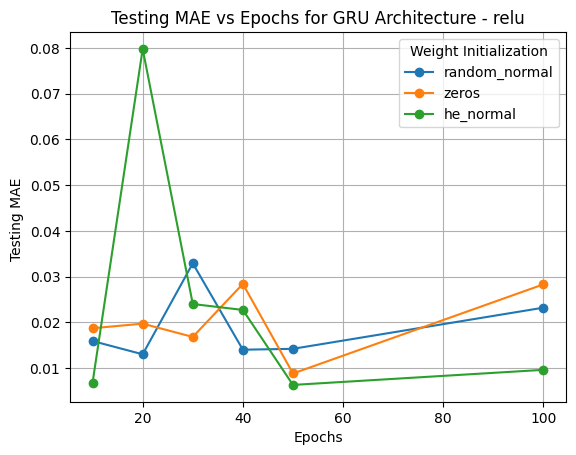

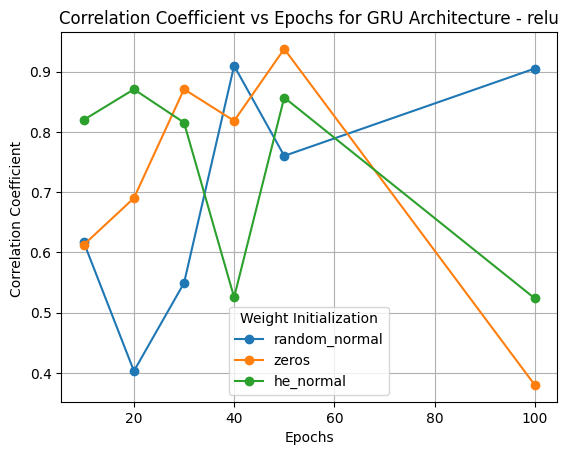

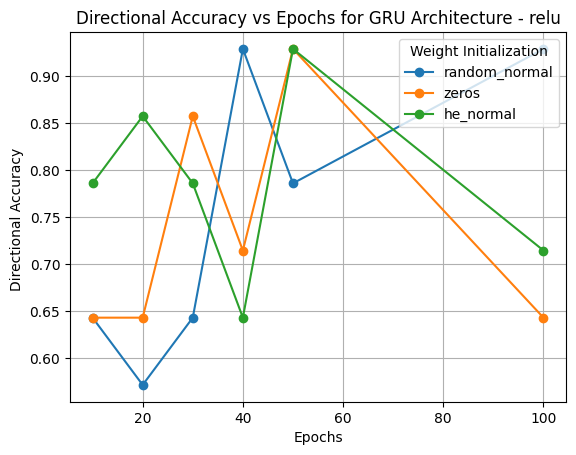

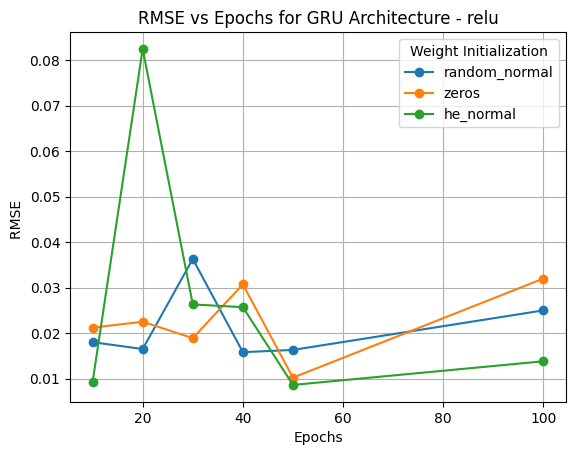

...

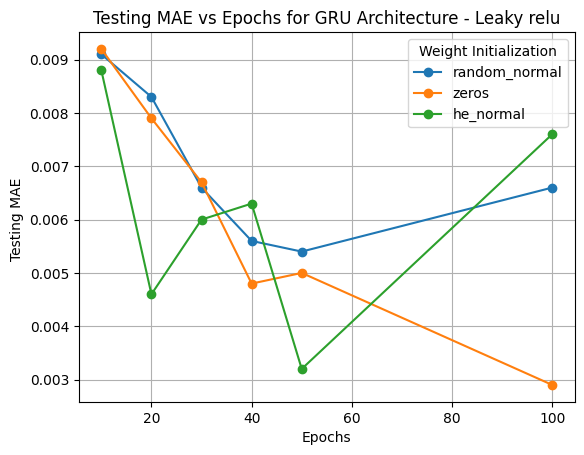

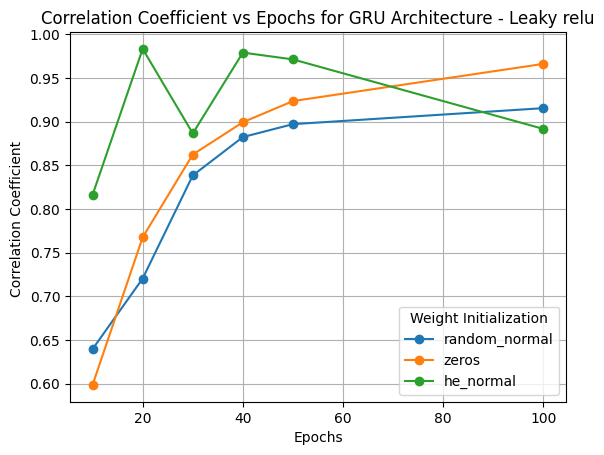

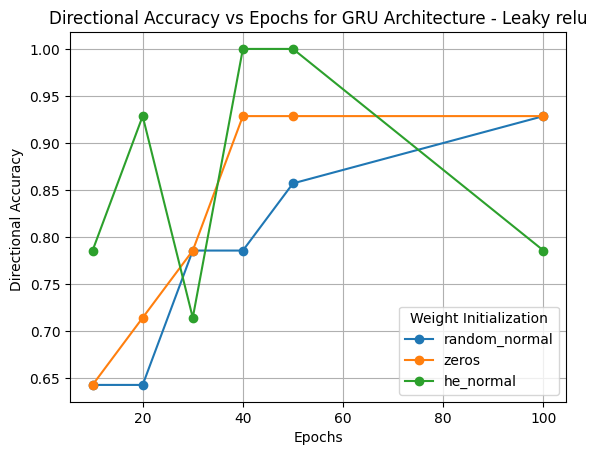

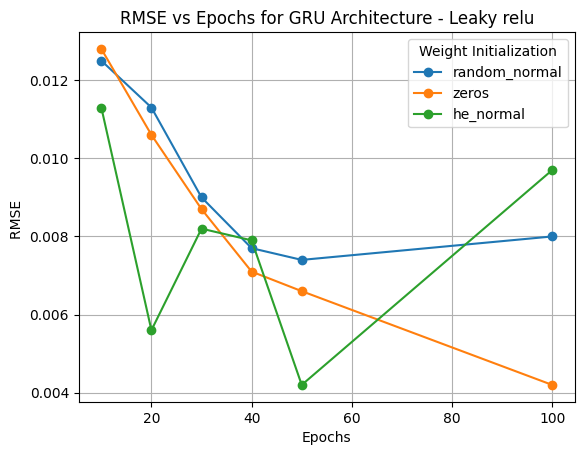

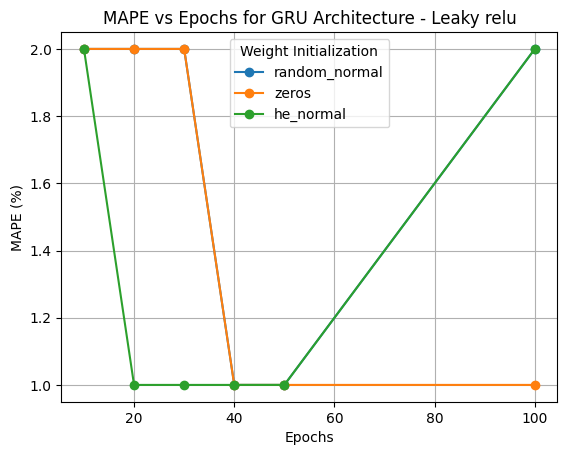

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

data = '''
Sl.No\tActivation Function\tWeight Initialization\tEpochs\tTraining MAE\tTesting MAE\tCorrelation Coefficient\tDirectional Accuracy\tRMSE\tMAPE\tGeneralization Gap (MAE)
1\trelu\trandom_normal\t10\t0.0175\t0.0159\t0.6166\t0.6429\t0.0180\t4%\t-0.0016
2\trelu\trandom_normal\t20\t0.0168\t0.0130\t0.4033\t0.5714\t0.0165\t3%\t-0.0038
3\trelu\trandom_normal\t30\t0.0294\t0.0329\t0.5493\t0.6429\t0.0363\t8%\t0.0035
4\trelu\trandom_normal\t40\t0.0138\t0.0140\t0.9097\t0.9286\t0.0158\t3%\t0.0003
5\trelu\trandom_normal\t50\t0.0176\t0.0142\t0.7602\t0.7857\t0.0163\t3%\t-0.0034
6\trelu\trandom_normal\t100\t0.0202\t0.0232\t0.9050\t0.9286\t0.0250\t5%\t0.0030
1\trelu\tzeros\t10\t0.0199\t0.0187\t0.6128\t0.6429\t0.0212\t4%\t-0.0012
2\trelu\tzeros\t20\t0.0195\t0.0197\t0.6902\t0.6429\t0.0225\t5%\t0.0002
3\trelu\tzeros\t30\t0.0167\t0.0168\t0.8708\t0.8571\t0.0189\t4%\t0.0001
4\trelu\tzeros\t40\t0.0282\t0.0284\t0.8183\t0.7143\t0.0307\t7%\t0.0001
5\trelu\tzeros\t50\t0.0111\t0.0088\t0.9376\t0.9286\t0.0102\t2%\t-0.0023
6\trelu\tzeros\t100\t0.0257\t0.0283\t0.3803\t0.6429\t0.0320\t6%\t0.0025
1\trelu\the_normal\t10\t0.0128\t0.0068\t0.8200\t0.7857\t0.0092\t2%\t-0.0060
2\trelu\the_normal\t20\t0.0650\t0.0798\t0.8706\t0.8571\t0.0825\t18%\t0.0149
3\trelu\the_normal\t30\t0.0257\t0.0240\t0.8154\t0.7857\t0.0263\t6%\t-0.0017
4\trelu\the_normal\t40\t0.0287\t0.0227\t0.5256\t0.6429\t0.0257\t5%\t-0.0060
5\trelu\the_normal\t50\t0.0151\t0.0063\t0.8570\t0.9286\t0.0086\t1%\t-0.0088
6\trelu\the_normal\t100\t0.0198\t0.0096\t0.5239\t0.7143\t0.0138\t2%\t-0.0102
1\ttanh\trandom_normal\t10\t0.0068\t0.0044\t0.9221\t0.7143\t0.0064\t1%\t-0.0024
2\ttanh\trandom_normal\t20\t0.0046\t0.0028\t0.9703\t0.8571\t0.0039\t1%\t-0.0018
3\ttanh\trandom_normal\t30\t0.0026\t0.0013\t0.9960\t1.0000\t0.0016\t0%\t-0.0013
4\ttanh\trandom_normal\t40\t0.0023\t0.0013\t0.9945\t1.0000\t0.0017\t0%\t-0.0011
5\ttanh\trandom_normal\t50\t0.0028\t0.0016\t0.9944\t1.0000\t0.0021\t0%\t-0.0012
6\ttanh\trandom_normal\t100\t0.0021\t0.0012\t0.9959\t1.0000\t0.0015\t0%\t-0.0010
1\ttanh\tzeros\t10\t0.0117\t0.0080\t0.6894\t0.6429\t0.0114\t2%\t-0.0037
2\ttanh\tzeros\t20\t0.0065\t0.0042\t0.9213\t0.9286\t0.0062\t1%\t-0.0023
3\ttanh\tzeros\t30\t0.0052\t0.0034\t0.9551\t0.9286\t0.0049\t1%\t-0.0017
4\ttanh\tzeros\t40\t0.0042\t0.0028\t0.9770\t0.9286\t0.0039\t1%\t-0.0013
5\ttanh\tzeros\t50\t0.0041\t0.0023\t0.9797\t0.9286\t0.0032\t1%\t-0.0018
6\ttanh\tzeros\t100\t0.0026\t0.0015\t0.9946\t1.0000\t0.0019\t0%\t-0.0011
1\ttanh\the_normal\t10\t0.0059\t0.0044\t0.9676\t0.8571\t0.0060\t1%\t-0.0015
2\ttanh\the_normal\t20\t0.0044\t0.0033\t0.9913\t1.0000\t0.0040\t1%\t-0.0011
3\ttanh\the_normal\t30\t0.0030\t0.0017\t0.9976\t1.0000\t0.0021\t0%\t-0.0013
4\ttanh\the_normal\t40\t0.0057\t0.0046\t0.9991\t1.0000\t0.0047\t1%\t-0.0011
5\ttanh\the_normal\t50\t0.0041\t0.0037\t0.9908\t1.0000\t0.0044\t1%\t-0.0003
6\ttanh\the_normal\t100\t0.0038\t0.0044\t0.9985\t1.0000\t0.0046\t1%\t0.0006
1\tLeaky relu\trandom_normal\t10\t0.0125\t0.0091\t0.6395\t0.6429\t0.0125\t2%\t-0.0034
2\tLeaky relu\trandom_normal\t20\t0.0112\t0.0083\t0.7203\t0.6429\t0.0113\t2%\t-0.0029
3\tLeaky relu\trandom_normal\t30\t0.0074\t0.0066\t0.8383\t0.7857\t0.0090\t2%\t-0.0008
4\tLeaky relu\trandom_normal\t40\t0.0066\t0.0056\t0.8822\t0.7857\t0.0077\t1%\t-0.0010
5\tLeaky relu\trandom_normal\t50\t0.0071\t0.0054\t0.8970\t0.8571\t0.0074\t1%\t-0.0017
6\tLeaky relu\trandom_normal\t100\t0.0054\t0.0066\t0.9153\t0.9286\t0.0080\t2%\t0.0012
1\tLeaky relu\tzeros\t10\t0.0135\t0.0092\t0.5985\t0.6429\t0.0128\t2%\t-0.0042
2\tLeaky relu\tzeros\t20\t0.0106\t0.0079\t0.7675\t0.7143\t0.0106\t2%\t-0.0028
3\tLeaky relu\tzeros\t30\t0.0083\t0.0067\t0.8622\t0.7857\t0.0087\t2%\t-0.0016
4\tLeaky relu\tzeros\t40\t0.0072\t0.0048\t0.8992\t0.9286\t0.0071\t1%\t-0.0023
5\tLeaky relu\tzeros\t50\t0.0063\t0.0050\t0.9234\t0.9286\t0.0066\t1%\t-0.0013
6\tLeaky relu\tzeros\t100\t0.0041\t0.0029\t0.9660\t0.9286\t0.0042\t1%\t-0.0011
1\tLeaky relu\the_normal\t10\t0.0114\t0.0088\t0.8161\t0.7857\t0.0113\t2%\t-0.0026
2\tLeaky relu\the_normal\t20\t0.0080\t0.0046\t0.9831\t0.9286\t0.0056\t1%\t-0.0034
3\tLeaky relu\the_normal\t30\t0.0089\t0.0060\t0.8864\t0.7143\t0.0082\t1%\t-0.0029
4\tLeaky relu\the_normal\t40\t0.0072\t0.0063\t0.9789\t1.0000\t0.0079\t1%\t-0.0009
5\tLeaky relu\the_normal\t50\t0.0060\t0.0032\t0.9711\t1.0000\t0.0042\t1%\t-0.0028
6\tLeaky relu\the_normal\t100\t0.0068\t0.0076\t0.8915\t0.7857\t0.0097\t2%\t0.0008
'''

# Read data into pandas DataFrame
df = pd.read_csv(StringIO(data), sep='\t')

# Remove % sign from MAPE and convert to numeric
df['MAPE'] = df['MAPE'].str.replace('%', '').astype(float)

# Convert 'Epochs' to numeric
df['Epochs'] = pd.to_numeric(df['Epochs'])

# Get unique activation functions and metrics
activation_functions = df['Activation Function'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting
for activation_function in activation_functions:
    df_af = df[df['Activation Function'] == activation_function]
    for metric in metrics:
        plt.figure()
        for weight_init in df_af['Weight Initialization'].unique():
            df_wi = df_af[df_af['Weight Initialization'] == weight_init]
            plt.plot(df_wi['Epochs'], df_wi[metric], marker='o', label=weight_init)
        plt.xlabel('Epochs')
        plt.ylabel(f"{metric} {'(%)' if metric == 'MAPE' else ''}")
        plt.title(f'{metric} vs Epochs for GRU Architecture - {activation_function}')
        plt.legend(title='Weight Initialization')
        plt.grid(True)
        plt.show()


3) Line Graphs for comparing Epochs Vs Metrics according to weight Initialization techniques for LSTM Architecture across different activation functions.

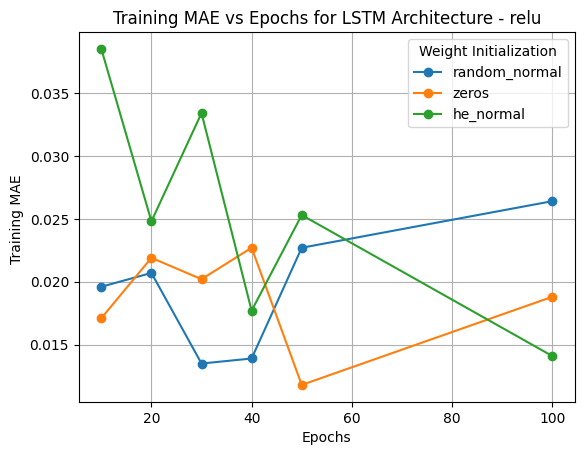

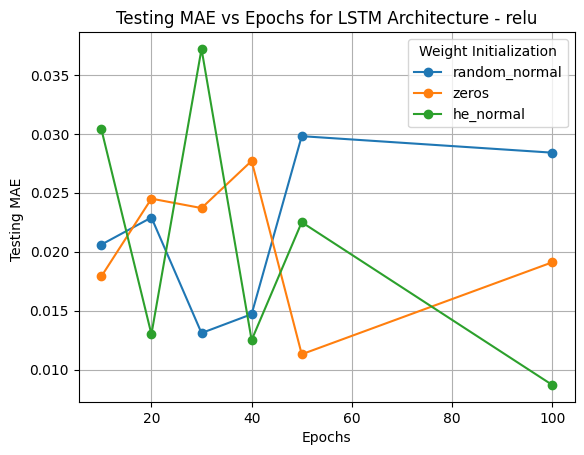

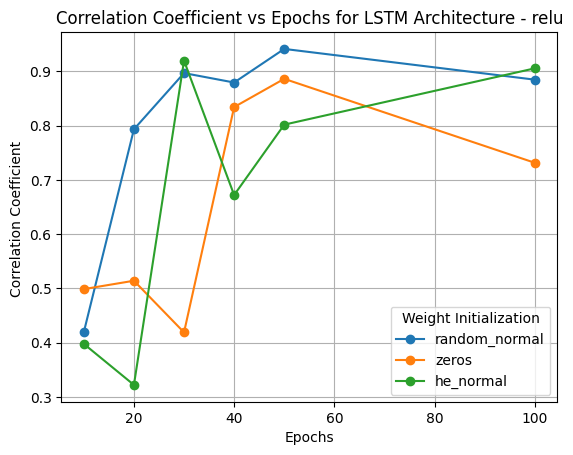

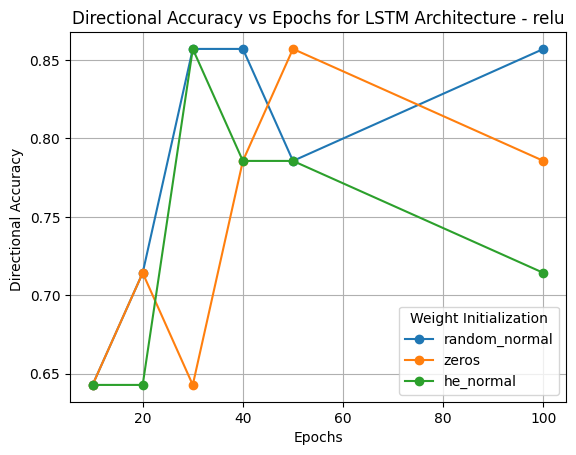

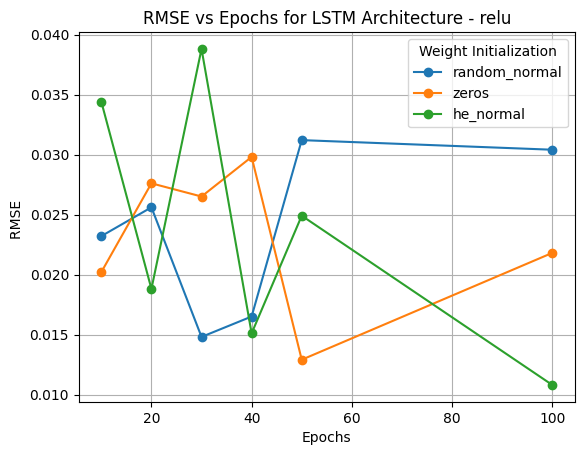

...

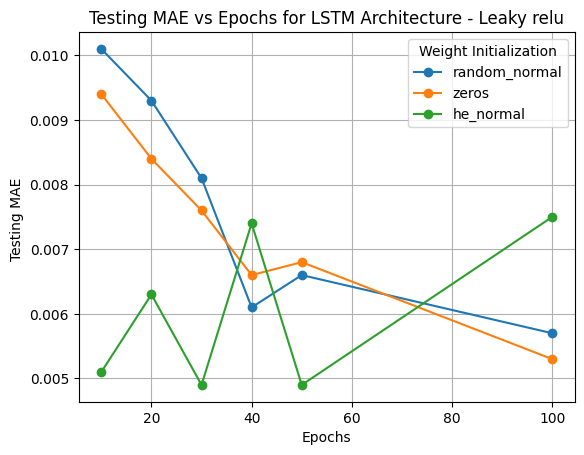

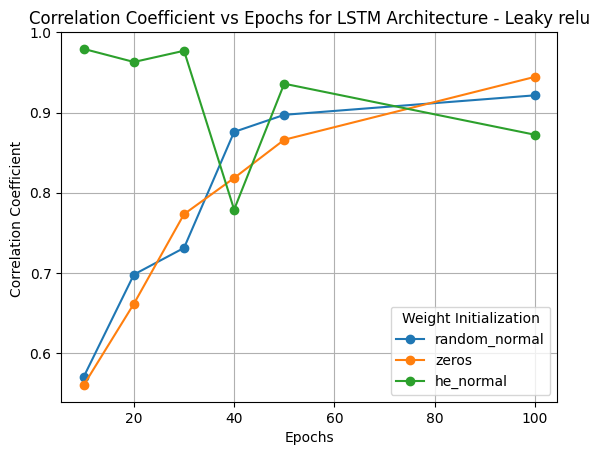

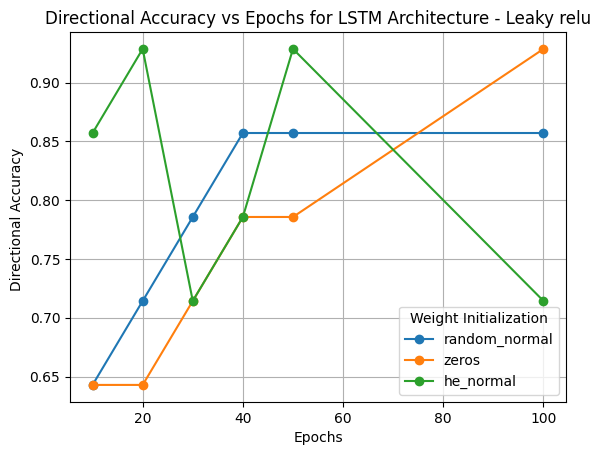

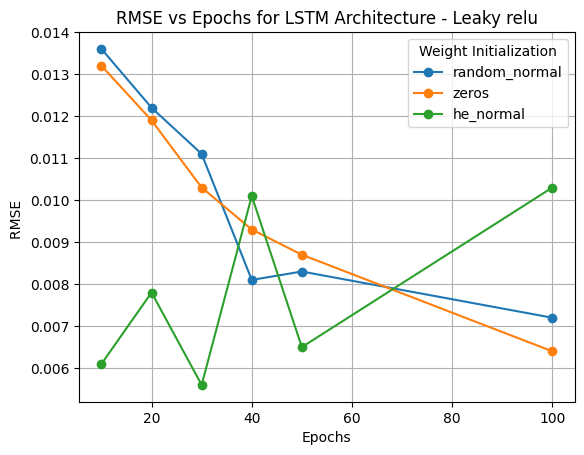

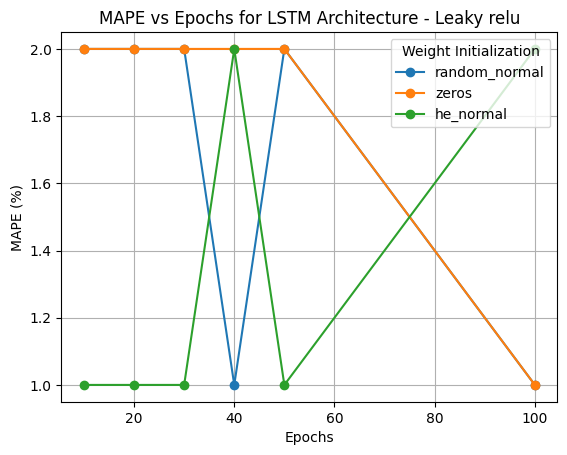

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

data = '''
Sl.No\tActivation Function\tWeight Initialization\tEpochs\tTraining MAE\tTesting MAE\tCorrelation Coefficient\tDirectional Accuracy\tRMSE\tMAPE\tGeneralization Gap (MAE)
1\trelu\trandom_normal\t10\t0.0196\t0.0206\t0.4196\t0.6429\t0.0232\t5%\t0.0010
2\trelu\trandom_normal\t20\t0.0207\t0.0229\t0.7932\t0.7143\t0.0256\t5%\t0.0023
3\trelu\trandom_normal\t30\t0.0135\t0.0131\t0.8967\t0.8571\t0.0148\t3%\t-0.0004
4\trelu\trandom_normal\t40\t0.0139\t0.0147\t0.8793\t0.8571\t0.0165\t3%\t0.0008
5\trelu\trandom_normal\t50\t0.0227\t0.0298\t0.9412\t0.7857\t0.0312\t7%\t0.0071
6\trelu\trandom_normal\t100\t0.0264\t0.0284\t0.8846\t0.8571\t0.0304\t7%\t0.0020
1\trelu\tzeros\t10\t0.0171\t0.0179\t0.4988\t0.6429\t0.0202\t4%\t0.0008
2\trelu\tzeros\t20\t0.0219\t0.0245\t0.5142\t0.7143\t0.0276\t6%\t0.0026
3\trelu\tzeros\t30\t0.0202\t0.0237\t0.4191\t0.6429\t0.0265\t5%\t0.0036
4\trelu\tzeros\t40\t0.0227\t0.0277\t0.8341\t0.7857\t0.0298\t6%\t0.0050
5\trelu\tzeros\t50\t0.0118\t0.0113\t0.8861\t0.8571\t0.0129\t3%\t-0.0005
6\trelu\tzeros\t100\t0.0188\t0.0191\t0.7315\t0.7857\t0.0218\t4%\t0.0004
1\trelu\the_normal\t10\t0.0385\t0.0304\t0.3979\t0.6429\t0.0344\t7%\t-0.0081
2\trelu\the_normal\t20\t0.0248\t0.0130\t0.3223\t0.6429\t0.0188\t3%\t-0.0118
3\trelu\the_normal\t30\t0.0334\t0.0372\t0.9196\t0.8571\t0.0388\t9%\t0.0037
4\trelu\the_normal\t40\t0.0177\t0.0125\t0.6721\t0.7857\t0.0151\t3%\t-0.0053
5\trelu\the_normal\t50\t0.0253\t0.0225\t0.8017\t0.7857\t0.0249\t5%\t-0.0028
6\trelu\the_normal\t100\t0.0141\t0.0087\t0.9054\t0.7143\t0.0108\t2%\t-0.0054
1\ttanh\trandom_normal\t10\t0.0101\t0.0076\t0.8028\t0.7857\t0.0100\t2%\t-0.0025
2\ttanh\trandom_normal\t20\t0.0065\t0.0043\t0.9224\t0.8571\t0.0061\t1%\t-0.0022
3\ttanh\trandom_normal\t30\t0.0053\t0.0032\t0.9589\t0.8571\t0.0045\t1%\t-0.0021
4\ttanh\trandom_normal\t40\t0.0045\t0.0033\t0.9780\t0.9286\t0.0043\t1%\t-0.0012
5\ttanh\trandom_normal\t50\t0.0031\t0.0019\t0.9899\t0.8571\t0.0024\t0%\t-0.0012
6\ttanh\trandom_normal\t100\t0.0031\t0.0016\t0.9905\t1.0000\t0.0022\t0%\t-0.0015
1\ttanh\tzeros\t10\t0.0124\t0.0088\t0.6783\t0.6429\t0.0123\t2%\t-0.0035
2\ttanh\tzeros\t20\t0.0084\t0.0073\t0.8794\t0.8571\t0.0094\t2%\t-0.0011
3\ttanh\tzeros\t30\t0.0061\t0.0038\t0.9367\t0.9286\t0.0056\t1%\t-0.0022
4\ttanh\tzeros\t40\t0.0049\t0.0032\t0.9621\t0.9286\t0.0045\t1%\t-0.0017
5\ttanh\tzeros\t50\t0.0040\t0.0024\t0.9774\t0.9286\t0.0035\t1%\t-0.0016
6\ttanh\tzeros\t100\t0.0027\t0.0014\t0.9942\t1.0000\t0.0018\t0%\t-0.0012
1\ttanh\the_normal\t10\t0.0055\t0.0034\t0.9758\t0.7857\t0.0045\t1%\t-0.0021
2\ttanh\the_normal\t20\t0.0063\t0.0036\t0.9785\t0.9286\t0.0048\t1%\t-0.0028
3\ttanh\the_normal\t30\t0.0031\t0.0017\t0.9945\t1.0000\t0.0020\t0%\t-0.0013
4\ttanh\the_normal\t40\t0.0035\t0.0023\t0.9971\t1.0000\t0.0029\t1%\t-0.0011
5\ttanh\the_normal\t50\t0.0028\t0.0016\t0.9982\t1.0000\t0.0018\t0%\t-0.0012
6\ttanh\the_normal\t100\t0.0033\t0.0019\t0.9978\t1.0000\t0.0023\t0%\t-0.0014
1\tLeaky relu\trandom_normal\t10\t0.0138\t0.0101\t0.5707\t0.6429\t0.0136\t2%\t-0.0037
2\tLeaky relu\trandom_normal\t20\t0.0116\t0.0093\t0.6980\t0.7143\t0.0122\t2%\t-0.0024
3\tLeaky relu\trandom_normal\t30\t0.0106\t0.0081\t0.7312\t0.7857\t0.0111\t2%\t-0.0025
4\tLeaky relu\trandom_normal\t40\t0.0073\t0.0061\t0.8759\t0.8571\t0.0081\t1%\t-0.0011
5\tLeaky relu\trandom_normal\t50\t0.0065\t0.0066\t0.8972\t0.8571\t0.0083\t2%\t0.0001
6\tLeaky relu\trandom_normal\t100\t0.0059\t0.0057\t0.9215\t0.8571\t0.0072\t1%\t-0.0002
1\tLeaky relu\tzeros\t10\t0.0141\t0.0094\t0.5603\t0.6429\t0.0132\t2%\t-0.0048
2\tLeaky relu\tzeros\t20\t0.0124\t0.0084\t0.6616\t0.6429\t0.0119\t2%\t-0.0040
3\tLeaky relu\tzeros\t30\t0.0106\t0.0076\t0.7733\t0.7143\t0.0103\t2%\t-0.0031
4\tLeaky relu\tzeros\t40\t0.0090\t0.0066\t0.8184\t0.7857\t0.0093\t2%\t-0.0024
5\tLeaky relu\tzeros\t50\t0.0081\t0.0068\t0.8661\t0.7857\t0.0087\t2%\t-0.0013
6\tLeaky relu\tzeros\t100\t0.0058\t0.0053\t0.9445\t0.9286\t0.0064\t1%\t-0.0005
1\tLeaky relu\the_normal\t10\t0.0081\t0.0051\t0.9794\t0.8571\t0.0061\t1%\t-0.0030
2\tLeaky relu\the_normal\t20\t0.0075\t0.0063\t0.9631\t0.9286\t0.0078\t1%\t-0.0011
3\tLeaky relu\the_normal\t30\t0.0076\t0.0049\t0.9771\t0.7143\t0.0056\t1%\t-0.0027
4\tLeaky relu\the_normal\t40\t0.0085\t0.0074\t0.7790\t0.7857\t0.0101\t2%\t-0.0011
5\tLeaky relu\the_normal\t50\t0.0067\t0.0049\t0.9360\t0.9286\t0.0065\t1%\t-0.0018
6\tLeaky relu\the_normal\t100\t0.0076\t0.0075\t0.8724\t0.7143\t0.0103\t2%\t-0.0001
'''

# Read data into pandas DataFrame
df = pd.read_csv(StringIO(data), sep='\t')

# Remove % sign from MAPE and convert to numeric
df['MAPE'] = df['MAPE'].str.replace('%', '').astype(float)

# Convert 'Epochs' to numeric
df['Epochs'] = pd.to_numeric(df['Epochs'])

# Get unique activation functions and metrics
activation_functions = df['Activation Function'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting
for activation_function in activation_functions:
    df_af = df[df['Activation Function'] == activation_function]
    for metric in metrics:
        plt.figure()
        for weight_init in df_af['Weight Initialization'].unique():
            df_wi = df_af[df_af['Weight Initialization'] == weight_init]
            plt.plot(df_wi['Epochs'], df_wi[metric], marker='o', label=weight_init)
        plt.xlabel('Epochs')
        plt.ylabel(f"{metric} {'(%)' if metric == 'MAPE' else ''}")
        plt.title(f'{metric} vs Epochs for LSTM Architecture - {activation_function}')
        plt.legend(title='Weight Initialization')
        plt.grid(True)
        plt.show()


4) Line Graphs for comparing Epochs Vs Metrics according to weight Initialization techniques for TCN Architecture across different activation functions.

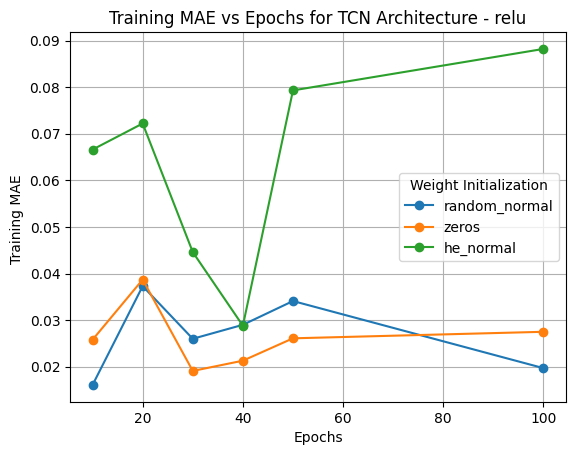

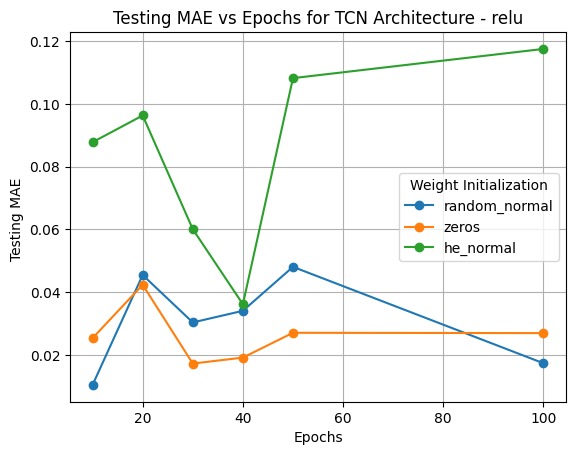

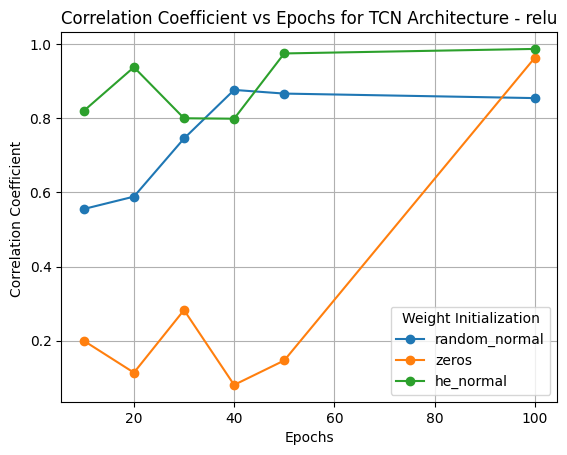

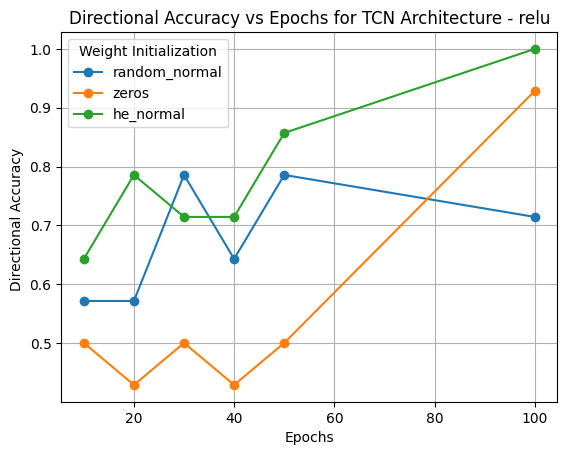

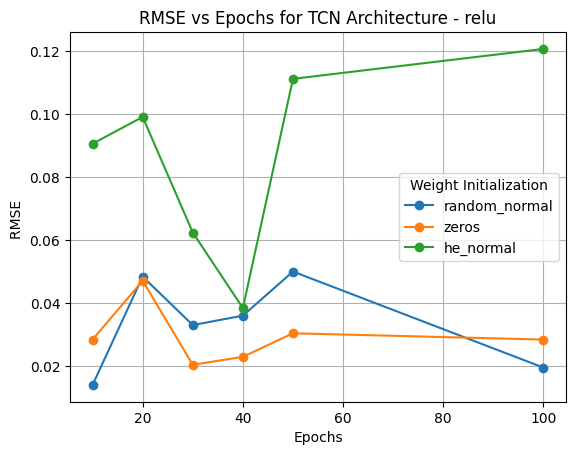

...

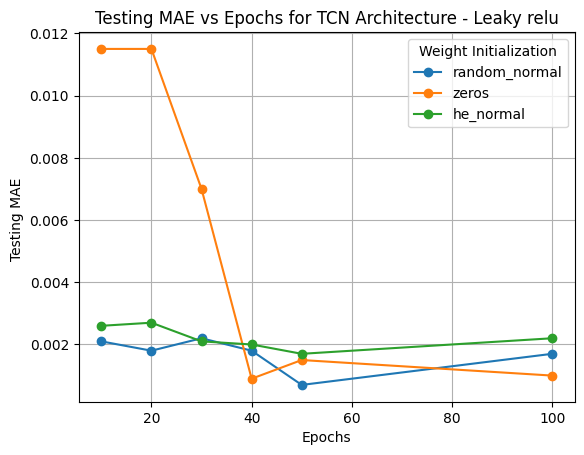

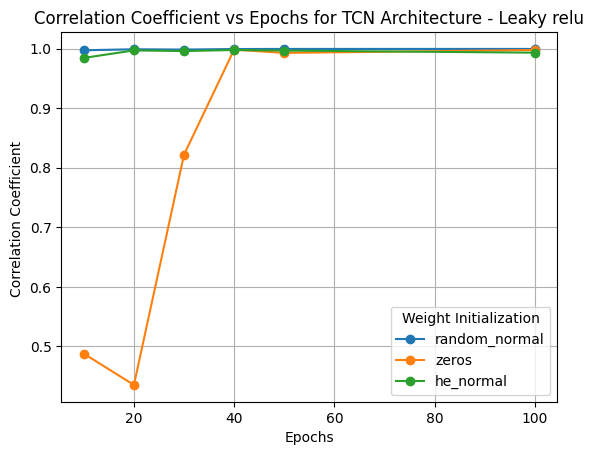

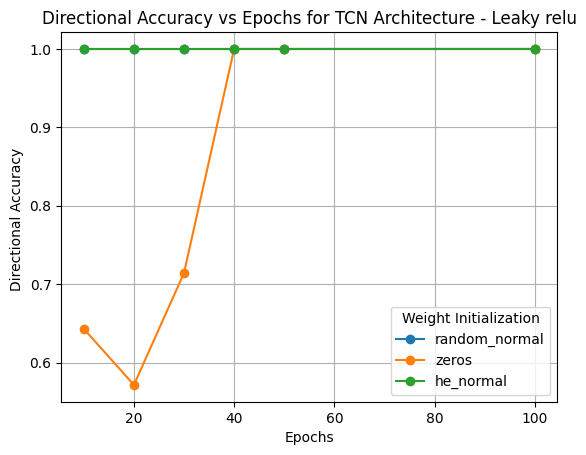

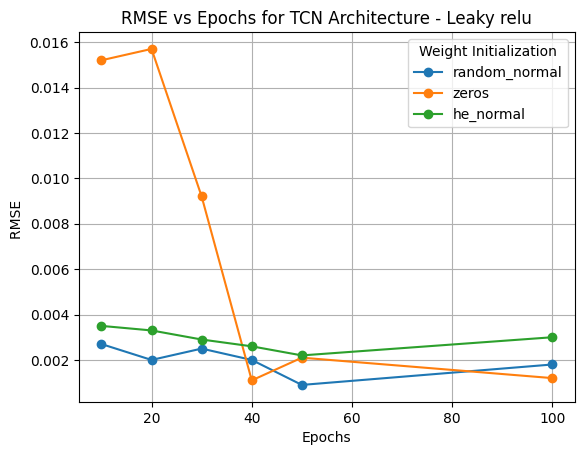

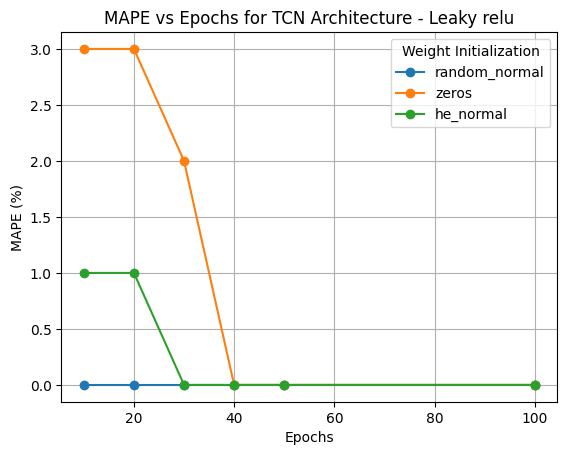

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

data = '''
Sl.No\tActivation Function\tWeight Initialization\tEpochs\tTraining MAE\tTesting MAE\tCorrelation Coefficient\tDirectional Accuracy\tRMSE\tMAPE\tGeneralization Gap (MAE)
1\trelu\trandom_normal\t10\t0.0161\t0.0105\t0.5553\t0.5714\t0.0140\t2%\t-0.0056
2\trelu\trandom_normal\t20\t0.0373\t0.0455\t0.5887\t0.5714\t0.0484\t11%\t0.0083
3\trelu\trandom_normal\t30\t0.0260\t0.0304\t0.7455\t0.7857\t0.0330\t7%\t0.0044
4\trelu\trandom_normal\t40\t0.0290\t0.0341\t0.8766\t0.6429\t0.0360\t8%\t0.0052
5\trelu\trandom_normal\t50\t0.0341\t0.0481\t0.8667\t0.7857\t0.0500\t11%\t0.0139
6\trelu\trandom_normal\t100\t0.0197\t0.0174\t0.8545\t0.7143\t0.0195\t4%\t-0.0023
1\trelu\tzeros\t10\t0.0258\t0.0254\t0.1997\t0.5000\t0.0284\t6%\t-0.0004
2\trelu\tzeros\t20\t0.0387\t0.0424\t0.1137\t0.4286\t0.0471\t10%\t0.0037
3\trelu\tzeros\t30\t0.0191\t0.0173\t0.2826\t0.5000\t0.0204\t4%\t-0.0018
4\trelu\tzeros\t40\t0.0213\t0.0192\t0.0806\t0.4286\t0.0229\t4%\t-0.0021
5\trelu\tzeros\t50\t0.0261\t0.0271\t0.1466\t0.5000\t0.0304\t6%\t0.0011
6\trelu\tzeros\t100\t0.0275\t0.0270\t0.9631\t0.9286\t0.0284\t6%\t-0.0005
1\trelu\the_normal\t10\t0.0666\t0.0878\t0.8201\t0.6429\t0.0906\t20%\t0.0212
2\trelu\the_normal\t20\t0.0722\t0.0963\t0.9379\t0.7857\t0.0991\t22%\t0.0242
3\trelu\the_normal\t30\t0.0446\t0.0601\t0.8001\t0.7143\t0.0624\t14%\t0.0155
4\trelu\the_normal\t40\t0.0288\t0.0362\t0.7989\t0.7143\t0.0384\t8%\t0.0074
5\trelu\the_normal\t50\t0.0793\t0.1082\t0.9750\t0.8571\t0.1112\t25%\t0.0289
6\trelu\the_normal\t100\t0.0882\t0.1175\t0.9872\t1.0000\t0.1207\t27%\t0.0293
1\ttanh\trandom_normal\t10\t0.0029\t0.0017\t0.9991\t1.0000\t0.0019\t0%\t-0.0012
2\ttanh\trandom_normal\t20\t0.0030\t0.0004\t0.9998\t1.0000\t0.0005\t0%\t-0.0027
3\ttanh\trandom_normal\t30\t0.0028\t0.0007\t0.9999\t1.0000\t0.0007\t0%\t-0.0022
4\ttanh\trandom_normal\t40\t0.0022\t0.0005\t0.9998\t1.0000\t0.0006\t0%\t-0.0017
5\ttanh\trandom_normal\t50\t0.0025\t0.0004\t1.0000\t1.0000\t0.0004\t0%\t-0.0022
6\ttanh\trandom_normal\t100\t0.0026\t0.0004\t0.9999\t1.0000\t0.0006\t0%\t-0.0021
1\ttanh\tzeros\t10\t0.0163\t0.0113\t0.3710\t0.6429\t0.0165\t3%\t-0.0050
2\ttanh\tzeros\t20\t0.0122\t0.0082\t0.6689\t0.5714\t0.0121\t2%\t-0.0040
3\ttanh\tzeros\t30\t0.0048\t0.0022\t0.9875\t1.0000\t0.0029\t1%\t-0.0027
4\ttanh\tzeros\t40\t0.0041\t0.0022\t0.9924\t1.0000\t0.0027\t1%\t-0.0019
5\ttanh\tzeros\t50\t0.0023\t0.0005\t0.9998\t1.0000\t0.0006\t0%\t-0.0018
6\ttanh\tzeros\t100\t0.0026\t0.0005\t0.9996\t1.0000\t0.0006\t0%\t-0.0022
1\ttanh\the_normal\t10\t0.0115\t0.0073\t0.8319\t0.7143\t0.0099\t2%\t-0.0041
2\ttanh\the_normal\t20\t0.0142\t0.0107\t0.8609\t0.7857\t0.0132\t3%\t-0.0035
3\ttanh\the_normal\t30\t0.0100\t0.0086\t0.9366\t0.8571\t0.0103\t2%\t-0.0014
4\ttanh\the_normal\t40\t0.0088\t0.0073\t0.9806\t1.0000\t0.0081\t2%\t-0.0015
5\ttanh\the_normal\t50\t0.0061\t0.0037\t0.9737\t0.9286\t0.0044\t1%\t-0.0024
6\ttanh\the_normal\t100\t0.0066\t0.0039\t0.9778\t0.9286\t0.0049\t1%\t-0.0027
1\tLeaky relu\trandom_normal\t10\t0.0025\t0.0021\t0.9973\t1.0000\t0.0027\t0%\t-0.0004
2\tLeaky relu\trandom_normal\t20\t0.0024\t0.0018\t0.9990\t1.0000\t0.0020\t0%\t-0.0006
3\tLeaky relu\trandom_normal\t30\t0.0029\t0.0022\t0.9985\t1.0000\t0.0025\t0%\t-0.0007
4\tLeaky relu\trandom_normal\t40\t0.0022\t0.0018\t0.9994\t1.0000\t0.0020\t0%\t-0.0004
5\tLeaky relu\trandom_normal\t50\t0.0018\t0.0007\t0.9996\t1.0000\t0.0009\t0%\t-0.0011
6\tLeaky relu\trandom_normal\t100\t0.0027\t0.0017\t0.9996\t1.0000\t0.0018\t0%\t-0.0010
1\tLeaky relu\tzeros\t10\t0.0144\t0.0115\t0.4878\t0.6429\t0.0152\t3%\t-0.0029
2\tLeaky relu\tzeros\t20\t0.0148\t0.0115\t0.4353\t0.5714\t0.0157\t3%\t-0.0032
3\tLeaky relu\tzeros\t30\t0.0092\t0.0070\t0.8221\t0.7143\t0.0092\t2%\t-0.0022
4\tLeaky relu\tzeros\t40\t0.0023\t0.0009\t0.9984\t1.0000\t0.0011\t0%\t-0.0015
5\tLeaky relu\tzeros\t50\t0.0032\t0.0015\t0.9929\t1.0000\t0.0021\t0%\t-0.0017
6\tLeaky relu\tzeros\t100\t0.0025\t0.0010\t0.9978\t1.0000\t0.0012\t0%\t-0.0015
1\tLeaky relu\the_normal\t10\t0.0052\t0.0026\t0.9845\t1.0000\t0.0035\t1%\t-0.0026
2\tLeaky relu\the_normal\t20\t0.0042\t0.0027\t0.9971\t1.0000\t0.0033\t1%\t-0.0015
3\tLeaky relu\the_normal\t30\t0.0043\t0.0021\t0.9960\t1.0000\t0.0029\t0%\t-0.0022
4\tLeaky relu\the_normal\t40\t0.0037\t0.0020\t0.9978\t1.0000\t0.0026\t0%\t-0.0016
5\tLeaky relu\the_normal\t50\t0.0031\t0.0017\t0.9968\t1.0000\t0.0022\t0%\t-0.0013
6\tLeaky relu\the_normal\t100\t0.0034\t0.0022\t0.9933\t1.0000\t0.0030\t0%\t-0.0012
'''

# Read data into pandas DataFrame
df = pd.read_csv(StringIO(data), sep='\t')

# Remove % sign from MAPE and convert to numeric
df['MAPE'] = df['MAPE'].str.replace('%', '').astype(float)

# Convert 'Epochs' to numeric
df['Epochs'] = pd.to_numeric(df['Epochs'])

# Get unique activation functions and metrics
activation_functions = df['Activation Function'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting
for activation_function in activation_functions:
    df_af = df[df['Activation Function'] == activation_function]
    for metric in metrics:
        plt.figure()
        for weight_init in df_af['Weight Initialization'].unique():
            df_wi = df_af[df_af['Weight Initialization'] == weight_init]
            plt.plot(df_wi['Epochs'], df_wi[metric], marker='o', label=weight_init)
        plt.xlabel('Epochs')
        plt.ylabel(f"{metric} {'(%)' if metric == 'MAPE' else ''}")
        plt.title(f'{metric} vs Epochs for TCN Architecture - {activation_function}')
        plt.legend(title='Weight Initialization')
        plt.grid(True)
        plt.show()


5) Line Graphs for comparing Epochs Vs Metrics according to weight Initialization techniques for LSTM-GRU Hybrid Architecture across different activation functions.

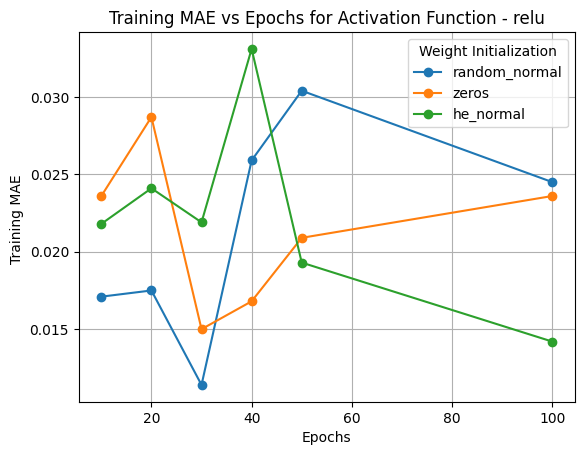

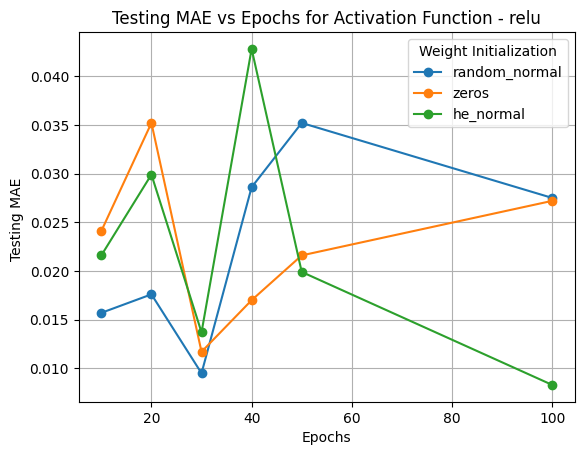

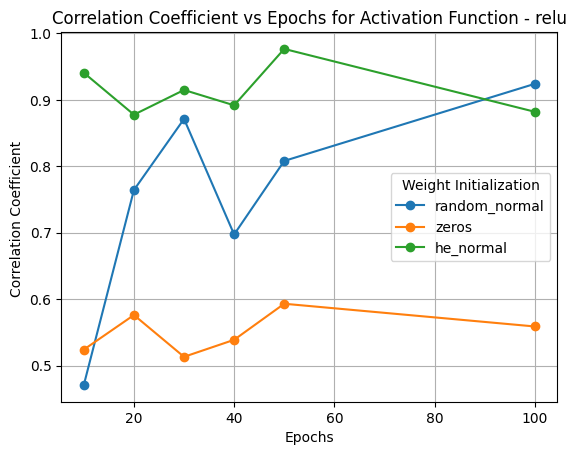

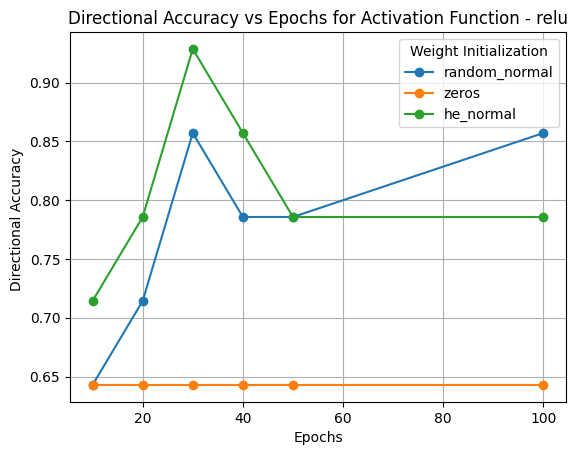

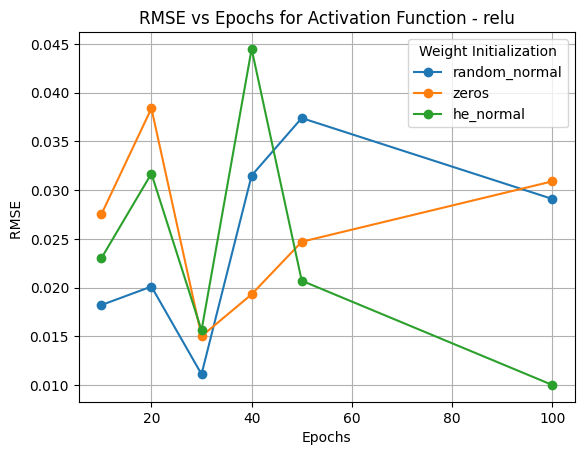

...

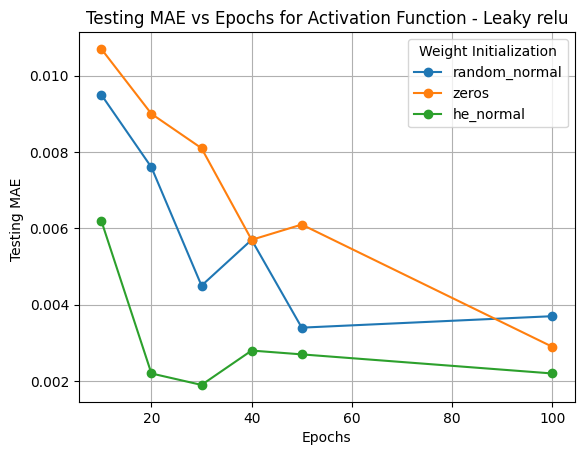

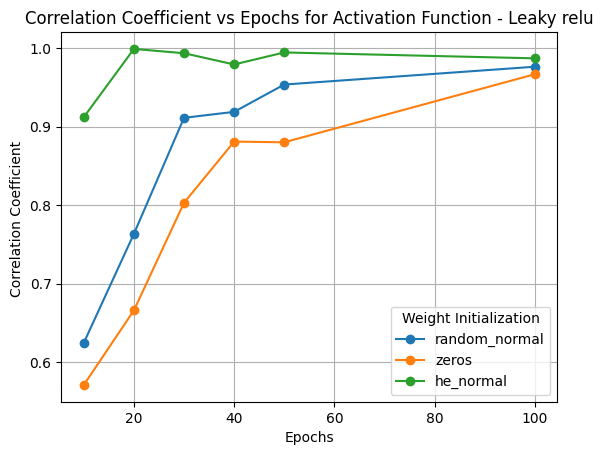

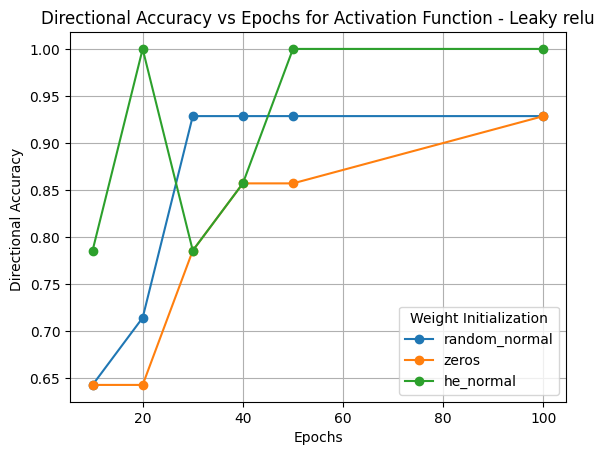

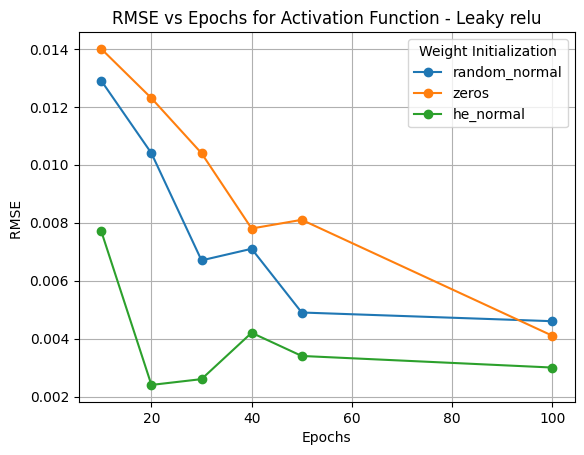

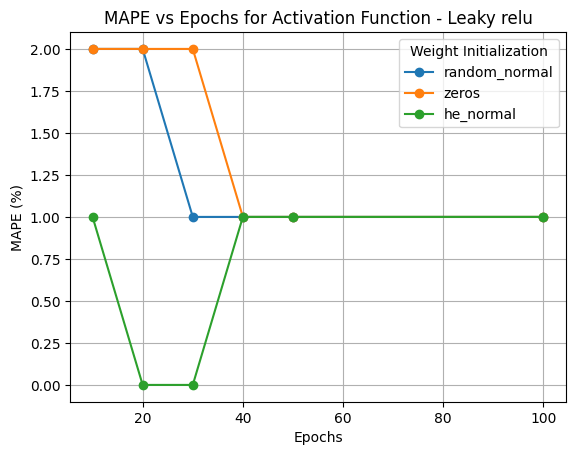

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

data = '''
Sl.No\tActivation Function\tWeight Initialization\tEpochs\tTraining MAE\tTesting MAE\tCorrelation Coefficient\tDirectional Accuracy\tRMSE\tMAPE\tGeneralization Gap (MAE)
1\trelu\trandom_normal\t10\t0.0171\t0.0157\t0.4708\t0.6429\t0.0182\t4%\t-0.0014
2\trelu\trandom_normal\t20\t0.0175\t0.0176\t0.7642\t0.7143\t0.0201\t4%\t0.0001
3\trelu\trandom_normal\t30\t0.0114\t0.0095\t0.8712\t0.8571\t0.0111\t2%\t-0.0019
4\trelu\trandom_normal\t40\t0.0259\t0.0286\t0.6973\t0.7857\t0.0315\t7%\t0.0027
5\trelu\trandom_normal\t50\t0.0304\t0.0352\t0.8080\t0.7857\t0.0374\t8%\t0.0047
6\trelu\trandom_normal\t100\t0.0245\t0.0275\t0.9240\t0.8571\t0.0291\t6%\t0.0030
1\trelu\tzeros\t10\t0.0236\t0.0241\t0.5240\t0.6429\t0.0275\t6%\t0.0005
2\trelu\tzeros\t20\t0.0287\t0.0352\t0.5760\t0.6429\t0.0384\t8%\t0.0065
3\trelu\tzeros\t30\t0.0150\t0.0117\t0.5131\t0.6429\t0.0150\t3%\t-0.0034
4\trelu\tzeros\t40\t0.0168\t0.0170\t0.5387\t0.6429\t0.0193\t4%\t0.0002
5\trelu\tzeros\t50\t0.0209\t0.0216\t0.5930\t0.6429\t0.0247\t5%\t0.0007
6\trelu\tzeros\t100\t0.0236\t0.0272\t0.5588\t0.6429\t0.0309\t6%\t0.0037
1\trelu\the_normal\t10\t0.0218\t0.0216\t0.9407\t0.7143\t0.0230\t5%\t-0.0002
2\trelu\the_normal\t20\t0.0241\t0.0299\t0.8776\t0.7857\t0.0317\t7%\t0.0059
3\trelu\the_normal\t30\t0.0219\t0.0137\t0.9148\t0.9286\t0.0156\t3%\t-0.0082
4\trelu\the_normal\t40\t0.0331\t0.0428\t0.8917\t0.8571\t0.0445\t10%\t0.0097
5\trelu\the_normal\t50\t0.0193\t0.0199\t0.9766\t0.7857\t0.0207\t5%\t0.0006
6\trelu\the_normal\t100\t0.0142\t0.0083\t0.8820\t0.7857\t0.0100\t2%\t-0.0059
1\ttanh\trandom_normal\t10\t0.0100\t0.0070\t0.7714\t0.7857\t0.0100\t2%\t-0.0030
2\ttanh\trandom_normal\t20\t0.0047\t0.0031\t0.9629\t0.9286\t0.0043\t1%\t-0.0016
3\ttanh\trandom_normal\t30\t0.0043\t0.0026\t0.9746\t0.9286\t0.0037\t1%\t-0.0018
4\ttanh\trandom_normal\t40\t0.0039\t0.0023\t0.9792\t0.9286\t0.0034\t1%\t-0.0016
5\ttanh\trandom_normal\t50\t0.0035\t0.0020\t0.9845\t0.9286\t0.0028\t0%\t-0.0015
6\ttanh\trandom_normal\t100\t0.0029\t0.0014\t0.9936\t1.0000\t0.0018\t0%\t-0.0015
1\ttanh\tzeros\t10\t0.0128\t0.0090\t0.6101\t0.6429\t0.0126\t2%\t-0.0038
2\ttanh\tzeros\t20\t0.0110\t0.0079\t0.7304\t0.7857\t0.0111\t2%\t-0.0031
3\ttanh\tzeros\t30\t0.0083\t0.0059\t0.8553\t0.7857\t0.0086\t1%\t-0.0024
4\ttanh\tzeros\t40\t0.0061\t0.0039\t0.9325\t0.9286\t0.0057\t1%\t-0.0022
5\ttanh\tzeros\t50\t0.0063\t0.0041\t0.9279\t0.9286\t0.0060\t1%\t-0.0022
6\ttanh\tzeros\t100\t0.0042\t0.0024\t0.9782\t0.9286\t0.0034\t1%\t-0.0018
1\ttanh\the_normal\t10\t0.0041\t0.0031\t0.9871\t0.9286\t0.0036\t1%\t-0.0010
2\ttanh\the_normal\t20\t0.0037\t0.0051\t0.9987\t1.0000\t0.0053\t1%\t0.0014
3\ttanh\the_normal\t30\t0.0029\t0.0011\t0.9976\t1.0000\t0.0014\t0%\t-0.0018
4\ttanh\the_normal\t40\t0.0047\t0.0008\t0.9980\t1.0000\t0.0011\t0%\t-0.0039
5\ttanh\the_normal\t50\t0.0027\t0.0021\t0.9981\t0.9286\t0.0024\t0%\t-0.0006
6\ttanh\the_normal\t100\t0.0022\t0.0010\t0.9962\t1.0000\t0.0014\t0%\t-0.0012
1\tLeaky relu\trandom_normal\t10\t0.0131\t0.0095\t0.6245\t0.6429\t0.0129\t2%\t-0.0036
2\tLeaky relu\trandom_normal\t20\t0.0105\t0.0076\t0.7634\t0.7143\t0.0104\t2%\t-0.0029
3\tLeaky relu\trandom_normal\t30\t0.0070\t0.0045\t0.9112\t0.9286\t0.0067\t1%\t-0.0025
4\tLeaky relu\trandom_normal\t40\t0.0071\t0.0057\t0.9188\t0.9286\t0.0071\t1%\t-0.0014
5\tLeaky relu\trandom_normal\t50\t0.0058\t0.0034\t0.9536\t0.9286\t0.0049\t1%\t-0.0024
6\tLeaky relu\trandom_normal\t100\t0.0050\t0.0037\t0.9763\t0.9286\t0.0046\t1%\t-0.0013
1\tLeaky relu\tzeros\t10\t0.0141\t0.0107\t0.5708\t0.6429\t0.0140\t2%\t-0.0034
2\tLeaky relu\tzeros\t20\t0.0124\t0.0090\t0.6658\t0.6429\t0.0123\t2%\t-0.0033
3\tLeaky relu\tzeros\t30\t0.0101\t0.0081\t0.8029\t0.7857\t0.0104\t2%\t-0.0020
4\tLeaky relu\tzeros\t40\t0.0081\t0.0057\t0.8809\t0.8571\t0.0078\t1%\t-0.0024
5\tLeaky relu\tzeros\t50\t0.0084\t0.0061\t0.8800\t0.8571\t0.0081\t1%\t-0.0023
6\tLeaky relu\tzeros\t100\t0.0046\t0.0029\t0.9667\t0.9286\t0.0041\t1%\t-0.0017
1\tLeaky relu\the_normal\t10\t0.0076\t0.0062\t0.9121\t0.7857\t0.0077\t1%\t-0.0013
2\tLeaky relu\the_normal\t20\t0.0044\t0.0022\t0.9990\t1.0000\t0.0024\t0%\t-0.0023
3\tLeaky relu\the_normal\t30\t0.0046\t0.0019\t0.9935\t0.7857\t0.0026\t0%\t-0.0027
4\tLeaky relu\the_normal\t40\t0.0049\t0.0028\t0.9792\t0.8571\t0.0042\t1%\t-0.0021
5\tLeaky relu\the_normal\t50\t0.0042\t0.0027\t0.9945\t1.0000\t0.0034\t1%\t-0.0015
6\tLeaky relu\the_normal\t100\t0.0030\t0.0022\t0.9870\t1.0000\t0.0030\t1%\t-0.0009
'''

# Read data into pandas DataFrame
df = pd.read_csv(StringIO(data), sep='\t')

# Remove % sign from MAPE and convert to numeric
df['MAPE'] = df['MAPE'].str.replace('%', '').astype(float)

# Convert 'Epochs' to numeric
df['Epochs'] = pd.to_numeric(df['Epochs'])

# Get unique activation functions and metrics
activation_functions = df['Activation Function'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting
for activation_function in activation_functions:
    df_af = df[df['Activation Function'] == activation_function]
    for metric in metrics:
        plt.figure()
        for weight_init in df_af['Weight Initialization'].unique():
            df_wi = df_af[df_af['Weight Initialization'] == weight_init]
            plt.plot(df_wi['Epochs'], df_wi[metric], marker='o', label=weight_init)
        plt.xlabel('Epochs')
        plt.ylabel(f"{metric} {'(%)' if metric == 'MAPE' else ''}")
        plt.title(f'{metric} vs Epochs for Activation Function - {activation_function}')
        plt.legend(title='Weight Initialization')
        plt.grid(True)
        plt.show()


6) Peaks comparison of "weight initialization-activation function" Vs metrics with the variation of Epochs for Vanilla RNN with Bar charts.

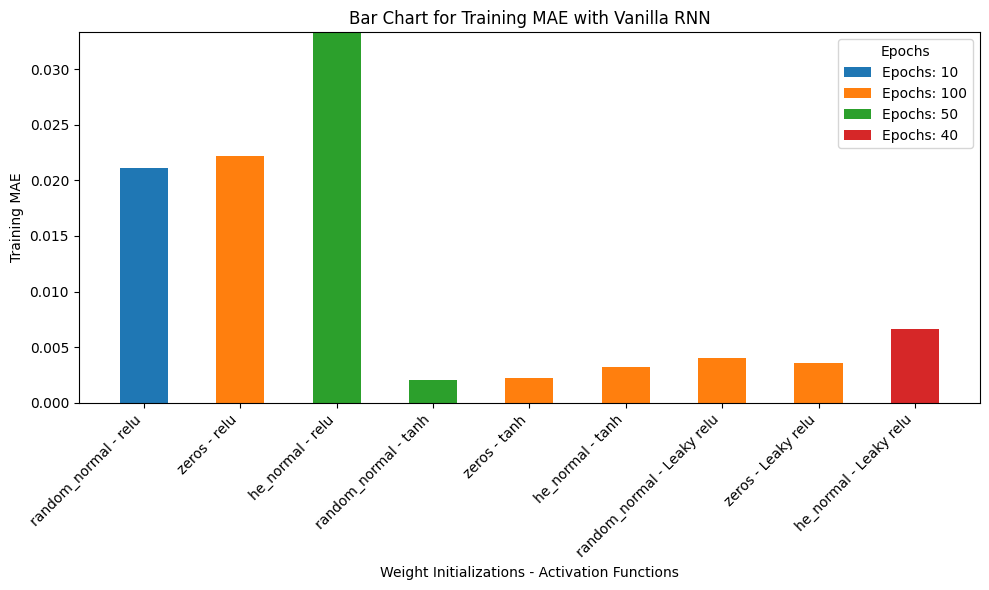

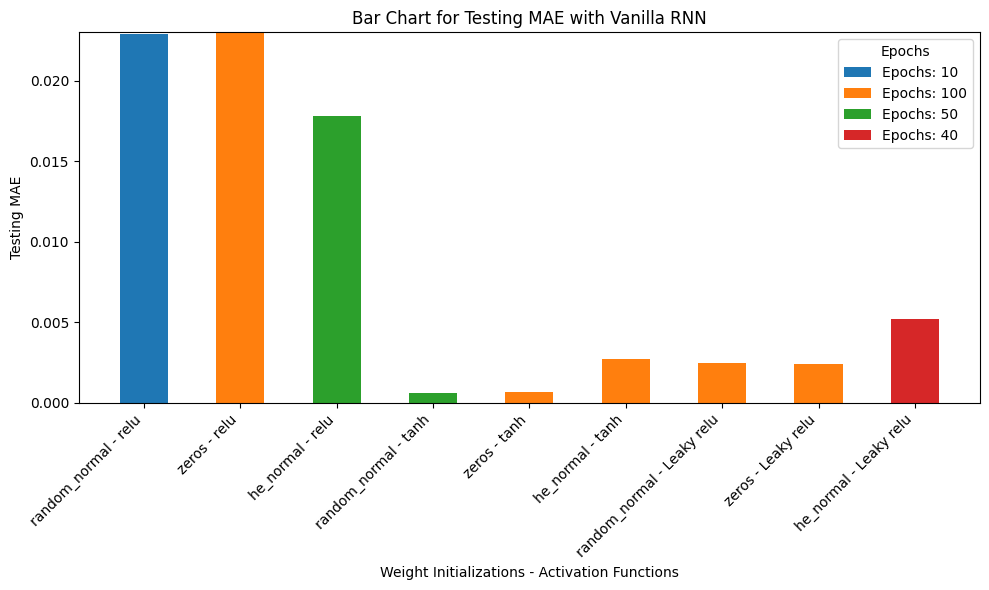

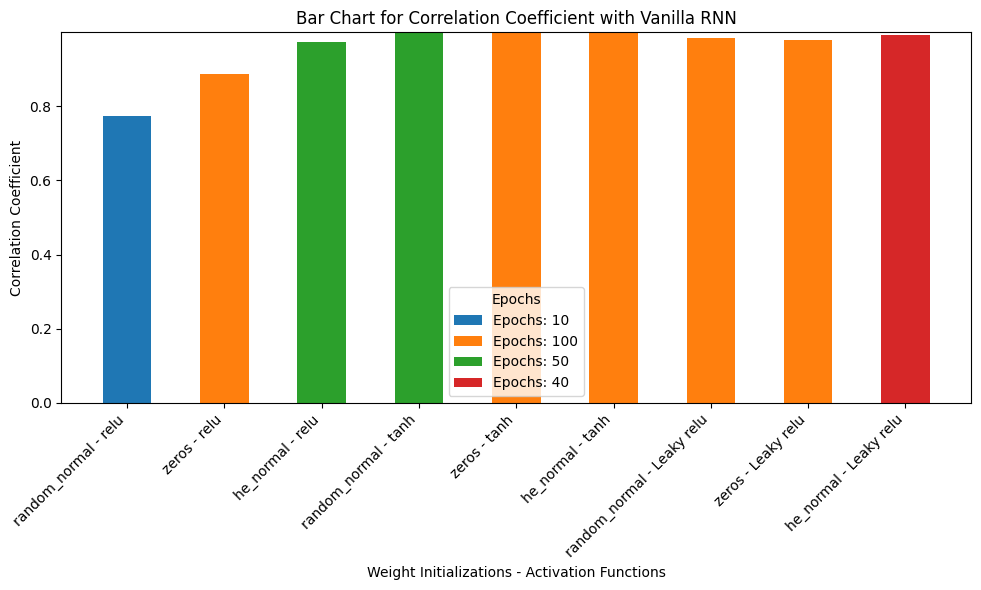

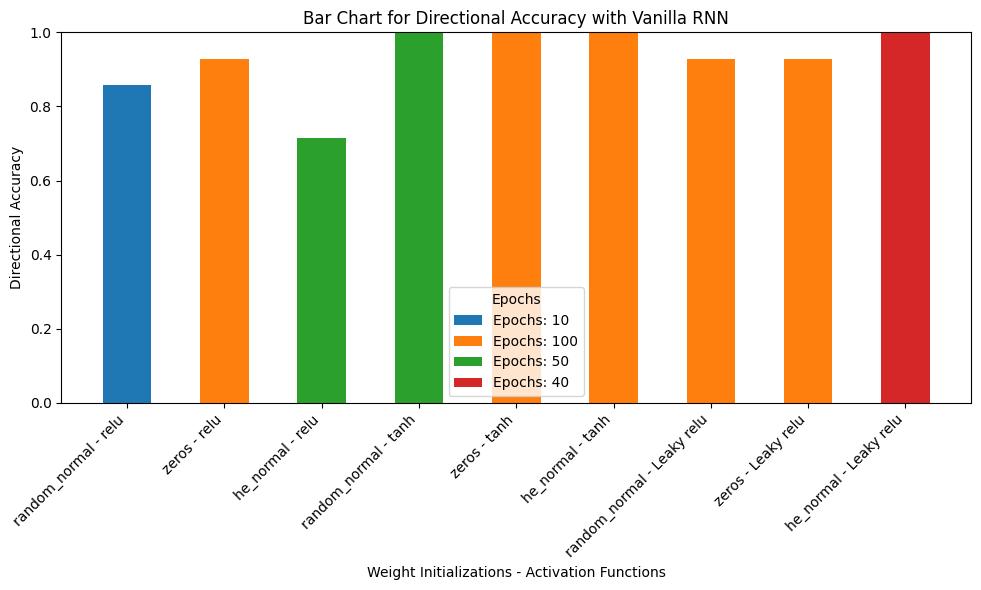

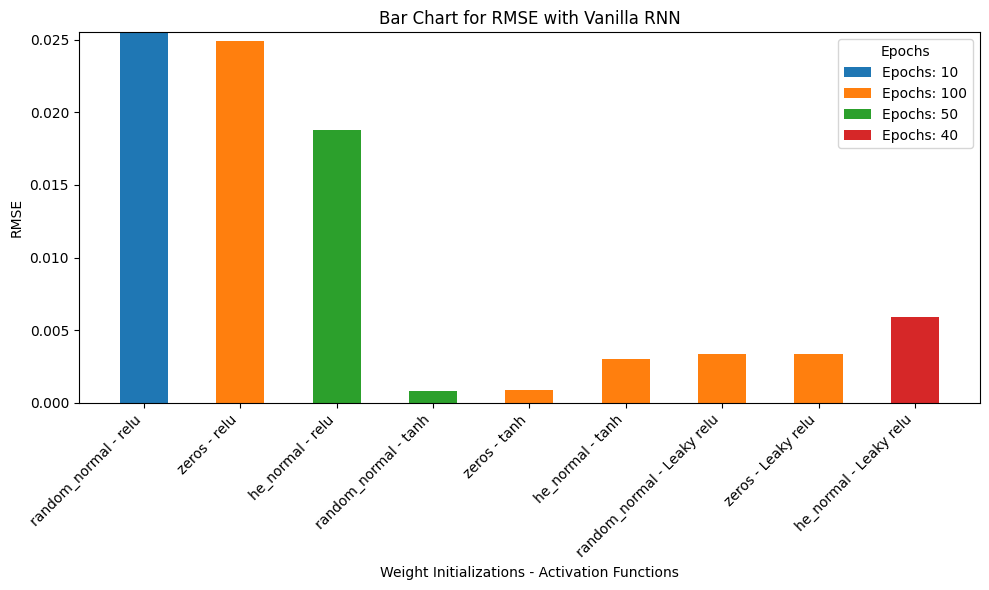

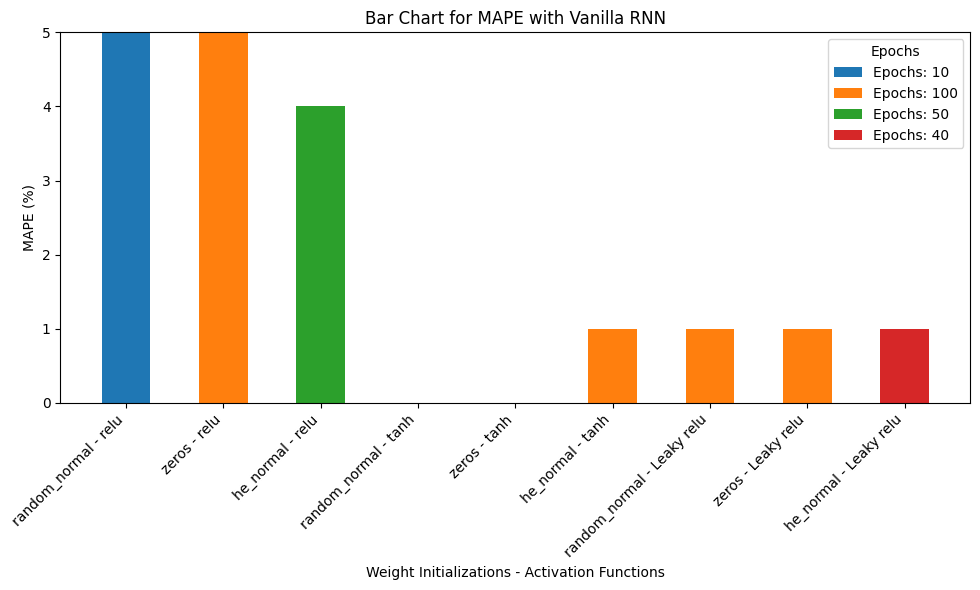

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Creating the DataFrame with the provided Vanilla RNN data
data = {
    'Sl.No': [1, 2, 3, 4, 5, 6, 7, 8, 9],
    'Architecture': ['Vanilla']*9,
    'Activation Function': ['relu', 'relu', 'relu', 'tanh', 'tanh', 'tanh', 'Leaky relu', 'Leaky relu', 'Leaky relu'],
    'Weight Initialization': ['random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal'],
    'Epochs': [10, 100, 50, 50, 100, 100, 100, 100, 40],
    'Training MAE': [0.0211, 0.0222, 0.0333, 0.0021, 0.0022, 0.0032, 0.0040, 0.0036, 0.0066],
    'Testing MAE': [0.0229, 0.0230, 0.0178, 0.0006, 0.0007, 0.0027, 0.0025, 0.0024, 0.0052],
    'Correlation Coefficient': [0.7734, 0.8862, 0.9728, 0.9989, 0.9984, 0.9980, 0.9842, 0.9769, 0.9916],
    'Directional Accuracy': [0.8571, 0.9286, 0.7143, 1.0000, 1.0000, 1.0000, 0.9286, 0.9286, 1.0000],
    'RMSE': [0.0255, 0.0249, 0.0188, 0.0008, 0.0009, 0.0030, 0.0034, 0.0034, 0.0059],
    'MAPE': [5, 5, 4, 0, 0, 1, 1, 1, 1]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Extracting unique weight initialization - activation combinations
df['Weight-Activation'] = df['Weight Initialization'] + ' - ' + df['Activation Function']
unique_combinations = df['Weight-Activation'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting stacked bar charts for each metric
for metric in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.5  # Width of each bar
    epochs = df['Epochs'].unique()
    bottom_values = np.zeros(len(unique_combinations))

    for epoch in epochs:
        subset = df[df['Epochs'] == epoch]
        values = [subset[subset['Weight-Activation'] == comb][metric].values[0] if comb in subset['Weight-Activation'].values else 0 for comb in unique_combinations]
        values = [float(value) if isinstance(value, (int, float, np.number)) else 0 for value in values]
        ax.bar(unique_combinations, values, width, label=f'Epochs: {epoch}', bottom=bottom_values)
        bottom_values += values

    ax.set_xlabel('Weight Initializations - Activation Functions')
    if metric == 'MAPE':
        ax.set_ylabel(f'{metric} (%)')
    else:
        ax.set_ylabel(metric)
    ax.set_title(f'Bar Chart for {metric} with Vanilla RNN')
    ax.legend(title='Epochs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


7) Peaks comparison of "weight initialization-activation function" Vs metrics with the variation of Epochs for GRU with Bar charts.

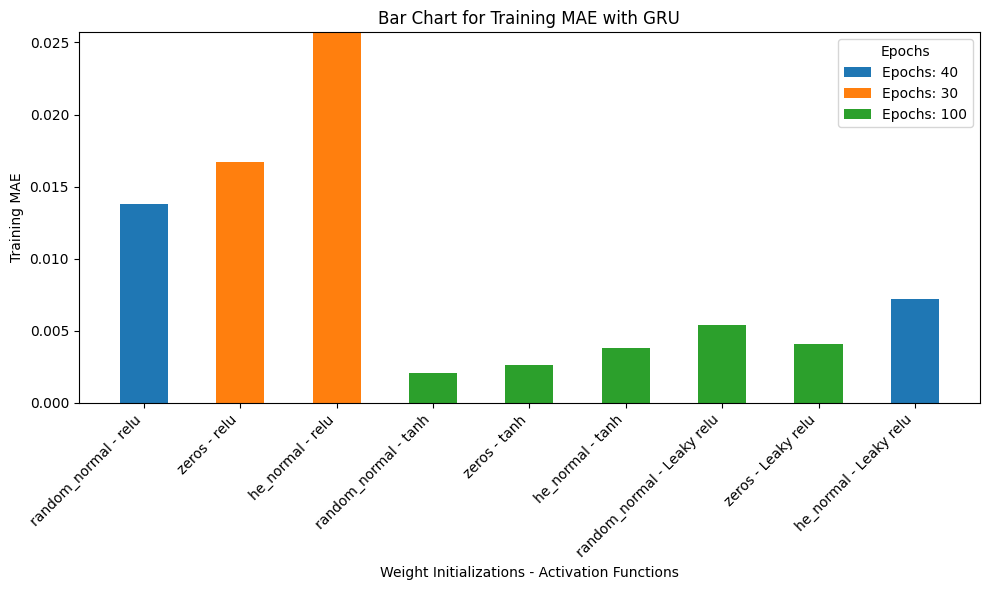

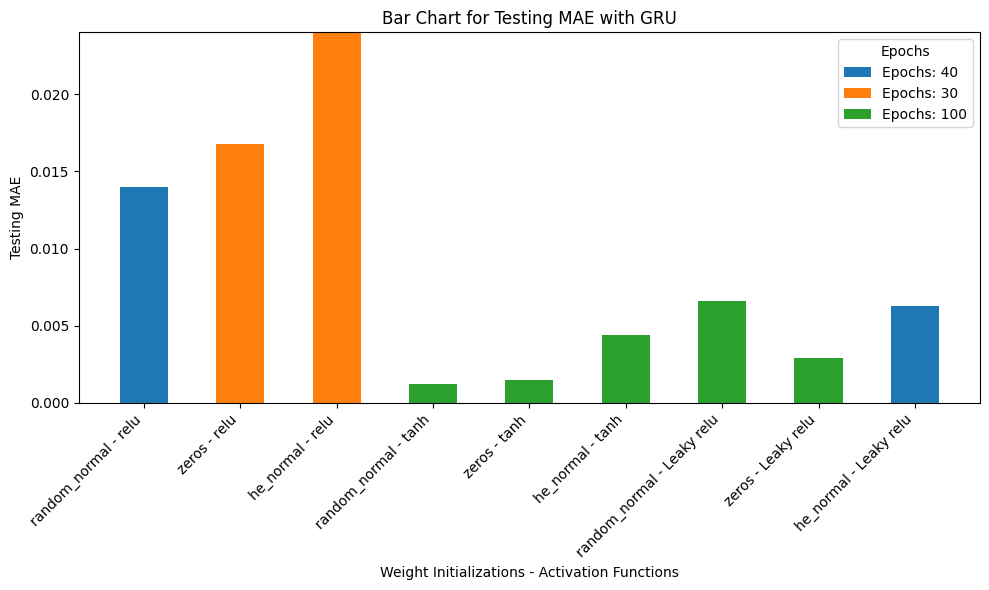

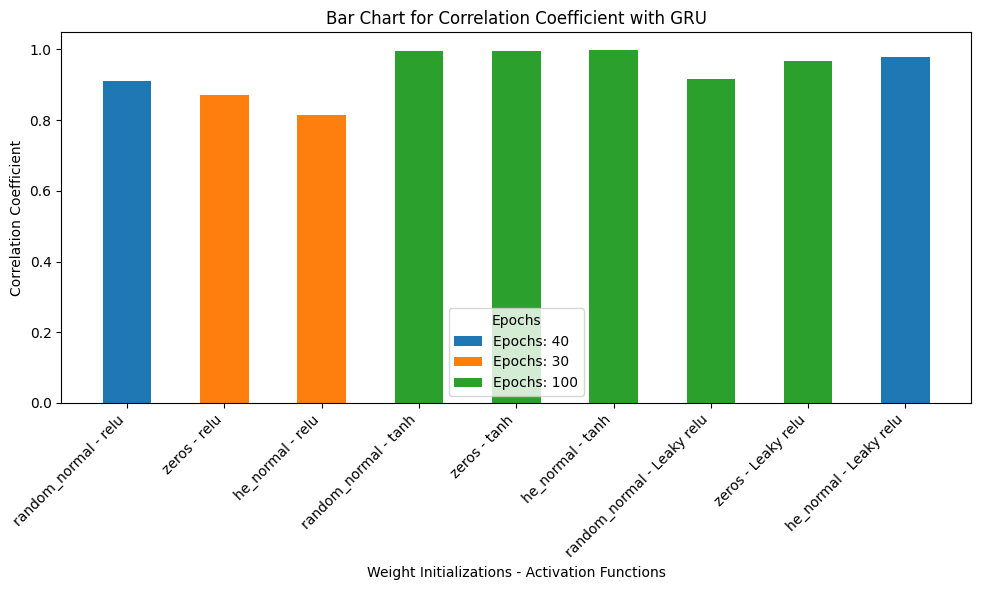

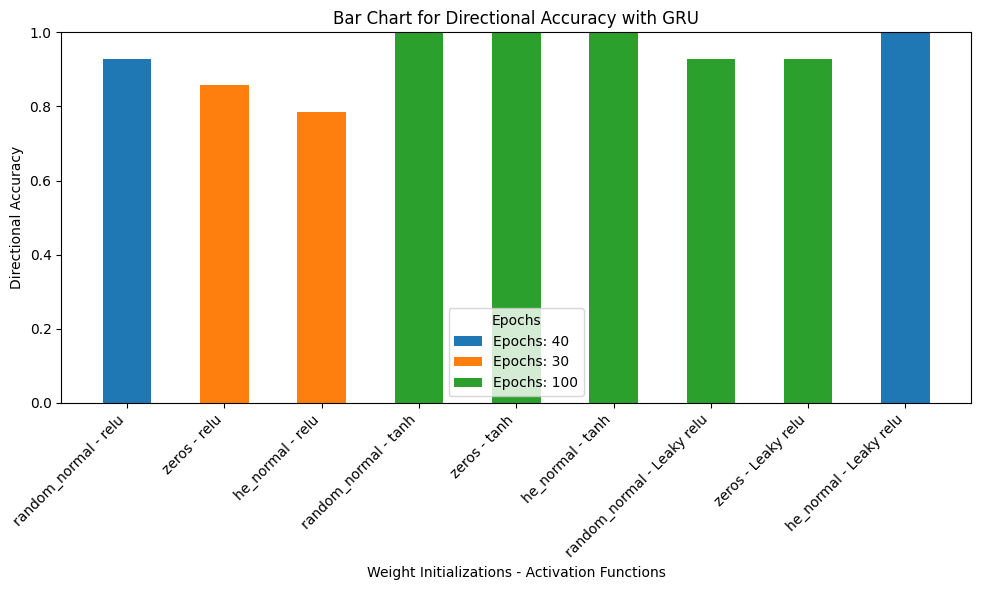

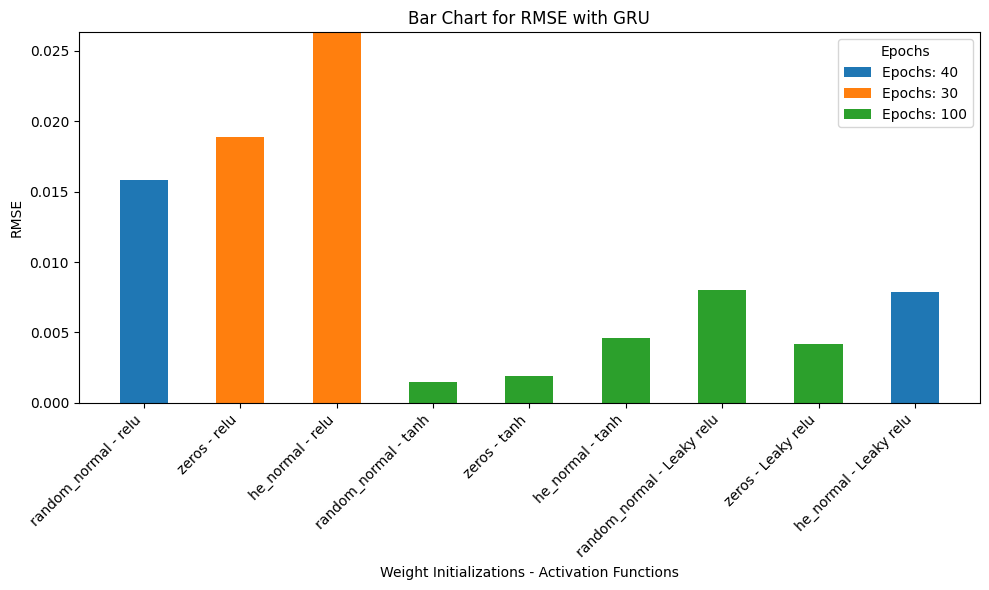

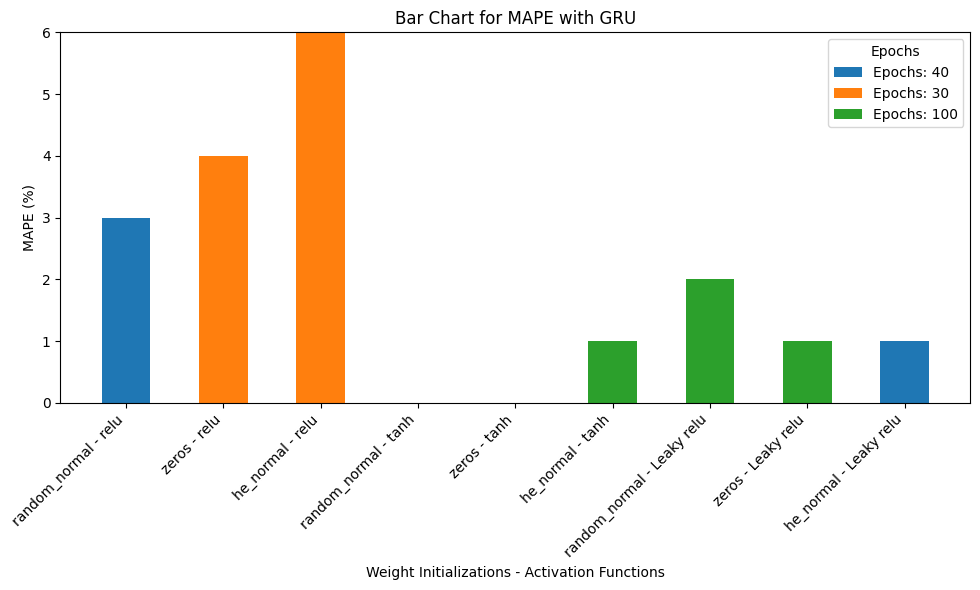

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Creating the DataFrame with the provided GRU data
data = {
    'Sl.No': [1, 2, 3, 4, 5, 6, 7, 8, 9],
    'Architecture': ['GRU']*9,
    'Activation Function': ['relu', 'relu', 'relu', 'tanh', 'tanh', 'tanh', 'Leaky relu', 'Leaky relu', 'Leaky relu'],
    'Weight Initialization': ['random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal'],
    'Epochs': [40, 30, 30, 100, 100, 100, 100, 100, 40],
    'Training MAE': [0.0138, 0.0167, 0.0257, 0.0021, 0.0026, 0.0038, 0.0054, 0.0041, 0.0072],
    'Testing MAE': [0.0140, 0.0168, 0.0240, 0.0012, 0.0015, 0.0044, 0.0066, 0.0029, 0.0063],
    'Correlation Coefficient': [0.9097, 0.8708, 0.8154, 0.9959, 0.9946, 0.9985, 0.9153, 0.9660, 0.9789],
    'Directional Accuracy': [0.9286, 0.8571, 0.7857, 1.0000, 1.0000, 1.0000, 0.9286, 0.9286, 1.0000],
    'RMSE': [0.0158, 0.0189, 0.0263, 0.0015, 0.0019, 0.0046, 0.0080, 0.0042, 0.0079],
    'MAPE': [3, 4, 6, 0, 0, 1, 2, 1, 1],
    'Generalization Gap (MAE)': [0.0003, 0.0001, -0.0017, -0.0010, -0.0011, 0.0006, 0.0012, -0.0011, -0.0009]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Extracting unique weight initialization - activation combinations
df['Weight-Activation'] = df['Weight Initialization'] + ' - ' + df['Activation Function']
unique_combinations = df['Weight-Activation'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting stacked bar charts for each metric
for metric in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.5  # Width of each bar
    epochs = df['Epochs'].unique()
    bottom_values = np.zeros(len(unique_combinations))

    for epoch in epochs:
        subset = df[df['Epochs'] == epoch]
        values = [subset[subset['Weight-Activation'] == comb][metric].values[0] if comb in subset['Weight-Activation'].values else 0 for comb in unique_combinations]
        values = [float(value) if isinstance(value, (int, float, np.number)) else 0 for value in values]
        ax.bar(unique_combinations, values, width, label=f'Epochs: {epoch}', bottom=bottom_values)
        bottom_values += values

    ax.set_xlabel('Weight Initializations - Activation Functions')
    if metric == 'MAPE':
        ax.set_ylabel(f'{metric} (%)')
    else:
        ax.set_ylabel(metric)
    ax.set_title(f'Bar Chart for {metric} with GRU')
    ax.legend(title='Epochs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


8) Peaks comparison of "weight initialization-activation function" Vs metrics with the variation of Epochs for LSTM with Bar charts.

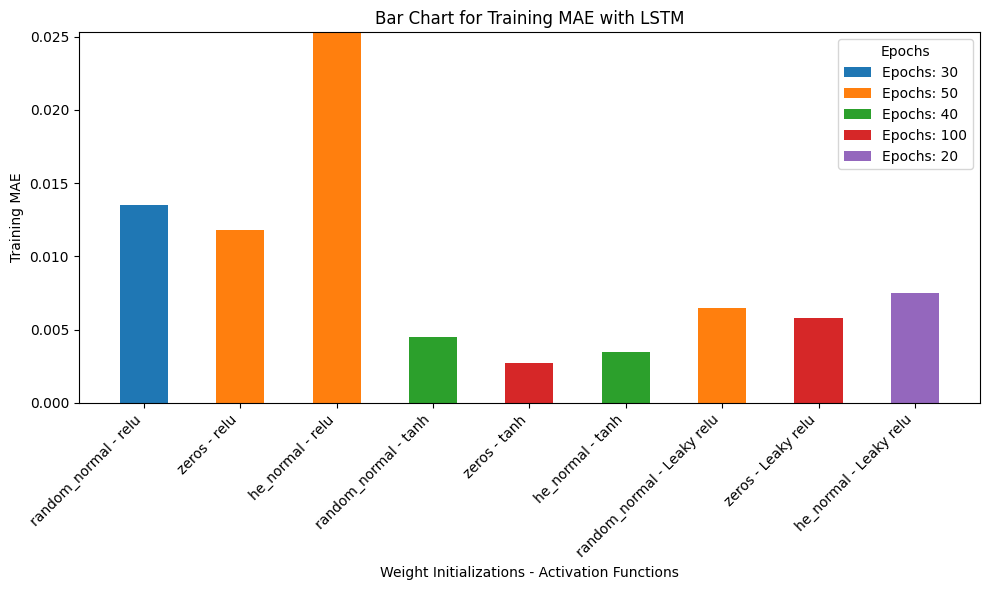

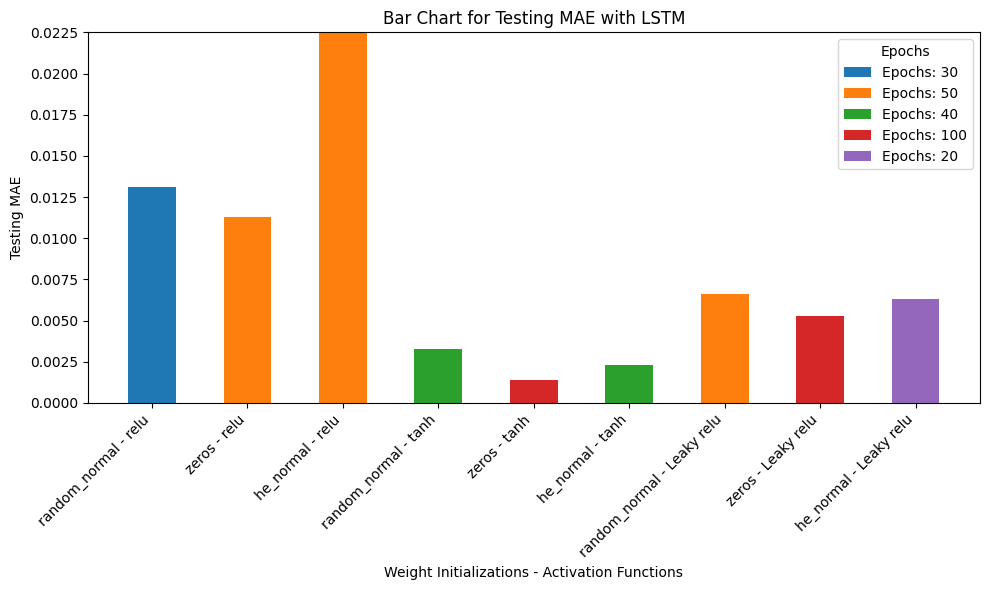

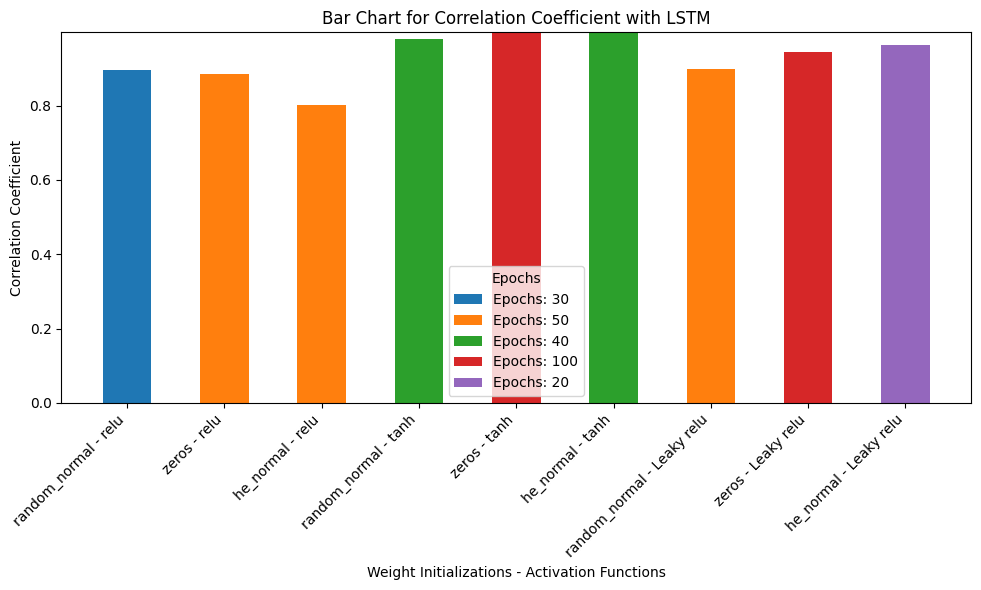

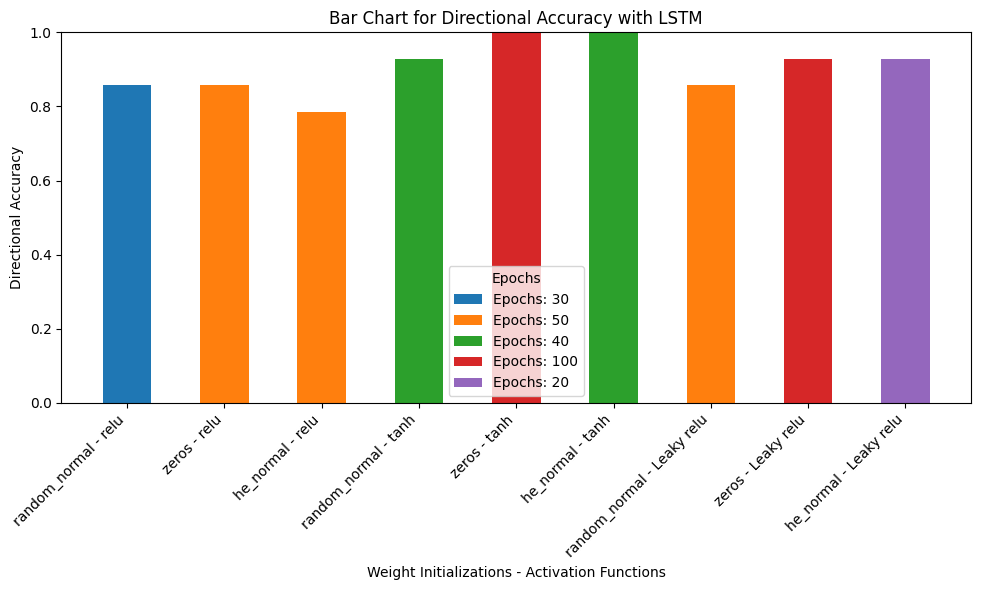

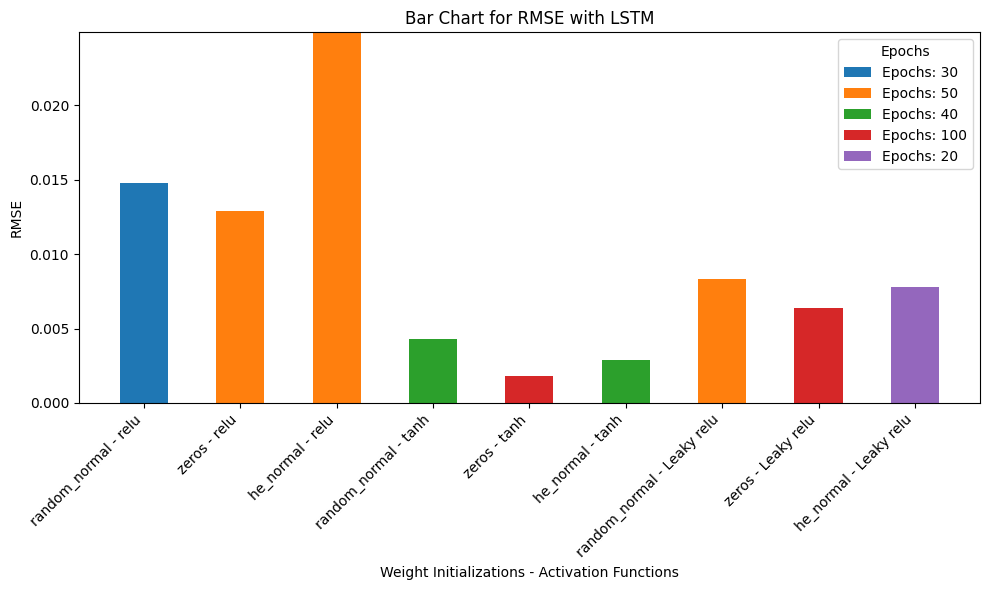

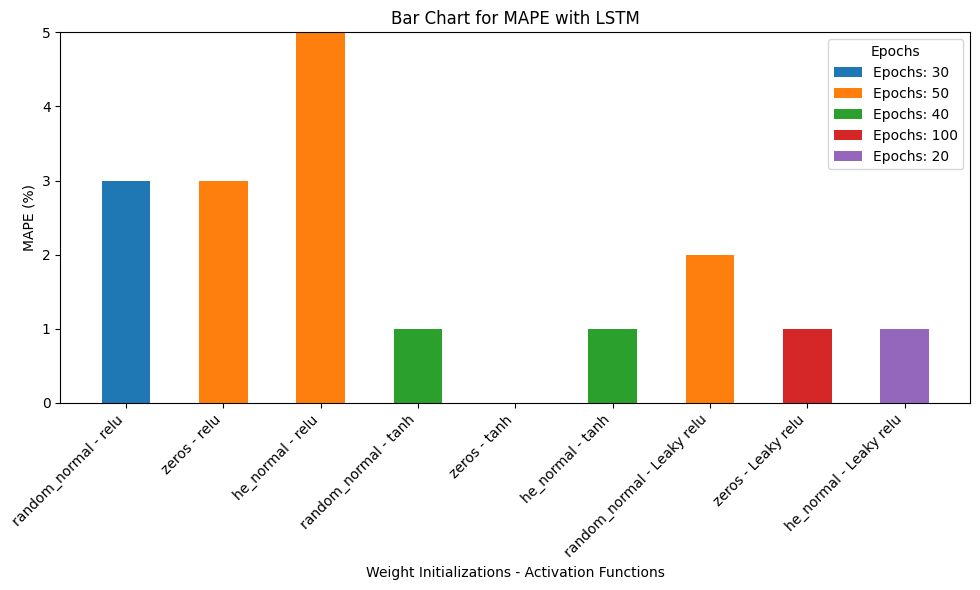

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Creating the DataFrame with the provided LSTM data
data = {
    'Sl.No': [1, 2, 3, 4, 5, 6, 7, 8, 9],
    'Architecture': ['LSTM']*9,
    'Activation Function': ['relu', 'relu', 'relu', 'tanh', 'tanh', 'tanh', 'Leaky relu', 'Leaky relu', 'Leaky relu'],
    'Weight Initialization': ['random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal'],
    'Epochs': [30, 50, 50, 40, 100, 40, 50, 100, 20],
    'Training MAE': [0.0135, 0.0118, 0.0253, 0.0045, 0.0027, 0.0035, 0.0065, 0.0058, 0.0075],
    'Testing MAE': [0.0131, 0.0113, 0.0225, 0.0033, 0.0014, 0.0023, 0.0066, 0.0053, 0.0063],
    'Correlation Coefficient': [0.8967, 0.8861, 0.8017, 0.9780, 0.9942, 0.9971, 0.8972, 0.9445, 0.9631],
    'Directional Accuracy': [0.8571, 0.8571, 0.7857, 0.9286, 1.0000, 1.0000, 0.8571, 0.9286, 0.9286],
    'RMSE': [0.0148, 0.0129, 0.0249, 0.0043, 0.0018, 0.0029, 0.0083, 0.0064, 0.0078],
    'MAPE': [3, 3, 5, 1, 0, 1, 2, 1, 1],
    'Generalization Gap (MAE)': [-0.0004, -0.0005, -0.0028, -0.0012, -0.0012, -0.0011, 0.0001, -0.0005, -0.0011]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Extracting unique weight initialization - activation combinations
df['Weight-Activation'] = df['Weight Initialization'] + ' - ' + df['Activation Function']
unique_combinations = df['Weight-Activation'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting stacked bar charts for each metric
for metric in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.5  # Width of each bar
    epochs = df['Epochs'].unique()
    bottom_values = np.zeros(len(unique_combinations))

    for epoch in epochs:
        subset = df[df['Epochs'] == epoch]
        values = [subset[subset['Weight-Activation'] == comb][metric].values[0] if comb in subset['Weight-Activation'].values else 0 for comb in unique_combinations]
        values = [float(value) if isinstance(value, (int, float, np.number)) else 0 for value in values]
        ax.bar(unique_combinations, values, width, label=f'Epochs: {epoch}', bottom=bottom_values)
        bottom_values += values

    ax.set_xlabel('Weight Initializations - Activation Functions')
    if metric == 'MAPE':
        ax.set_ylabel(f'{metric} (%)')
    else:
        ax.set_ylabel(metric)
    ax.set_title(f'Bar Chart for {metric} with LSTM')
    ax.legend(title='Epochs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


9) Peaks comparison of "weight initialization-activation function" Vs metrics with the variation of Epochs for TCN with Bar charts.

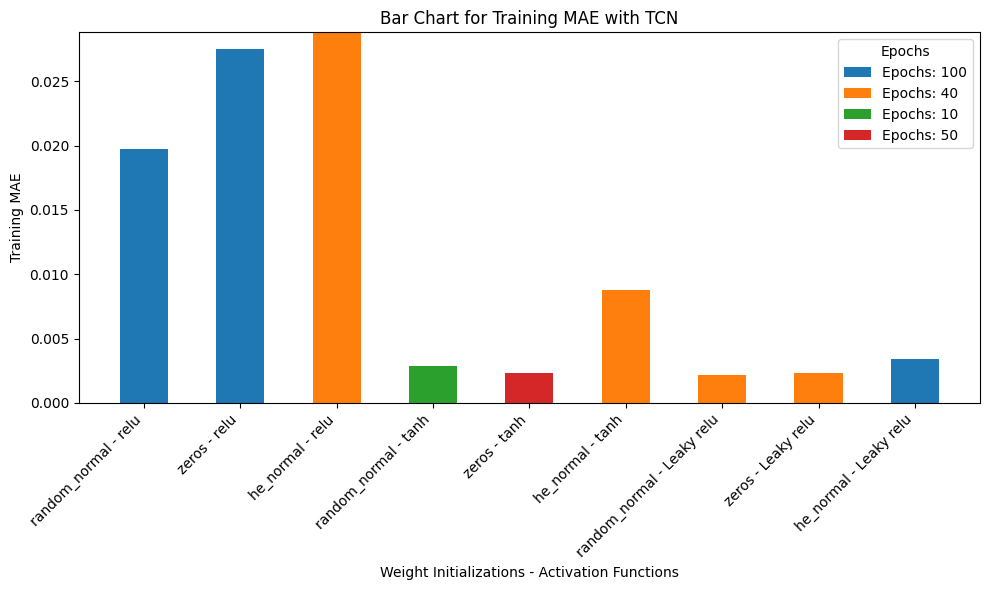

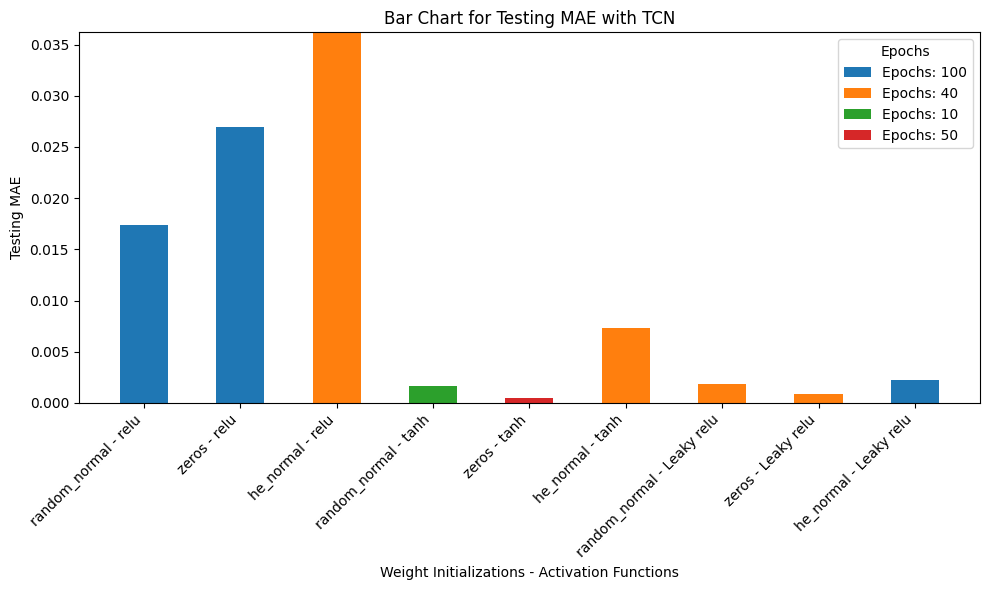

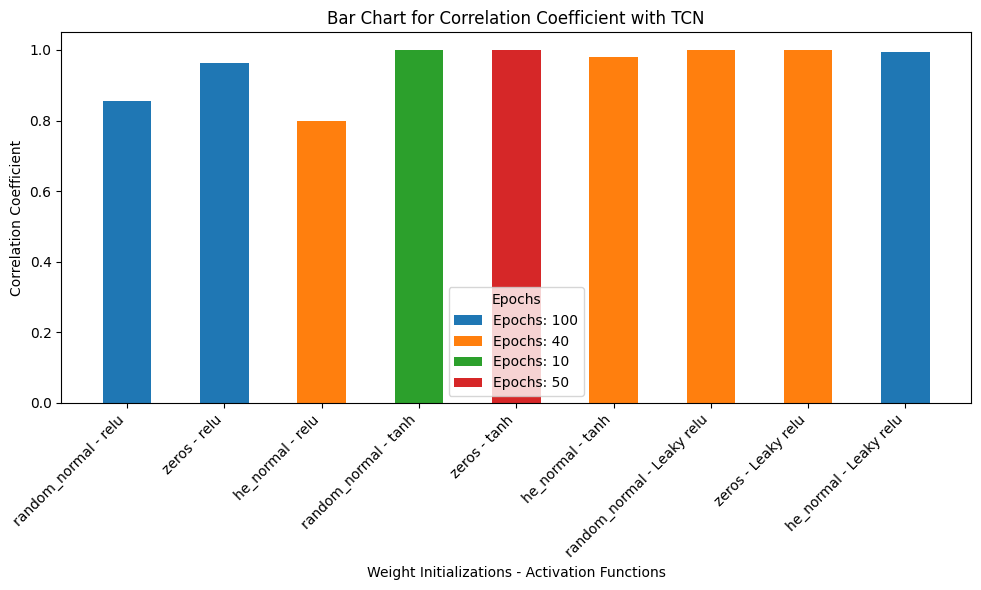

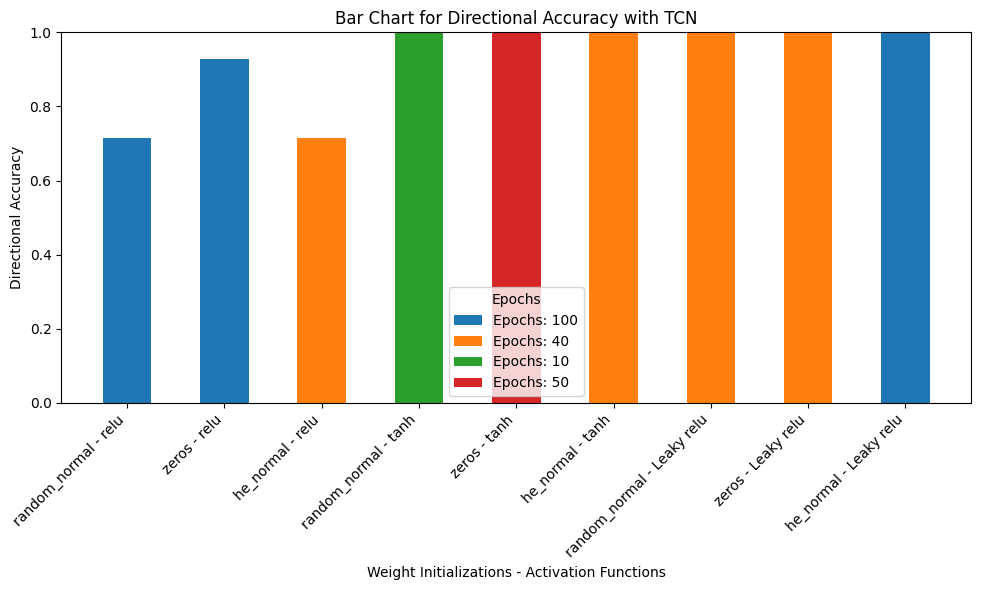

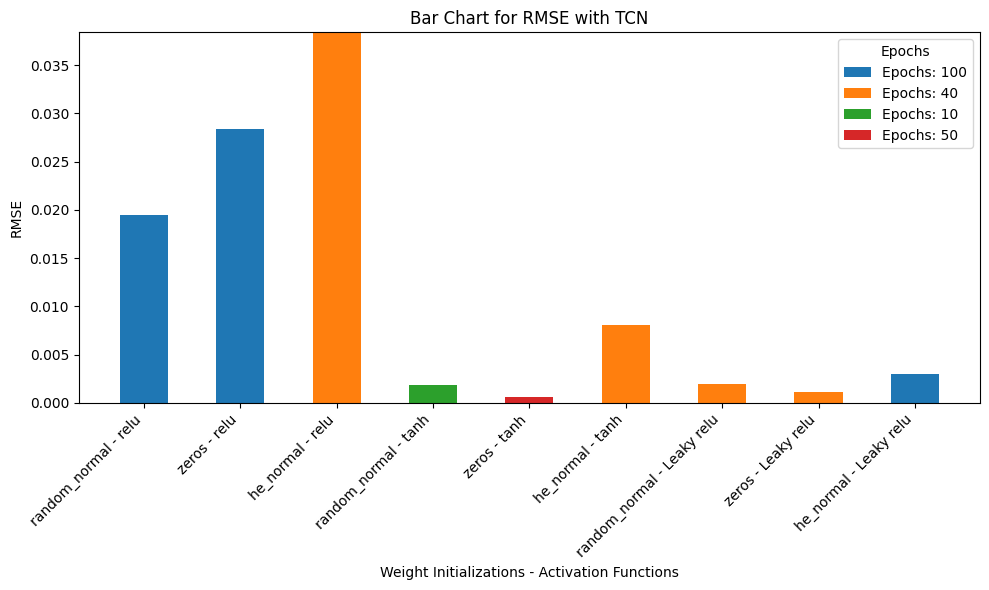

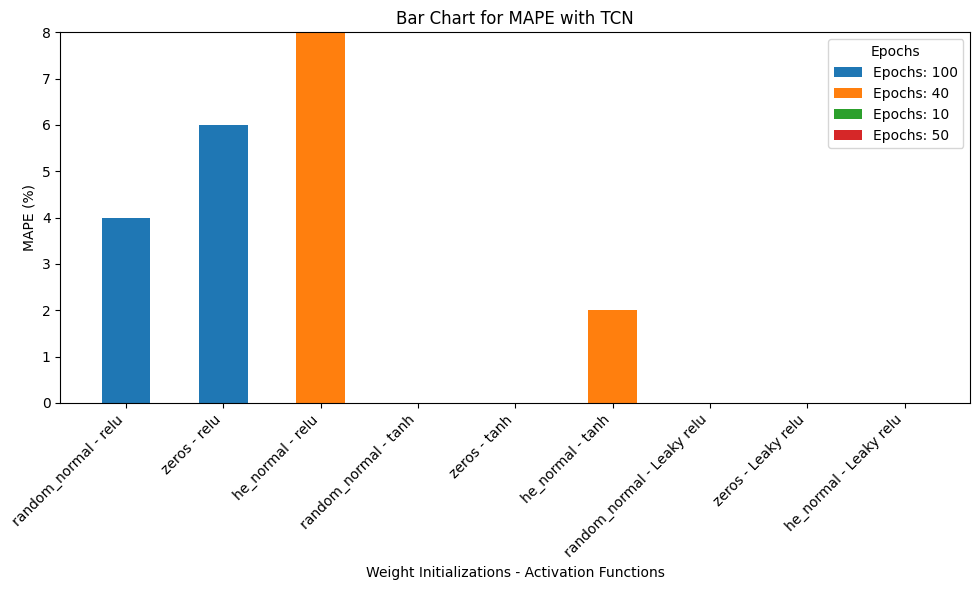

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Creating the DataFrame with the provided TCN data
data = {
    'Sl.No': [1, 2, 3, 4, 5, 6, 7, 8, 9],
    'Architecture': ['TCN']*9,
    'Activation Function': ['relu', 'relu', 'relu', 'tanh', 'tanh', 'tanh', 'Leaky relu', 'Leaky relu', 'Leaky relu'],
    'Weight Initialization': ['random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal'],
    'Epochs': [100, 100, 40, 10, 50, 40, 40, 40, 100],
    'Training MAE': [0.0197, 0.0275, 0.0288, 0.0029, 0.0023, 0.0088, 0.0022, 0.0023, 0.0034],
    'Testing MAE': [0.0174, 0.0270, 0.0362, 0.0017, 0.0005, 0.0073, 0.0018, 0.0009, 0.0022],
    'Correlation Coefficient': [0.8545, 0.9631, 0.7989, 0.9991, 0.9998, 0.9806, 0.9994, 0.9984, 0.9933],
    'Directional Accuracy': [0.7143, 0.9286, 0.7143, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000],
    'RMSE': [0.0195, 0.0284, 0.0384, 0.0019, 0.0006, 0.0081, 0.0020, 0.0011, 0.0030],
    'MAPE': [4, 6, 8, 0, 0, 2, 0, 0, 0],
    'Generalization Gap (MAE)': [-0.0023, -0.0005, 0.0074, -0.0012, -0.0018, -0.0015, -0.0004, -0.0015, -0.0012]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Extracting unique weight initialization - activation combinations
df['Weight-Activation'] = df['Weight Initialization'] + ' - ' + df['Activation Function']
unique_combinations = df['Weight-Activation'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting stacked bar charts for each metric
for metric in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.5  # Width of each bar
    epochs = df['Epochs'].unique()
    bottom_values = np.zeros(len(unique_combinations))

    for epoch in epochs:
        subset = df[df['Epochs'] == epoch]
        values = [subset[subset['Weight-Activation'] == comb][metric].values[0] if comb in subset['Weight-Activation'].values else 0 for comb in unique_combinations]
        values = [float(value) if isinstance(value, (int, float, np.number)) else 0 for value in values]
        ax.bar(unique_combinations, values, width, label=f'Epochs: {epoch}', bottom=bottom_values)
        bottom_values += values

    ax.set_xlabel('Weight Initializations - Activation Functions')
    if metric == 'MAPE':
        ax.set_ylabel(f'{metric} (%)')
    else:
        ax.set_ylabel(metric)
    ax.set_title(f'Bar Chart for {metric} with TCN')
    ax.legend(title='Epochs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


10) Peaks comparison of "weight initialization-activation function" Vs metrics with the variation of Epochs for LSTM-GRU Hybrid with Bar charts.

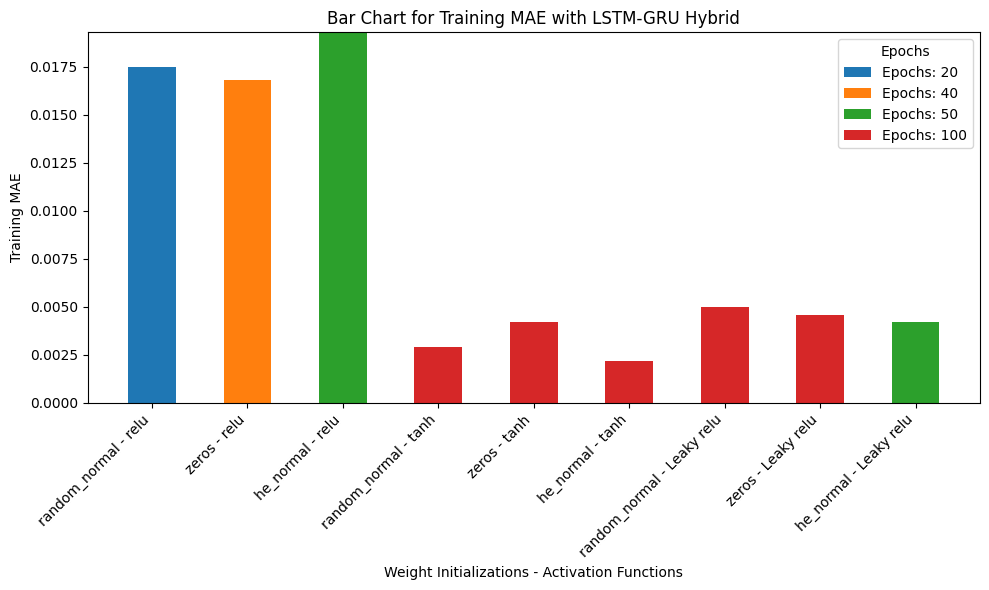

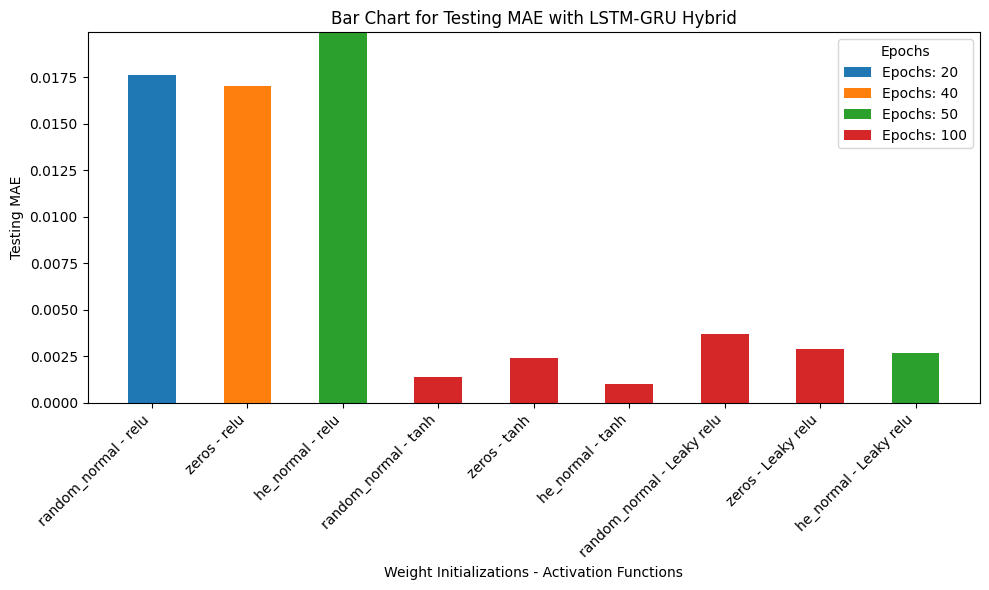

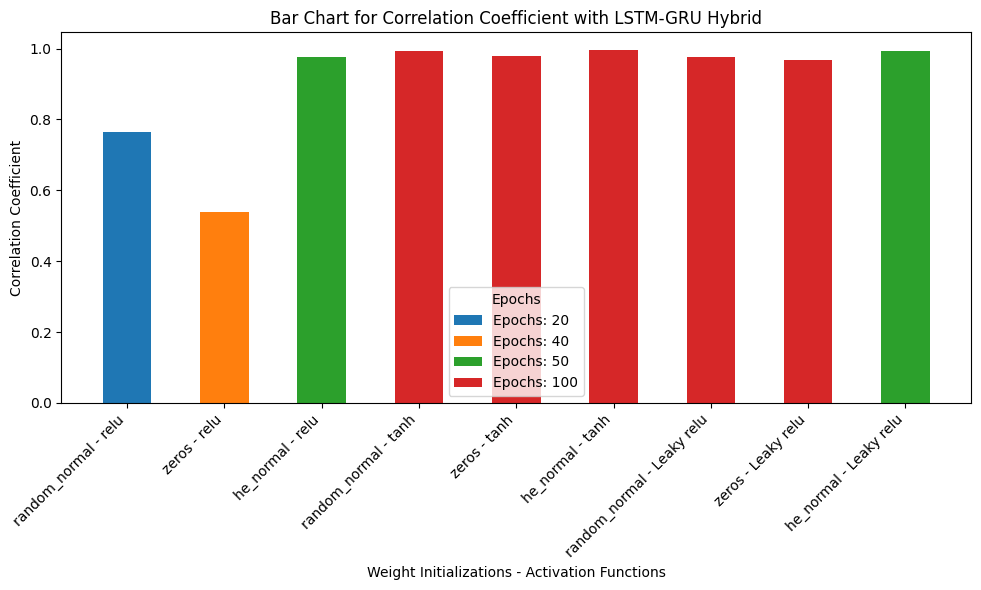

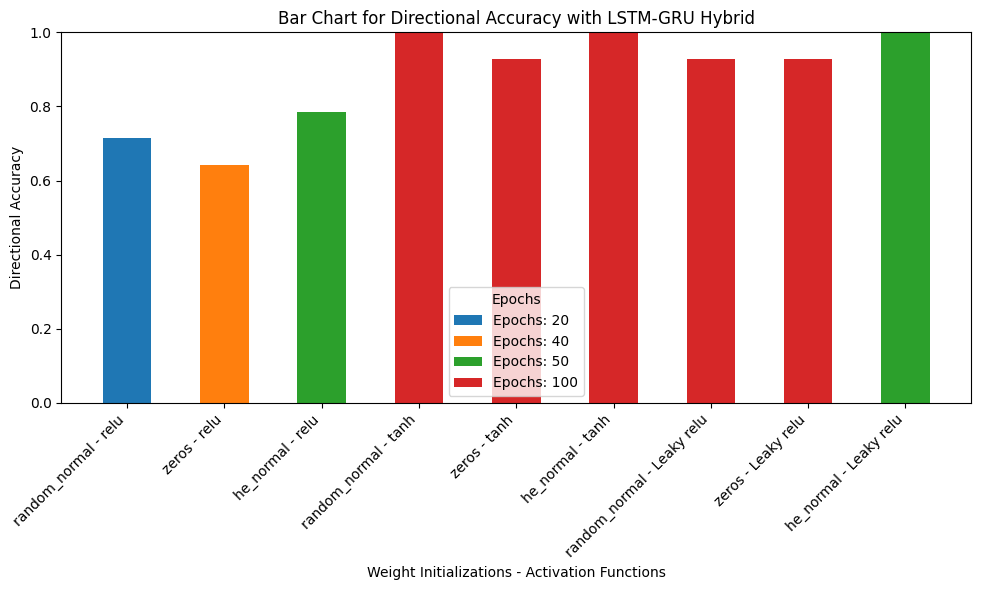

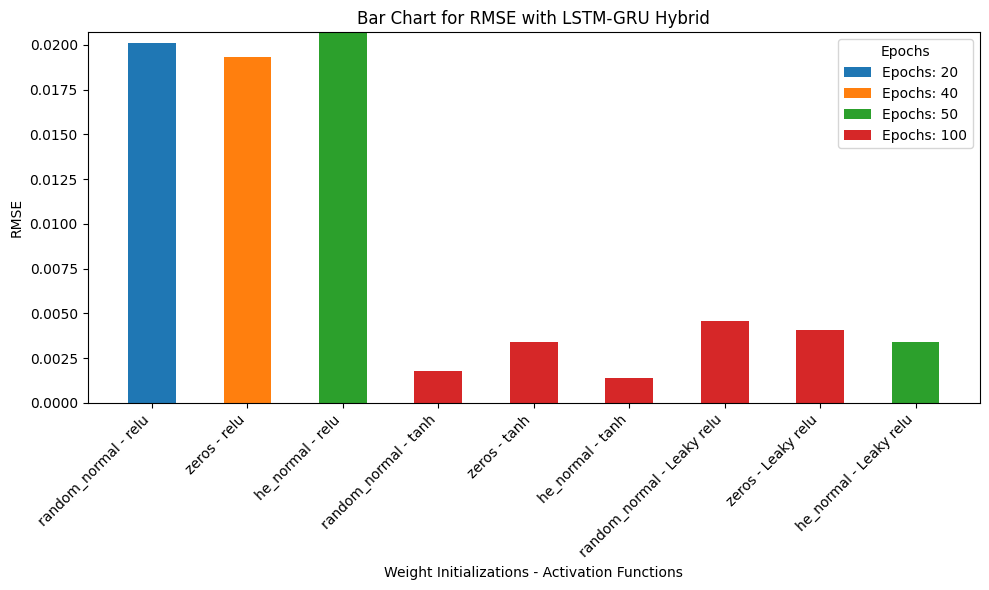

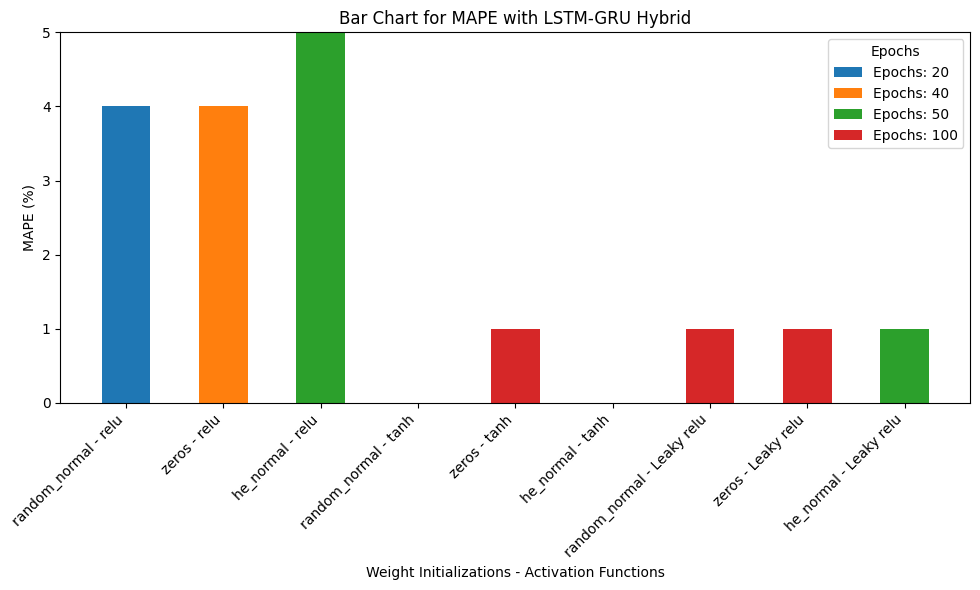

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Creating the DataFrame with the provided LSTM-GRU Hybrid data
data = {
    'Sl.No': [1, 2, 3, 4, 5, 6, 7, 8, 9],
    'Architecture': ['LSTM-GRU']*9,
    'Activation Function': ['relu', 'relu', 'relu', 'tanh', 'tanh', 'tanh', 'Leaky relu', 'Leaky relu', 'Leaky relu'],
    'Weight Initialization': ['random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal', 'random_normal', 'zeros', 'he_normal'],
    'Epochs': [20, 40, 50, 100, 100, 100, 100, 100, 50],
    'Training MAE': [0.0175, 0.0168, 0.0193, 0.0029, 0.0042, 0.0022, 0.0050, 0.0046, 0.0042],
    'Testing MAE': [0.0176, 0.0170, 0.0199, 0.0014, 0.0024, 0.0010, 0.0037, 0.0029, 0.0027],
    'Correlation Coefficient': [0.7642, 0.5387, 0.9766, 0.9936, 0.9782, 0.9962, 0.9763, 0.9667, 0.9945],
    'Directional Accuracy': [0.7143, 0.6429, 0.7857, 1.0000, 0.9286, 1.0000, 0.9286, 0.9286, 1.0000],
    'RMSE': [0.0201, 0.0193, 0.0207, 0.0018, 0.0034, 0.0014, 0.0046, 0.0041, 0.0034],
    'MAPE': [4, 4, 5, 0, 1, 0, 1, 1, 1],
    'Generalization Gap (MAE)': [0.0001, 0.0002, 0.0006, -0.0015, -0.0018, -0.0012, -0.0013, -0.0017, -0.0015]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Extracting unique weight initialization - activation combinations
df['Weight-Activation'] = df['Weight Initialization'] + ' - ' + df['Activation Function']
unique_combinations = df['Weight-Activation'].unique()
metrics = ['Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE']

# Plotting stacked bar charts for each metric
for metric in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.5  # Width of each bar
    epochs = df['Epochs'].unique()
    bottom_values = np.zeros(len(unique_combinations))

    for epoch in epochs:
        subset = df[df['Epochs'] == epoch]
        values = [subset[subset['Weight-Activation'] == comb][metric].values[0] if comb in subset['Weight-Activation'].values else 0 for comb in unique_combinations]
        values = [float(value) if isinstance(value, (int, float, np.number)) else 0 for value in values]
        ax.bar(unique_combinations, values, width, label=f'Epochs: {epoch}', bottom=bottom_values)
        bottom_values += values

    ax.set_xlabel('Weight Initializations - Activation Functions')
    if metric == 'MAPE':
        ax.set_ylabel(f'{metric} (%)')
    else:
        ax.set_ylabel(metric)
    ax.set_title(f'Bar Chart for {metric} with LSTM-GRU Hybrid')
    ax.legend(title='Epochs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


11) Peak of Peaks comparison of "Architectures-Activation-Weight Initialization" Vs Metrics with bar charts.

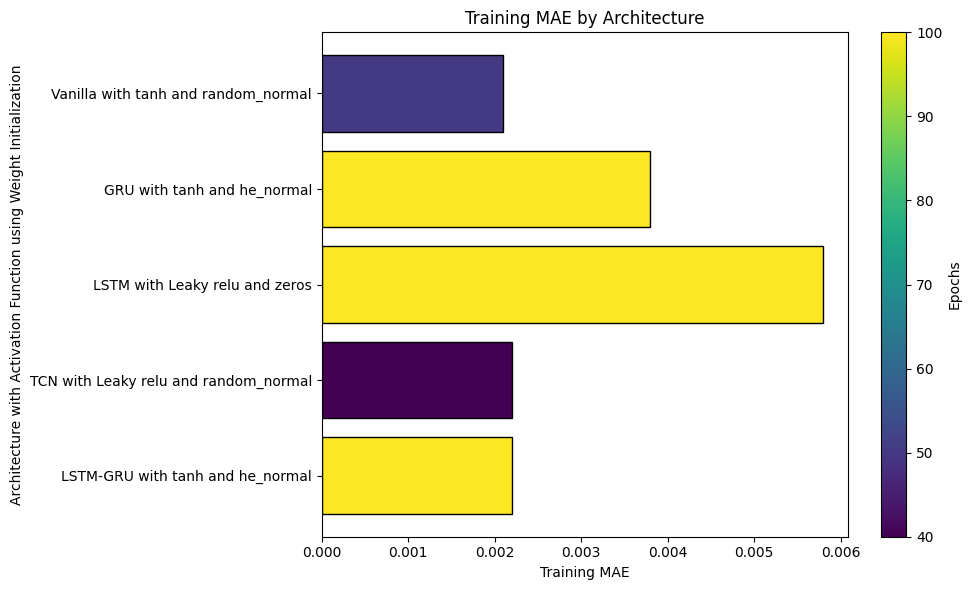

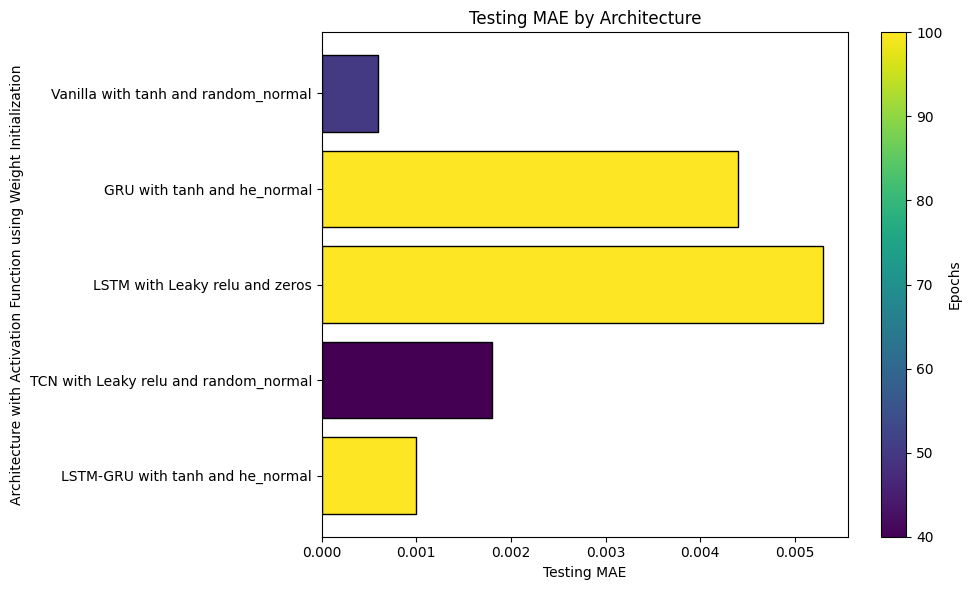

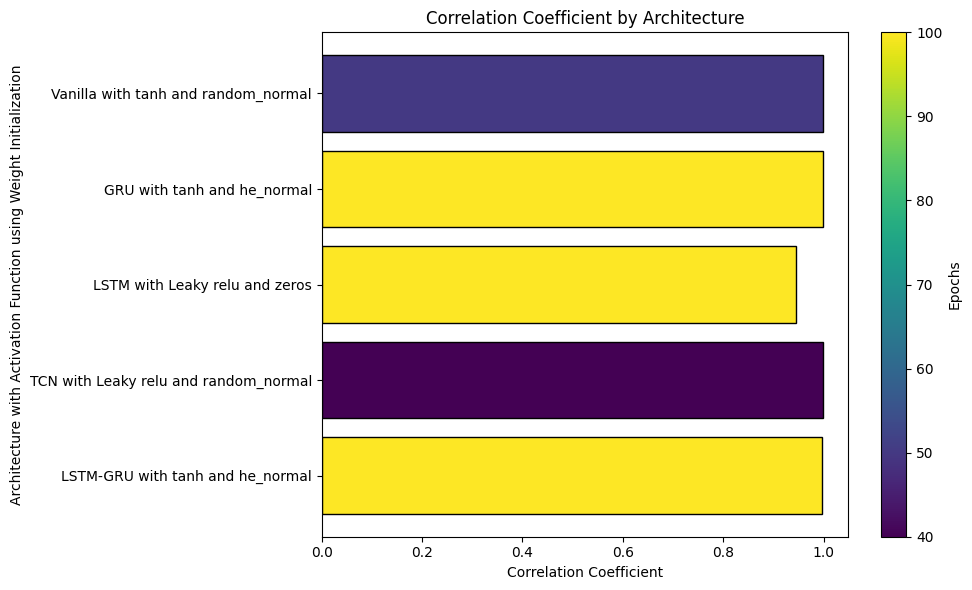

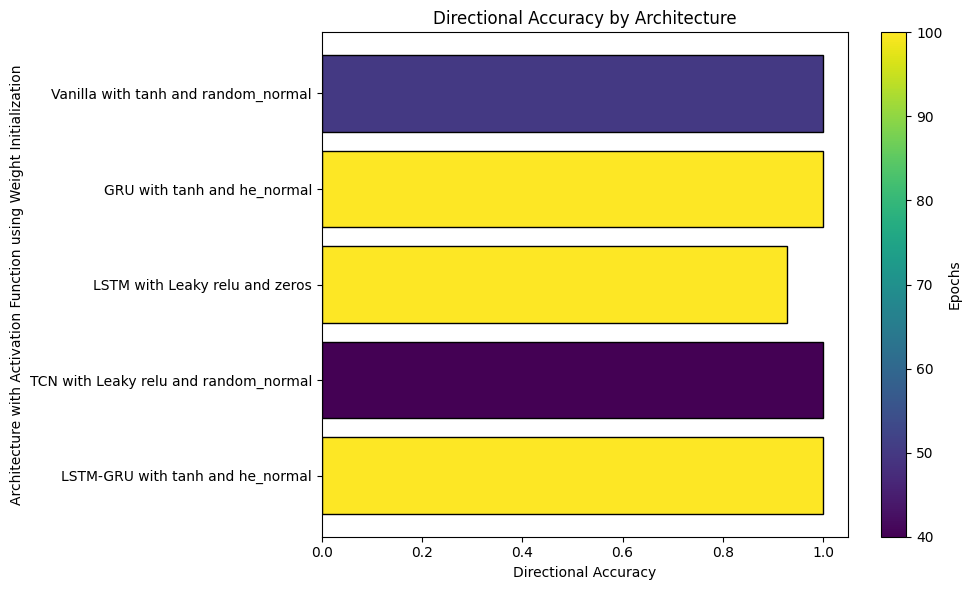

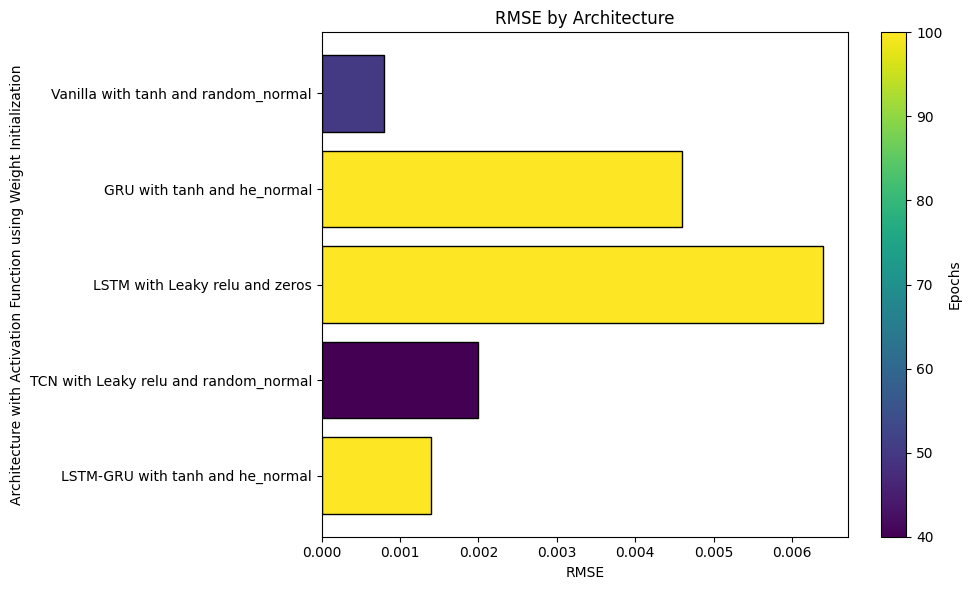

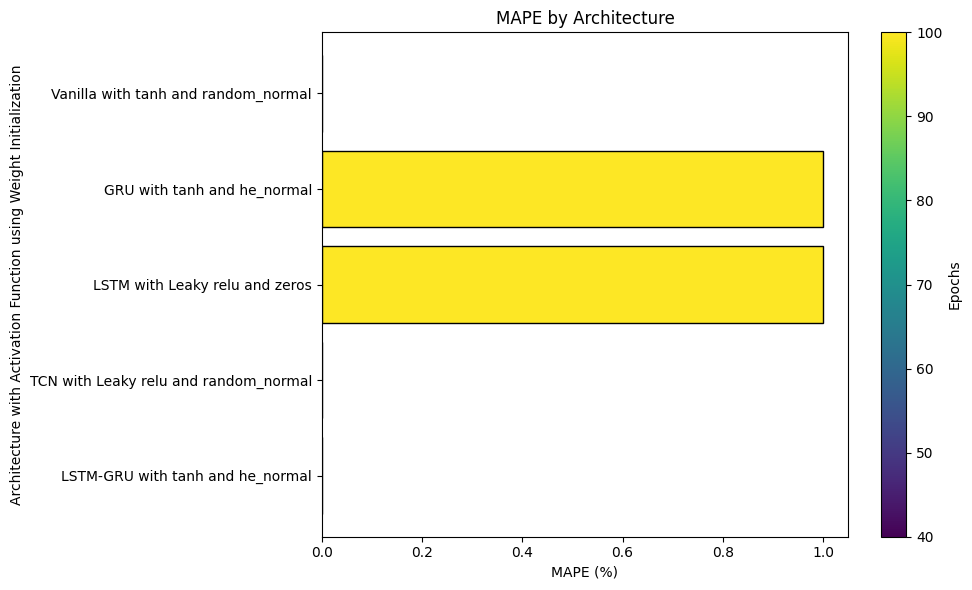

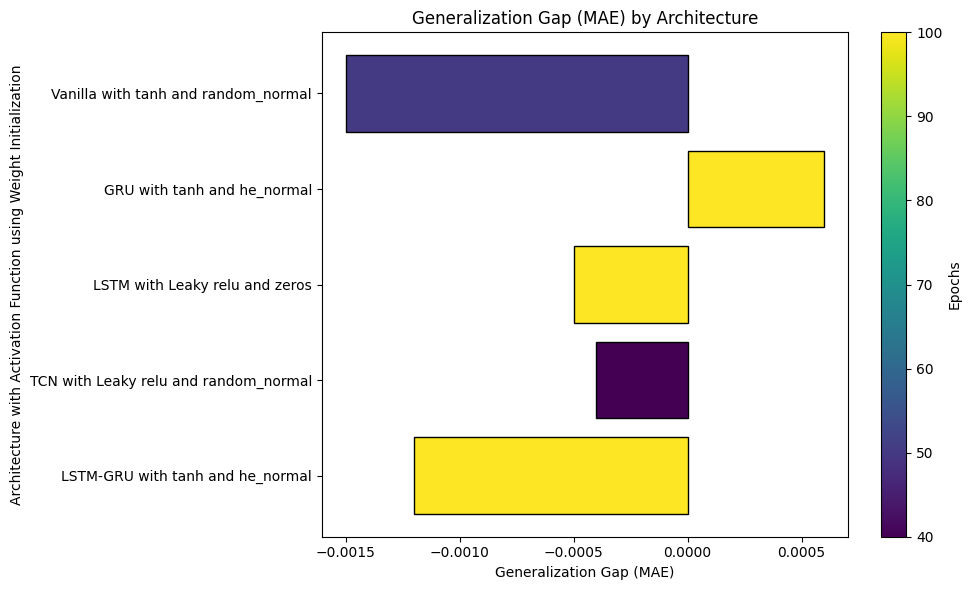

In [ ]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Data input
data = {
    'Sl.No': [1, 2, 3, 4, 5],
    'Architecture': ['Vanilla', 'GRU', 'LSTM', 'TCN', 'LSTM-GRU'],
    'Activation Function': ['tanh', 'tanh', 'Leaky relu', 'Leaky relu', 'tanh'],
    'Weight Initialization': ['random_normal', 'he_normal', 'zeros', 'random_normal', 'he_normal'],
    'Epochs': [50, 100, 100, 40, 100],
    'Training MAE': [0.0021, 0.0038, 0.0058, 0.0022, 0.0022],
    'Testing MAE': [0.0006, 0.0044, 0.0053, 0.0018, 0.0010],
    'Correlation Coefficient': [0.9989, 0.9985, 0.9445, 0.9994, 0.9962],
    'Directional Accuracy': [1.0000, 1.0000, 0.9286, 1.0000, 1.0000],
    'RMSE': [0.0008, 0.0046, 0.0064, 0.0020, 0.0014],
    'MAPE': [0.0, 1.0, 1.0, 0.0, 0.0],  # Replaced percentages with decimal representation
    'Generalization Gap (MAE)': [-0.0015, 0.0006, -0.0005, -0.0004, -0.0012]
}

# Create DataFrame
df = pd.DataFrame(data)

# Create a composite label for architectures, activation functions, and weight initialization
df['Composite Label'] = df['Architecture'] + ' with ' + df['Activation Function'] + ' and ' + df['Weight Initialization']

# List of metrics to plot
metrics = [
    'Training MAE', 'Testing MAE', 'Correlation Coefficient', 'Directional Accuracy', 'RMSE', 'MAPE', 'Generalization Gap (MAE)'
]

# Normalize epochs for color mapping
norm = plt.Normalize(df['Epochs'].min(), df['Epochs'].max())
cmap = plt.cm.viridis

# Loop through each metric and create separate plots
for metric in metrics:
    fig, ax = plt.subplots(figsize=(10, 6))
    bars = ax.barh(
        df['Composite Label'],
        df[metric],
        color=cmap(norm(df['Epochs'])),
        edgecolor='black'
    )
    ax.set_xlabel(metric if metric != 'MAPE' else 'MAPE (%)')  # Adjust x-label for MAPE
    ax.set_ylabel('Architecture with Activation Function using Weight Initialization')
    ax.set_title(f'{metric} by Architecture')
    ax.invert_yaxis()  # Highest value at the top

    # Add colorbar legend
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Epochs')

    # Show or save the plot
    plt.tight_layout()
    plt.show()  # You can replace this with plt.savefig(f'{metric}.png') to save each plot


12) Comparison of Actual and Predicted Values for Vanilla RNN architecture with a Line Plot.

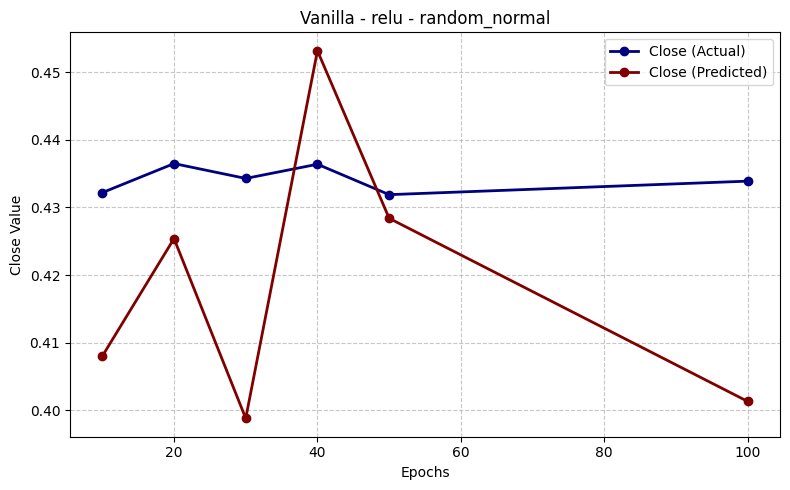

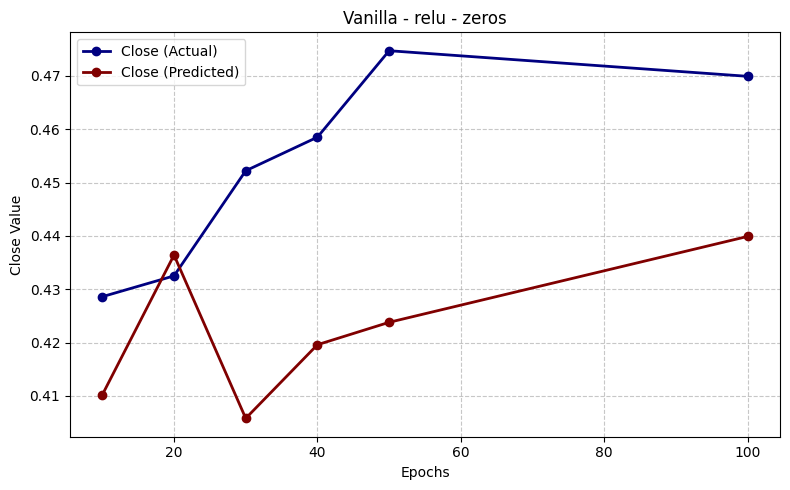

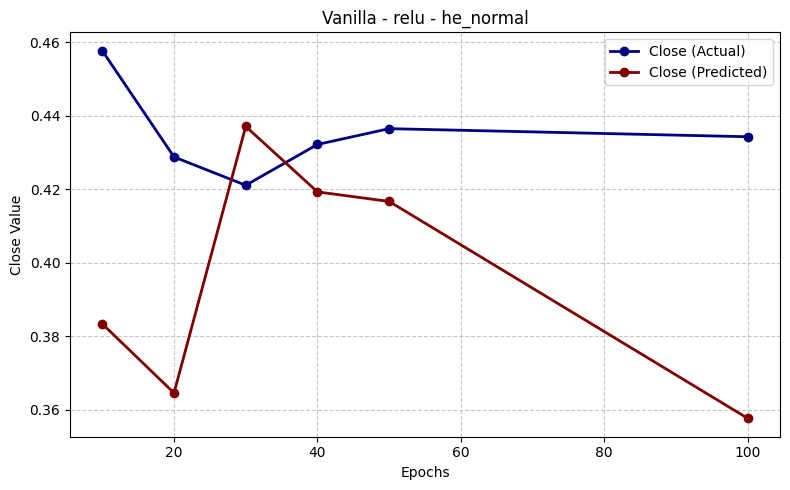

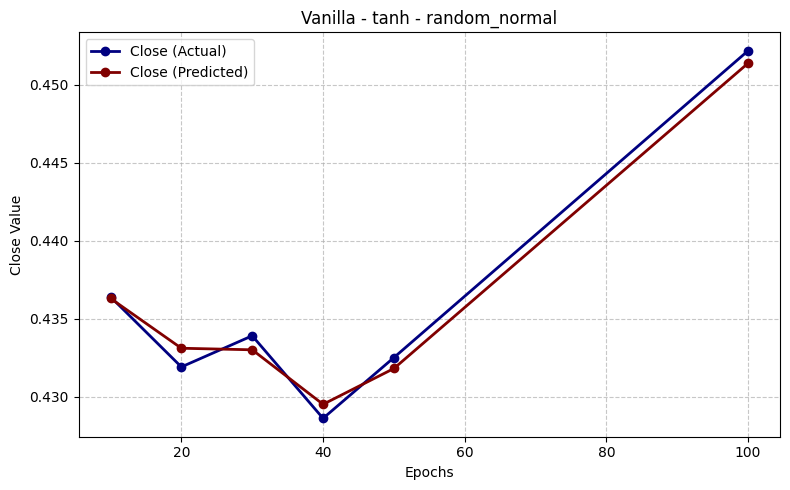

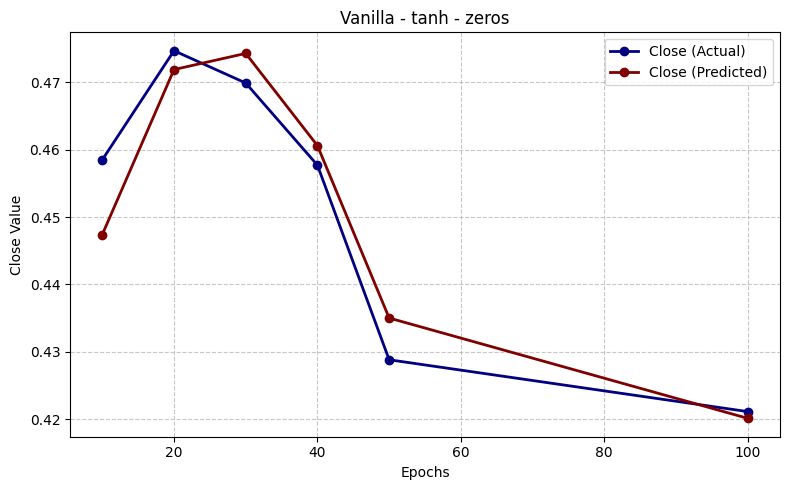

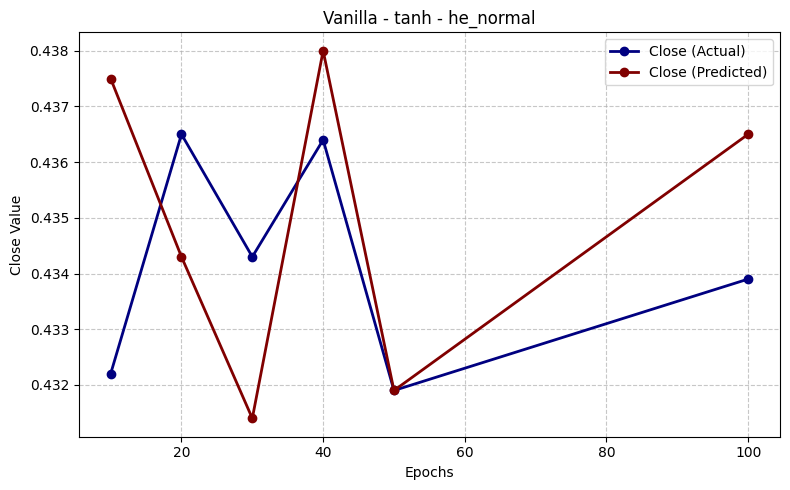

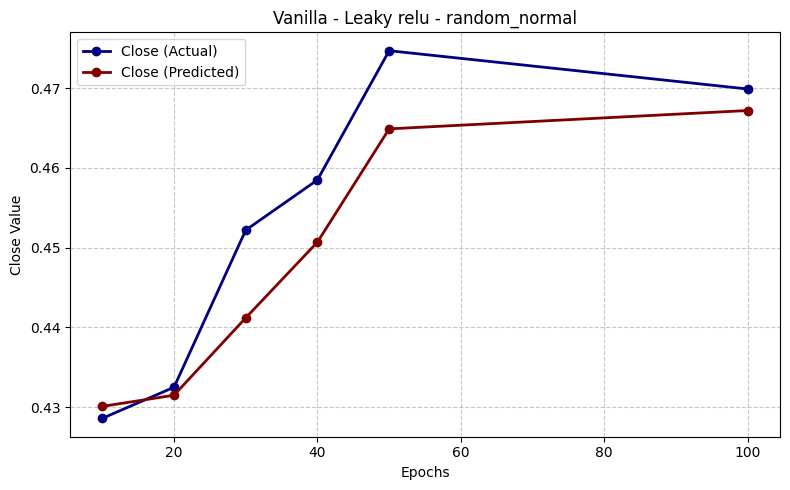

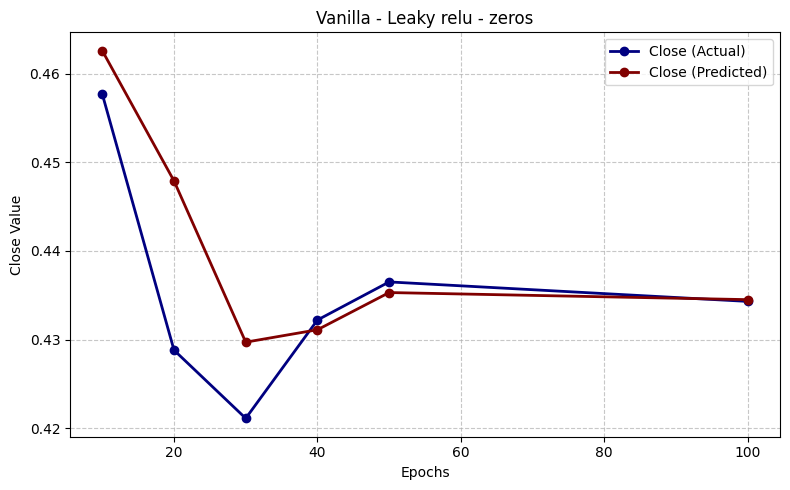

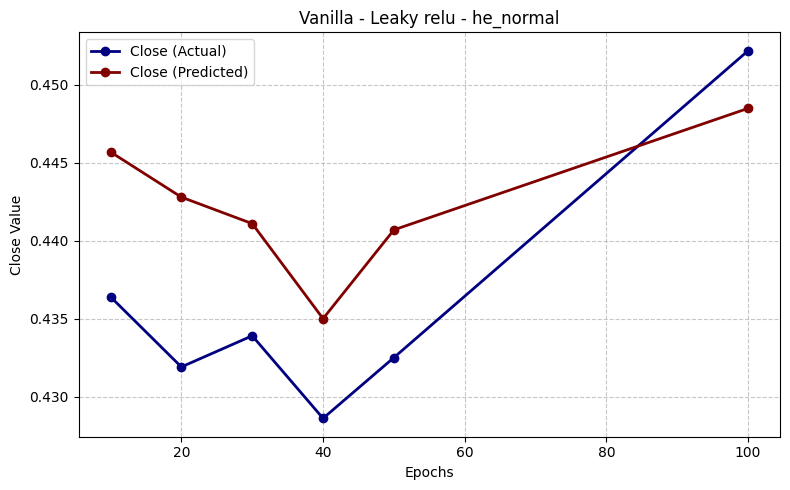

In [ ]:
import matplotlib.pyplot as plt

vanilla_data = {
    ('relu', 'random_normal'): [
        (10, 0.4322, 0.4080),
        (20, 0.4365, 0.4254),
        (30, 0.4343, 0.3988),
        (40, 0.4364, 0.4532),
        (50, 0.4319, 0.4284),
        (100,0.4339, 0.4013)
    ],
    ('relu', 'zeros'): [
        (10, 0.4286, 0.4102),
        (20, 0.4325, 0.4364),
        (30, 0.4522, 0.4058),
        (40, 0.4585, 0.4196),
        (50, 0.4747, 0.4238),
        (100,0.4699, 0.4399)
    ],
    ('relu', 'he_normal'): [
        (10, 0.4577, 0.3834),
        (20, 0.4288, 0.3646),
        (30, 0.4211, 0.4371),
        (40, 0.4322, 0.4193),
        (50, 0.4365, 0.4167),
        (100,0.4343, 0.3577)
    ],
    ('tanh', 'random_normal'): [
        (10, 0.4364, 0.4363),
        (20, 0.4319, 0.4331),
        (30, 0.4339, 0.4330),
        (40, 0.4286, 0.4295),
        (50, 0.4325, 0.4318),
        (100,0.4522, 0.4514)
    ],
    ('tanh', 'zeros'): [
        (10, 0.4585, 0.4474),
        (20, 0.4747, 0.4719),
        (30, 0.4699, 0.4743),
        (40, 0.4577, 0.4606),
        (50, 0.4288, 0.4350),
        (100,0.4211, 0.4201)
    ],
    ('tanh', 'he_normal'): [
        (10, 0.4322, 0.4375),
        (20, 0.4365, 0.4343),
        (30, 0.4343, 0.4314),
        (40, 0.4364, 0.4380),
        (50, 0.4319, 0.4319),
        (100,0.4339, 0.4365)
    ],
    ('Leaky relu', 'random_normal'): [
        (10, 0.4286, 0.4301),
        (20, 0.4325, 0.4315),
        (30, 0.4522, 0.4412),
        (40, 0.4585, 0.4507),
        (50, 0.4747, 0.4649),
        (100,0.4699, 0.4672)
    ],
    ('Leaky relu', 'zeros'): [
        (10, 0.4577, 0.4626),
        (20, 0.4288, 0.4479),
        (30, 0.4211, 0.4297),
        (40, 0.4322, 0.4311),
        (50, 0.4365, 0.4353),
        (100,0.4343, 0.4345)
    ],
    ('Leaky relu', 'he_normal'): [
        (10, 0.4364, 0.4457),
        (20, 0.4319, 0.4428),
        (30, 0.4339, 0.4411),
        (40, 0.4286, 0.4350),
        (50, 0.4325, 0.4407),
        (100,0.4522, 0.4485)
    ]
}

actual_color = 'navy'
predicted_color = 'maroon'

for (activation, init), values in vanilla_data.items():
    values.sort(key=lambda x: x[0])
    epochs = [v[0] for v in values]
    actual = [v[1] for v in values]
    predicted = [v[2] for v in values]

    plt.figure(figsize=(8,5))
    plt.plot(epochs, actual, marker='o', color=actual_color, label='Close (Actual)', linewidth=2)
    plt.plot(epochs, predicted, marker='o', color=predicted_color, label='Close (Predicted)', linewidth=2)
    plt.title(f'Vanilla - {activation} - {init}')
    plt.xlabel('Epochs')
    plt.ylabel('Close Value')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()


13) Comparison of Actual and Predicted Values for GRU architecture with a Line Plot.

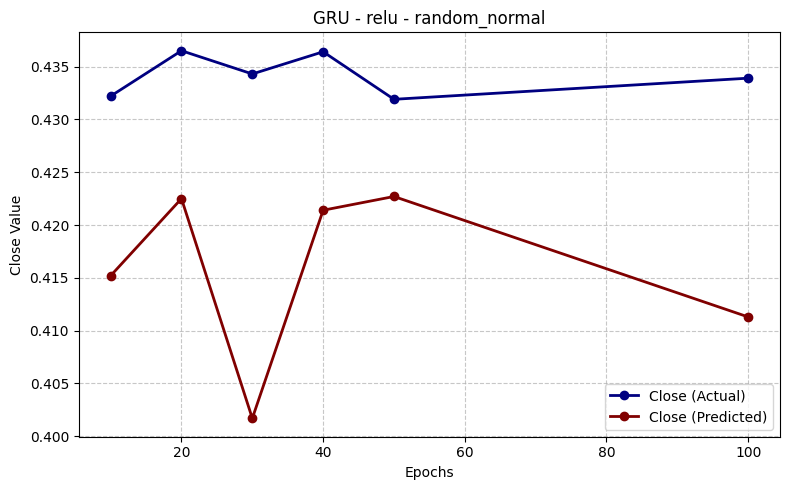

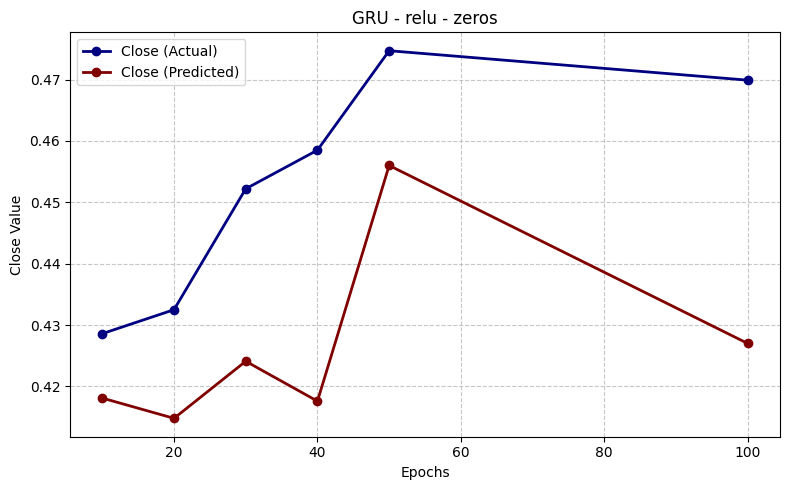

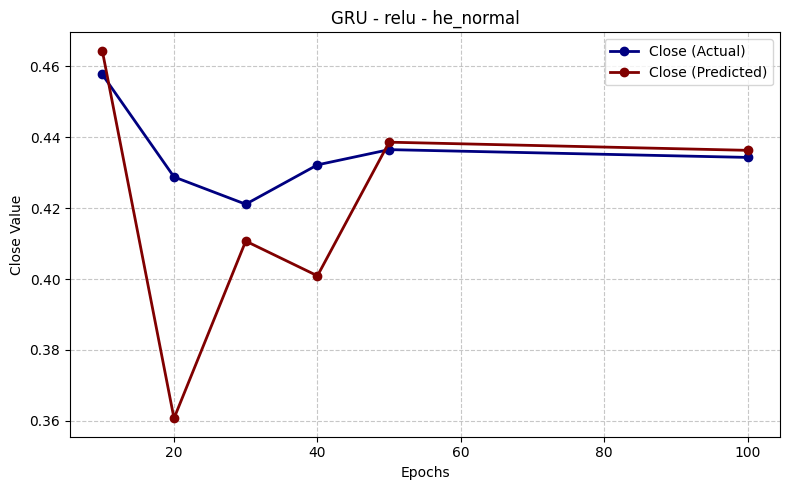

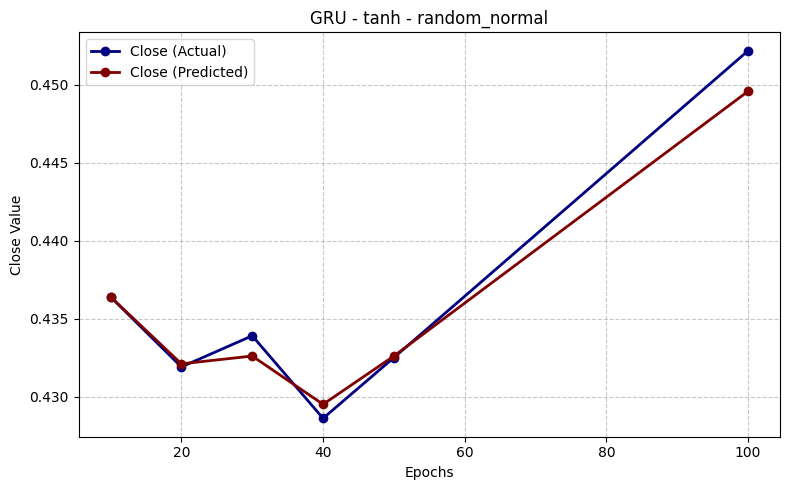

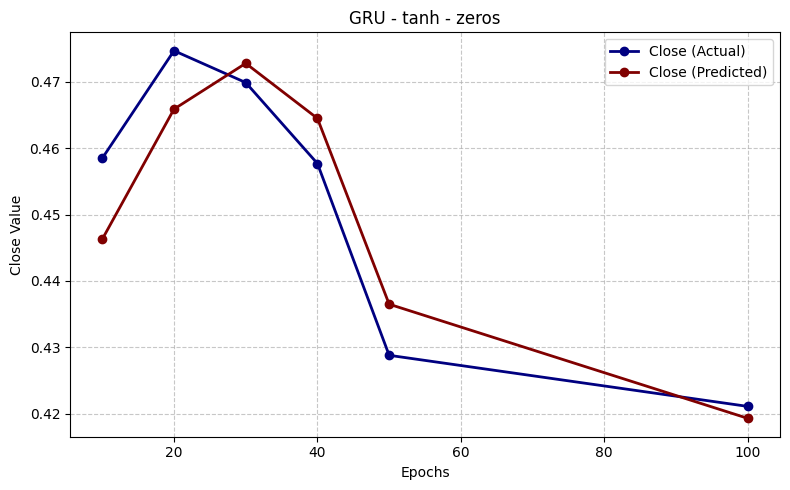

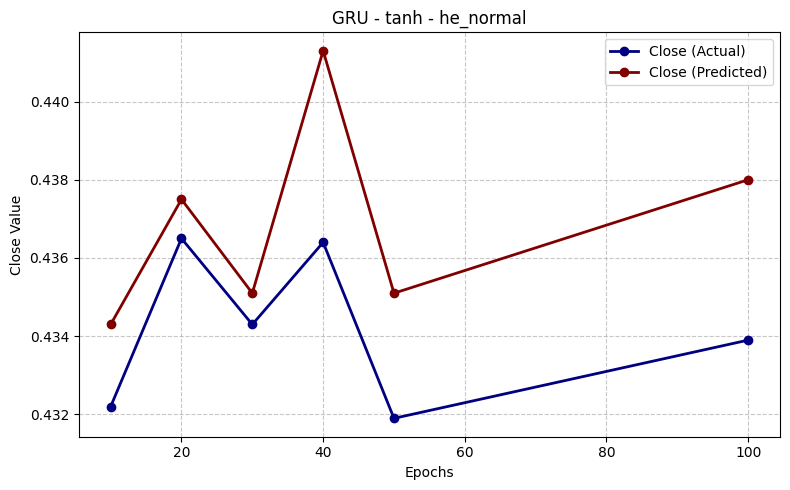

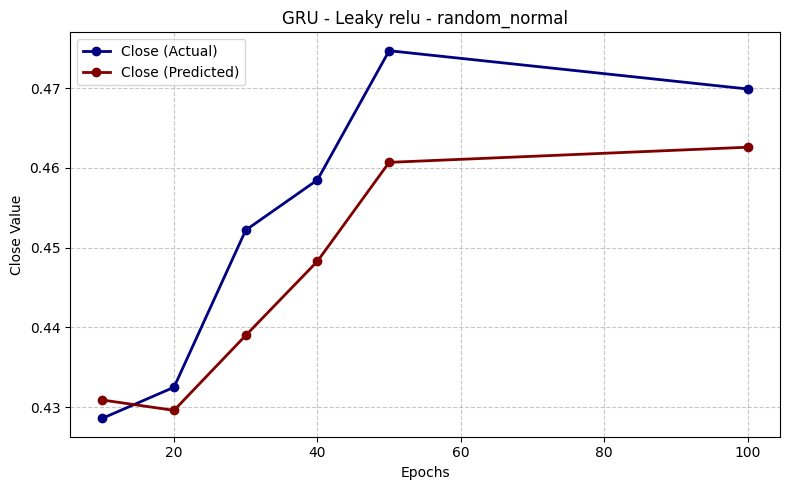

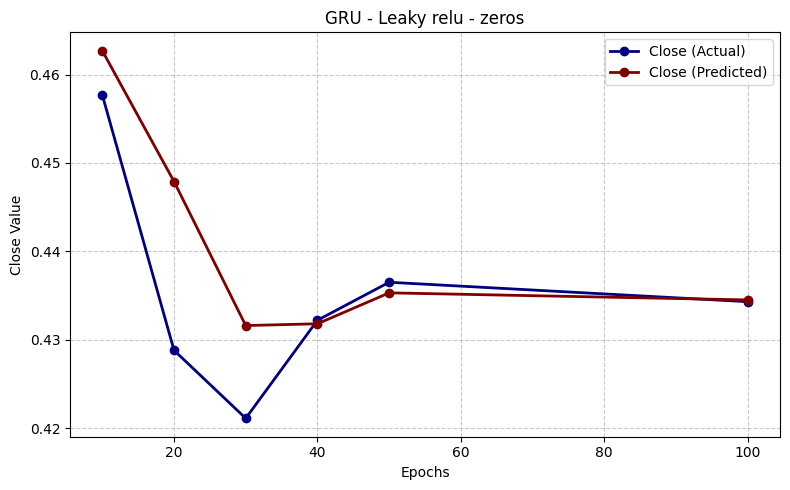

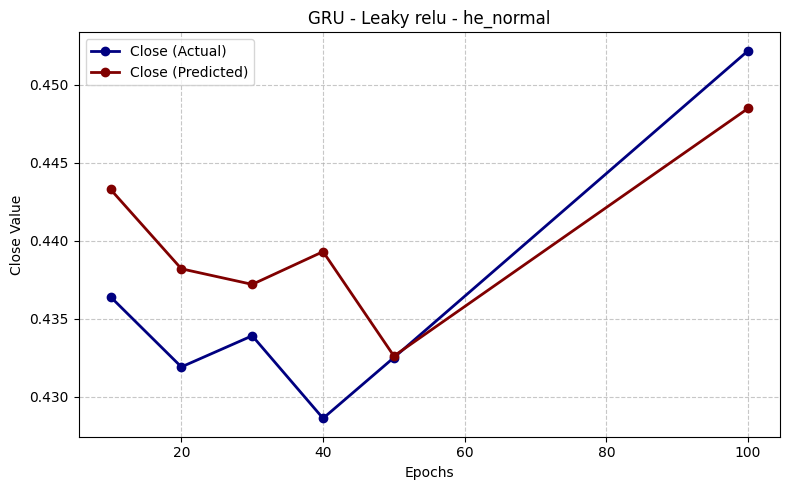

In [ ]:
import matplotlib.pyplot as plt

gru_data = {
    ('relu', 'random_normal'): [
        (10, 0.4322, 0.4152),
        (20, 0.4365, 0.4225),
        (30, 0.4343, 0.4017),
        (40, 0.4364, 0.4214),
        (50, 0.4319, 0.4227),
        (100,0.4339, 0.4113)
    ],
    ('relu', 'zeros'): [
        (10, 0.4286, 0.4181),
        (20, 0.4325, 0.4148),
        (30, 0.4522, 0.4241),
        (40, 0.4585, 0.4176),
        (50, 0.4747, 0.4560),
        (100,0.4699, 0.4270)
    ],
    ('relu', 'he_normal'): [
        (10, 0.4577, 0.4644),
        (20, 0.4288, 0.3607),
        (30, 0.4211, 0.4107),
        (40, 0.4322, 0.4009),
        (50, 0.4365, 0.4386),
        (100,0.4343, 0.4363)
    ],
    ('tanh', 'random_normal'): [
        (10, 0.4364, 0.4364),
        (20, 0.4319, 0.4321),
        (30, 0.4339, 0.4326),
        (40, 0.4286, 0.4295),
        (50, 0.4325, 0.4326),
        (100,0.4522, 0.4496)
    ],
    ('tanh', 'zeros'): [
        (10, 0.4585, 0.4463),
        (20, 0.4747, 0.4659),
        (30, 0.4699, 0.4728),
        (40, 0.4577, 0.4645),
        (50, 0.4288, 0.4365),
        (100,0.4211, 0.4193)
    ],
    ('tanh', 'he_normal'): [
        (10, 0.4322, 0.4343),
        (20, 0.4365, 0.4375),
        (30, 0.4343, 0.4351),
        (40, 0.4364, 0.4413),
        (50, 0.4319, 0.4351),
        (100,0.4339, 0.4380)
    ],
    ('Leaky relu', 'random_normal'): [
        (10, 0.4286, 0.4309),
        (20, 0.4325, 0.4296),
        (30, 0.4522, 0.4390),
        (40, 0.4585, 0.4483),
        (50, 0.4747, 0.4607),
        (100,0.4699, 0.4626)
    ],
    ('Leaky relu', 'zeros'): [
        (10, 0.4577, 0.4627),
        (20, 0.4288, 0.4479),
        (30, 0.4211, 0.4316),
        (40, 0.4322, 0.4318),
        (50, 0.4365, 0.4353),
        (100,0.4343, 0.4345)
    ],
    ('Leaky relu', 'he_normal'): [
        (10, 0.4364, 0.4433),
        (20, 0.4319, 0.4382),
        (30, 0.4339, 0.4372),
        (40, 0.4286, 0.4393),
        (50, 0.4325, 0.4326),
        (100,0.4522, 0.4485)
    ]
}

actual_color = 'navy'
predicted_color = 'maroon'

for (activation, init), values in gru_data.items():
    values.sort(key=lambda x: x[0])
    epochs = [v[0] for v in values]
    actual = [v[1] for v in values]
    predicted = [v[2] for v in values]

    plt.figure(figsize=(8,5))
    plt.plot(epochs, actual, marker='o', color=actual_color, label='Close (Actual)', linewidth=2)
    plt.plot(epochs, predicted, marker='o', color=predicted_color, label='Close (Predicted)', linewidth=2)
    plt.title(f'GRU - {activation} - {init}')
    plt.xlabel('Epochs')
    plt.ylabel('Close Value')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()


14) Comparison of Actual and Predicted Values for LSTM architecture with a Line Plot.

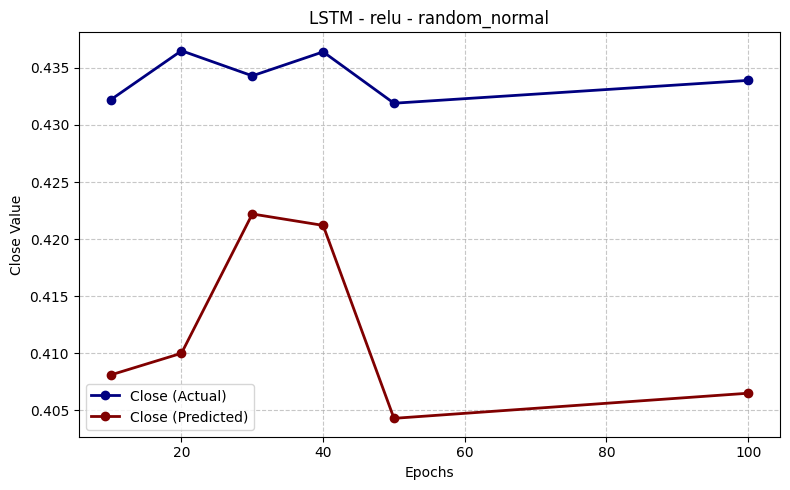

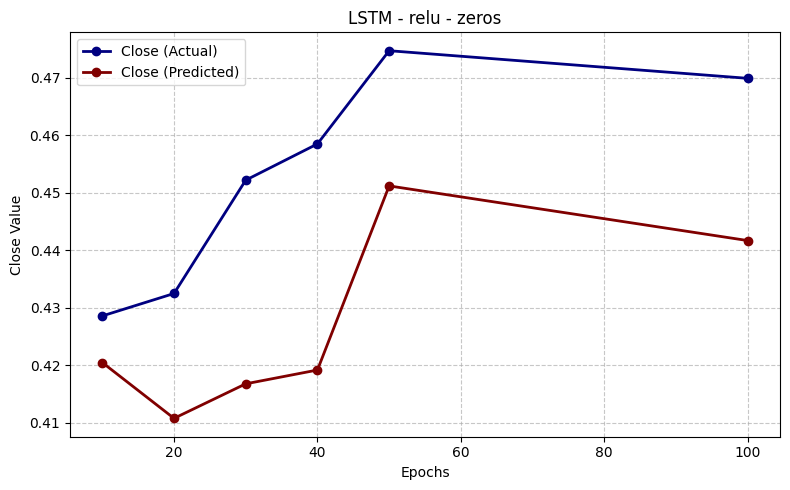

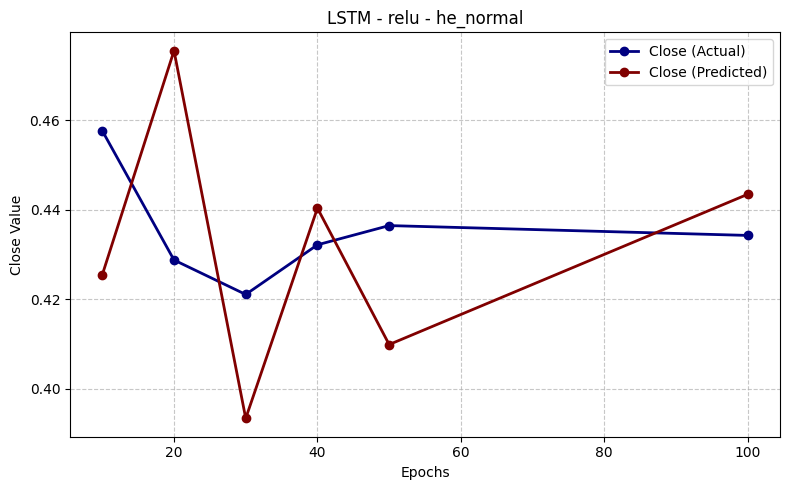

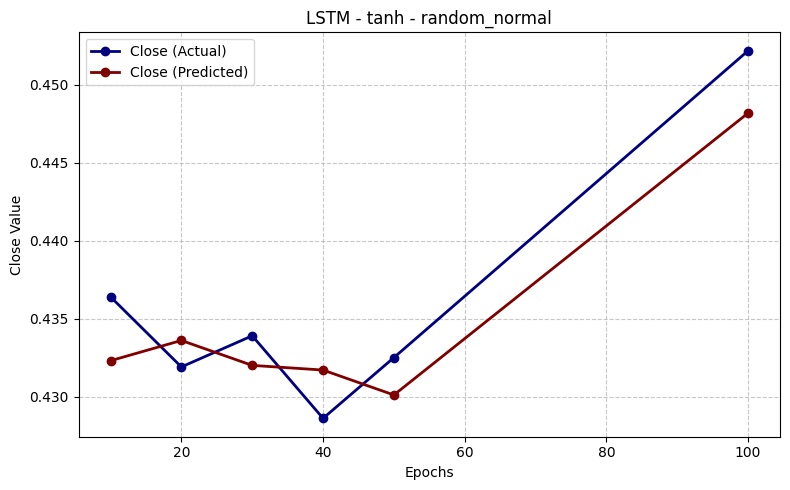

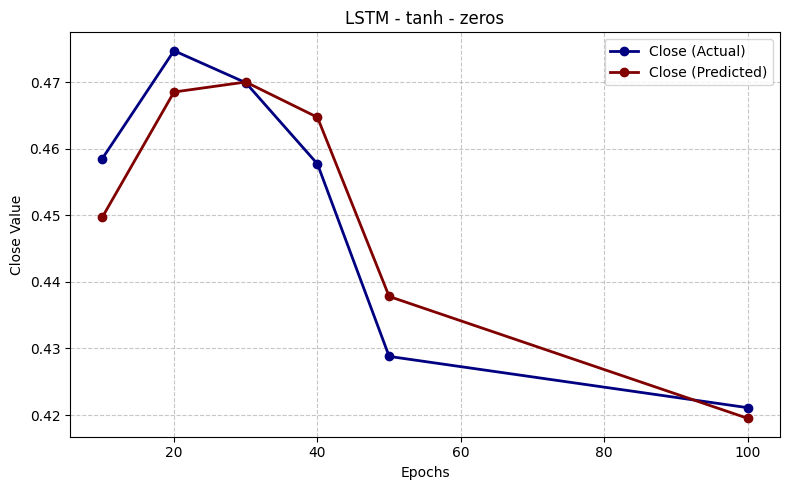

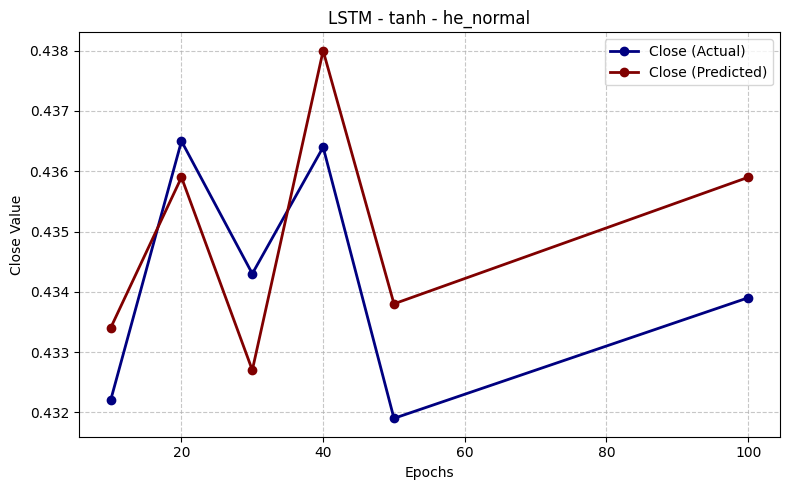

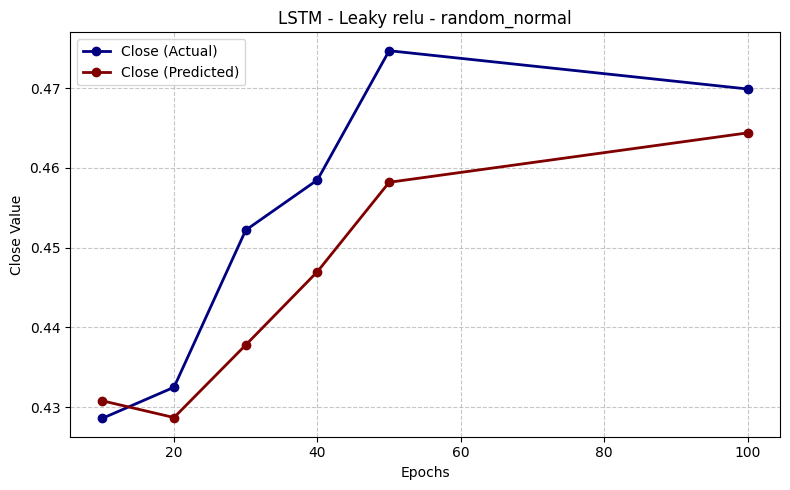

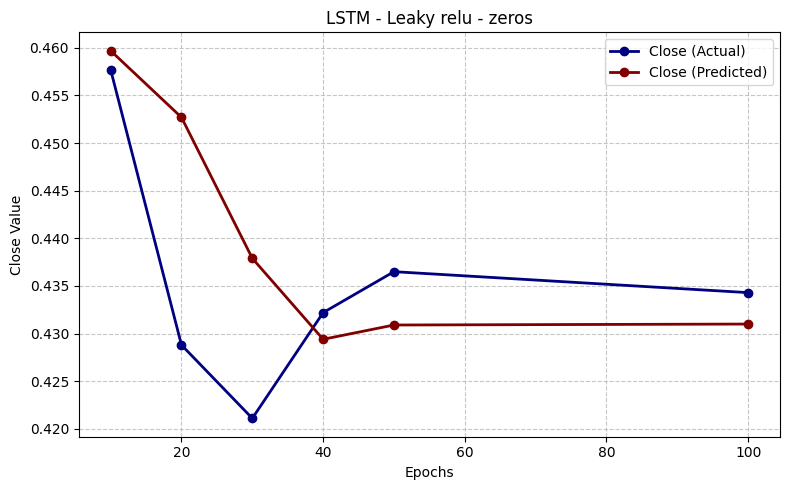

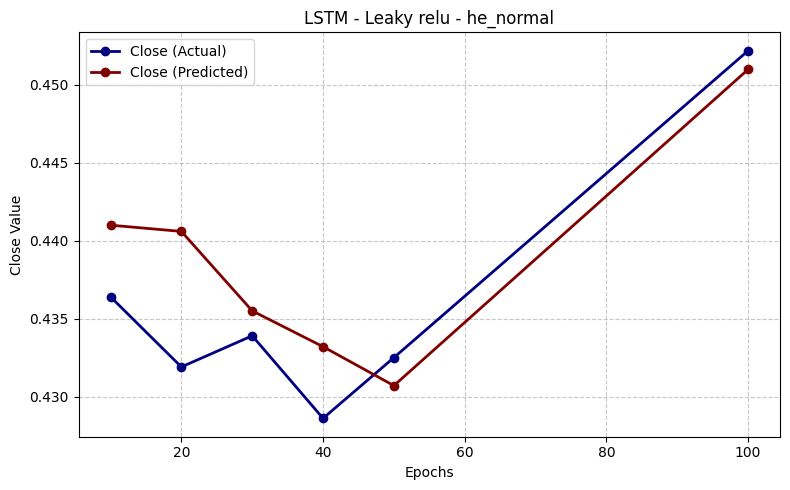

In [ ]:
import matplotlib.pyplot as plt

lstm_data = {
    ('relu', 'random_normal'): [
        (10,0.4322,0.4081),
        (20,0.4365,0.4100),
        (30,0.4343,0.4222),
        (40,0.4364,0.4212),
        (50,0.4319,0.4043),
        (100,0.4339,0.4065)
    ],
    ('relu', 'zeros'): [
        (10,0.4286,0.4205),
        (20,0.4325,0.4108),
        (30,0.4522,0.4168),
        (40,0.4585,0.4192),
        (50,0.4747,0.4512),
        (100,0.4699,0.4417)
    ],
    ('relu', 'he_normal'): [
        (10,0.4577,0.4255),
        (20,0.4288,0.4756),
        (30,0.4211,0.3934),
        (40,0.4322,0.4404),
        (50,0.4365,0.4099),
        (100,0.4343,0.4435)
    ],
    ('tanh', 'random_normal'): [
        (10,0.4364,0.4323),
        (20,0.4319,0.4336),
        (30,0.4339,0.4320),
        (40,0.4286,0.4317),
        (50,0.4325,0.4301),
        (100,0.4522,0.4482)
    ],
    ('tanh', 'zeros'): [
        (10,0.4585,0.4497),
        (20,0.4747,0.4685),
        (30,0.4699,0.4700),
        (40,0.4577,0.4647),
        (50,0.4288,0.4378),
        (100,0.4211,0.4195)
    ],
    ('tanh', 'he_normal'): [
        (10,0.4322,0.4334),
        (20,0.4365,0.4359),
        (30,0.4343,0.4327),
        (40,0.4364,0.4380),
        (50,0.4319,0.4338),
        (100,0.4339,0.4359)
    ],
    ('Leaky relu', 'random_normal'): [
        (10,0.4286,0.4308),
        (20,0.4325,0.4287),
        (30,0.4522,0.4378),
        (40,0.4585,0.4470),
        (50,0.4747,0.4582),
        (100,0.4699,0.4644)
    ],
    ('Leaky relu', 'zeros'): [
        (10,0.4577,0.4597),
        (20,0.4288,0.4527),
        (30,0.4211,0.4379),
        (40,0.4322,0.4294),
        (50,0.4365,0.4309),
        (100,0.4343,0.4310)
    ],
    ('Leaky relu', 'he_normal'): [
        (10,0.4364,0.4410),
        (20,0.4319,0.4406),
        (30,0.4339,0.4355),
        (40,0.4286,0.4332),
        (50,0.4325,0.4307),
        (100,0.4522,0.4510)
    ]
}

actual_color = 'navy'
predicted_color = 'maroon'

for (activation, init), values in lstm_data.items():
    values.sort(key=lambda x: x[0])
    epochs = [v[0] for v in values]
    actual = [v[1] for v in values]
    predicted = [v[2] for v in values]

    plt.figure(figsize=(8,5))
    plt.plot(epochs, actual, marker='o', color=actual_color, label='Close (Actual)', linewidth=2)
    plt.plot(epochs, predicted, marker='o', color=predicted_color, label='Close (Predicted)', linewidth=2)
    plt.title(f'LSTM - {activation} - {init}')
    plt.xlabel('Epochs')
    plt.ylabel('Close Value')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()


15) Comparison of Actual and Predicted Values for TCN architecture with a Line Plot.

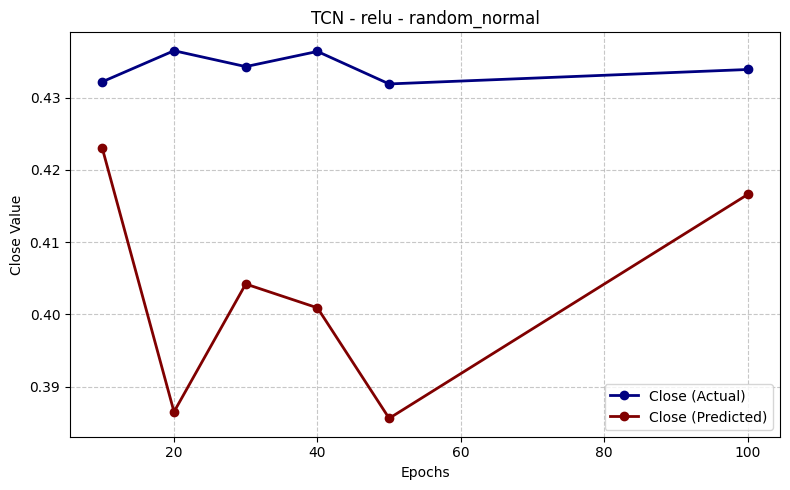

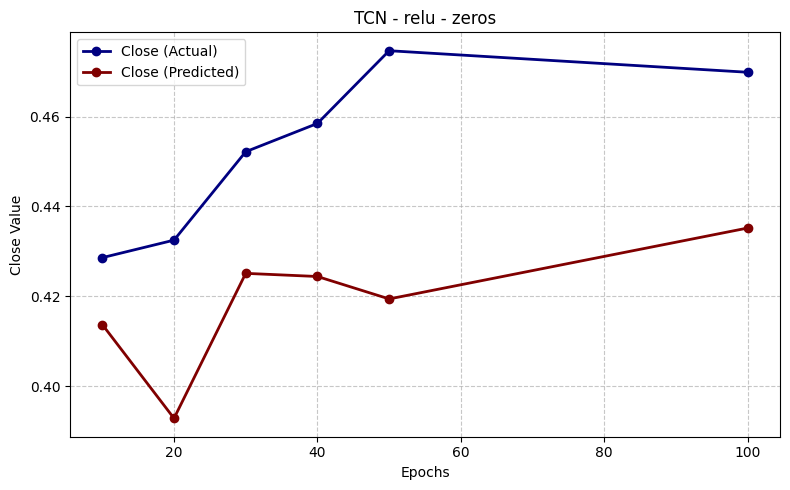

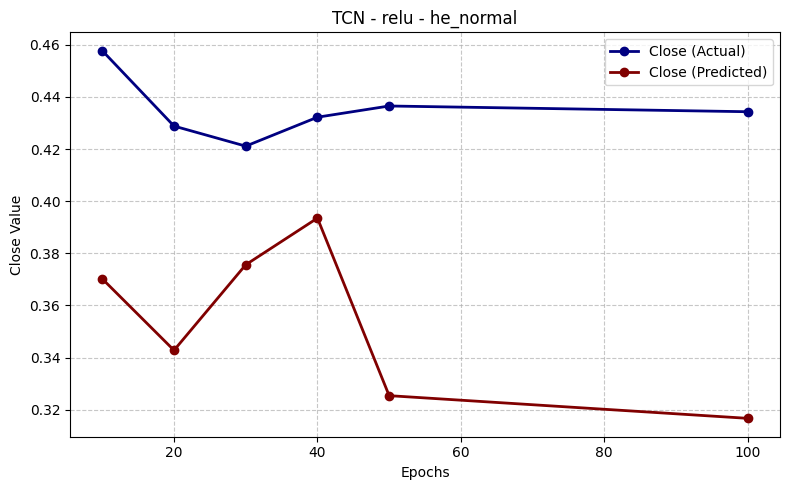

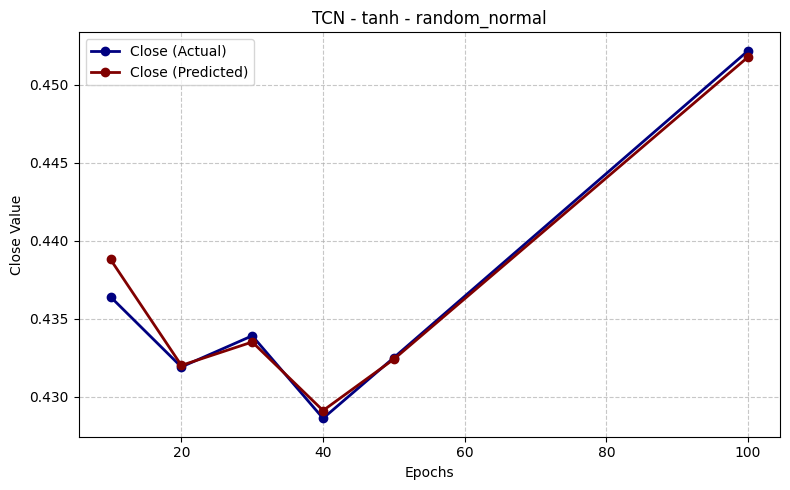

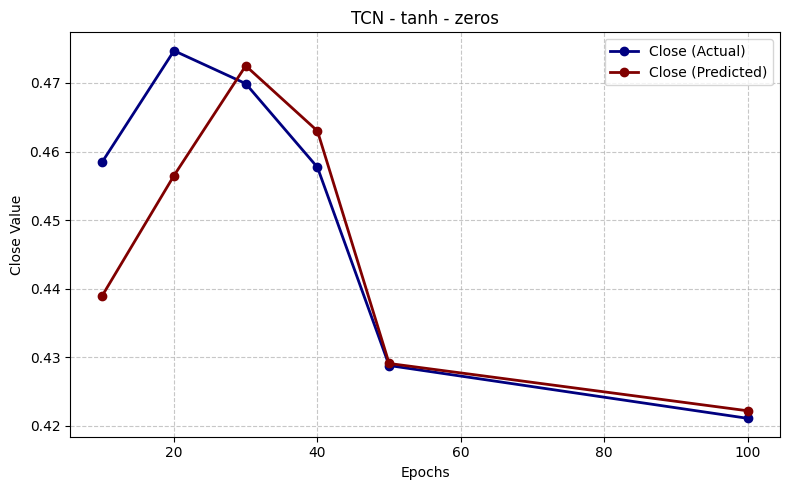

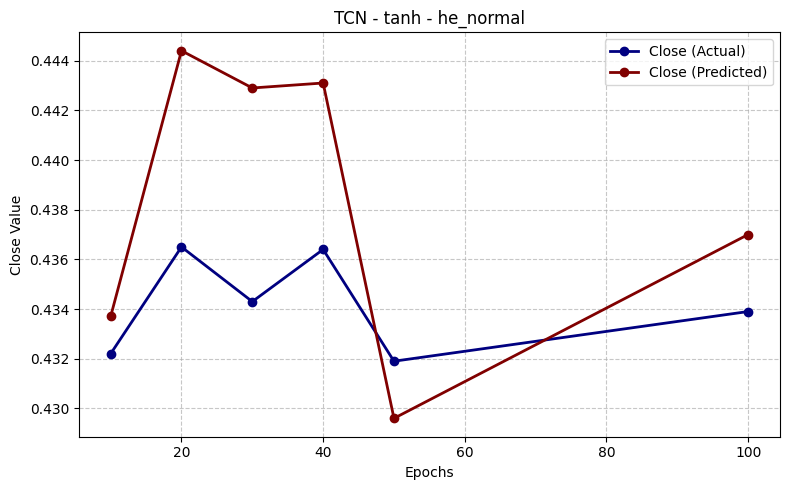

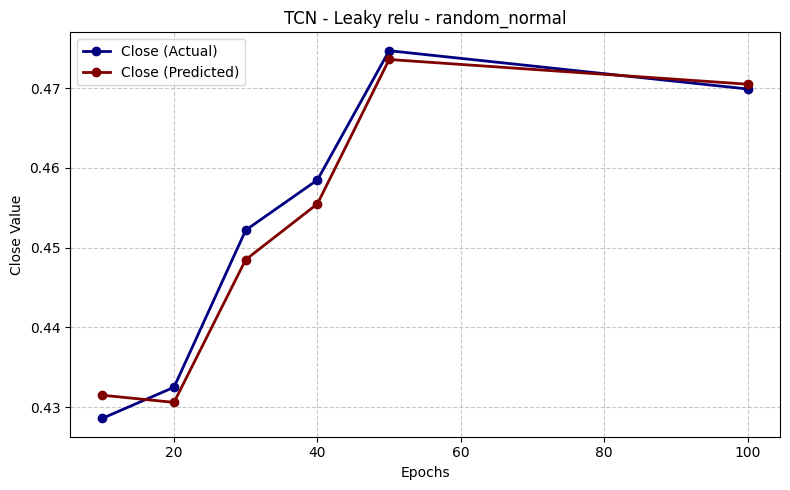

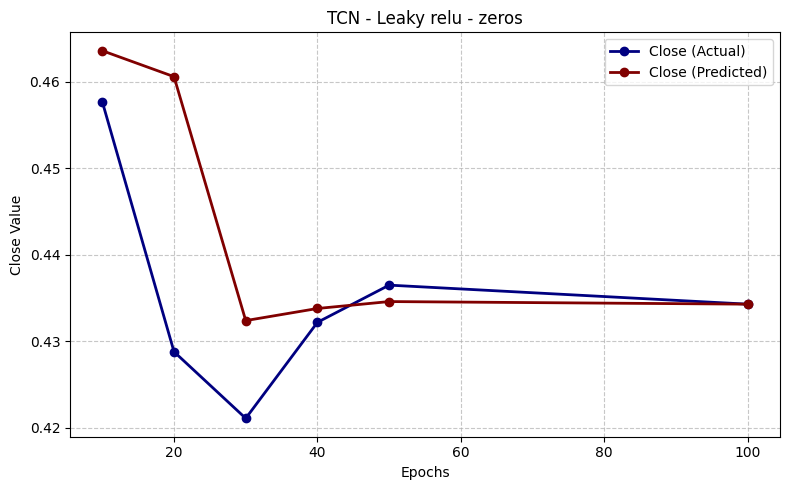

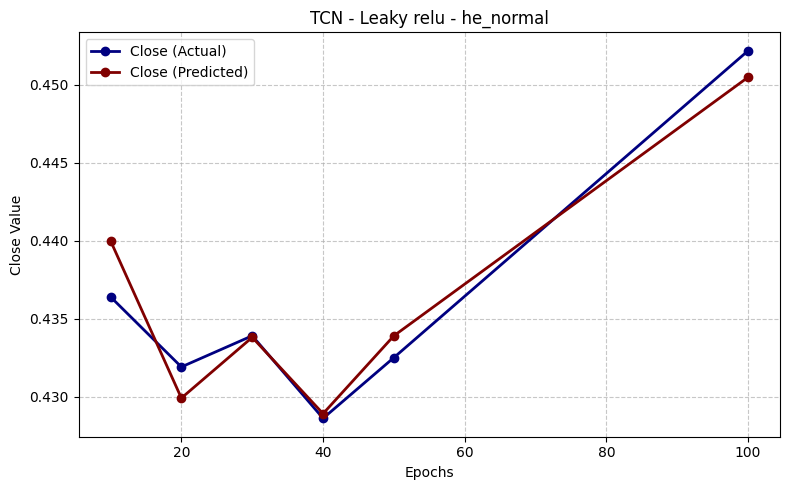

In [ ]:
import matplotlib.pyplot as plt

tcn_data = {
    ('relu', 'random_normal'): [
        (10,0.4322,0.4230),
        (20,0.4365,0.3865),
        (30,0.4343,0.4042),
        (40,0.4364,0.4009),
        (50,0.4319,0.3856),
        (100,0.4339,0.4166)
    ],
    ('relu', 'zeros'): [
        (10,0.4286,0.4137),
        (20,0.4325,0.3928),
        (30,0.4522,0.4251),
        (40,0.4585,0.4244),
        (50,0.4747,0.4194),
        (100,0.4699,0.4352)
    ],
    ('relu', 'he_normal'): [
        (10,0.4577,0.3702),
        (20,0.4288,0.3428),
        (30,0.4211,0.3756),
        (40,0.4322,0.3935),
        (50,0.4365,0.3254),
        (100,0.4343,0.3167)
    ],
    ('tanh', 'random_normal'): [
        (10,0.4364,0.4388),
        (20,0.4319,0.4320),
        (30,0.4339,0.4335),
        (40,0.4286,0.4291),
        (50,0.4325,0.4324),
        (100,0.4522,0.4518)
    ],
    ('tanh', 'zeros'): [
        (10,0.4585,0.4390),
        (20,0.4747,0.4565),
        (30,0.4699,0.4725),
        (40,0.4577,0.4630),
        (50,0.4288,0.4291),
        (100,0.4211,0.4222)
    ],
    ('tanh', 'he_normal'): [
        (10,0.4322,0.4337),
        (20,0.4365,0.4444),
        (30,0.4343,0.4429),
        (40,0.4364,0.4431),
        (50,0.4319,0.4296),
        (100,0.4339,0.4370)
    ],
    ('Leaky relu', 'random_normal'): [
        (10,0.4286,0.4315),
        (20,0.4325,0.4306),
        (30,0.4522,0.4485),
        (40,0.4585,0.4555),
        (50,0.4747,0.4736),
        (100,0.4699,0.4705)
    ],
    ('Leaky relu', 'zeros'): [
        (10,0.4577,0.4636),
        (20,0.4288,0.4606),
        (30,0.4211,0.4324),
        (40,0.4322,0.4338),
        (50,0.4365,0.4346),
        (100,0.4343,0.4343)
    ],
    ('Leaky relu', 'he_normal'): [
        (10,0.4364,0.4400),
        (20,0.4319,0.4299),
        (30,0.4339,0.4338),
        (40,0.4286,0.4289),
        (50,0.4325,0.4339),
        (100,0.4522,0.4505)
    ]
}

actual_color = 'navy'
predicted_color = 'maroon'

for (activation, init), values in tcn_data.items():
    values.sort(key=lambda x: x[0])
    epochs = [v[0] for v in values]
    actual = [v[1] for v in values]
    predicted = [v[2] for v in values]

    plt.figure(figsize=(8,5))
    plt.plot(epochs, actual, marker='o', color=actual_color, label='Close (Actual)', linewidth=2)
    plt.plot(epochs, predicted, marker='o', color=predicted_color, label='Close (Predicted)', linewidth=2)
    plt.title(f'TCN - {activation} - {init}')
    plt.xlabel('Epochs')
    plt.ylabel('Close Value')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()


16) Comparison of Actual and Predicted Values for LSTM-GRU Hybrid architecture with a Line Plot.

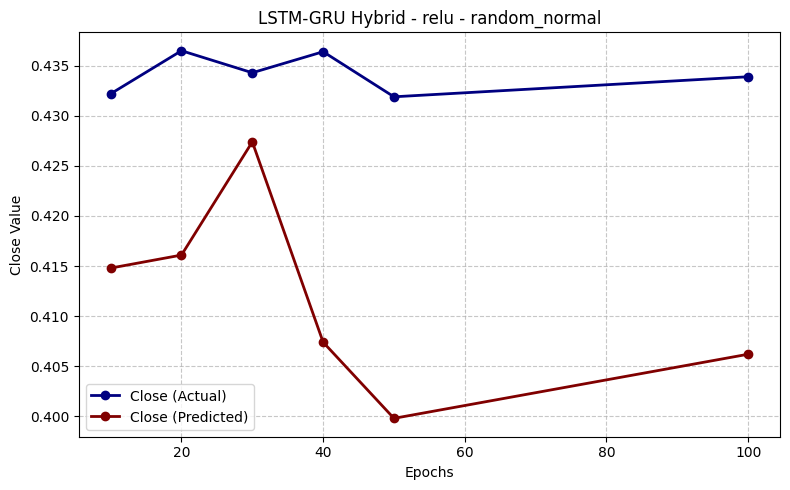

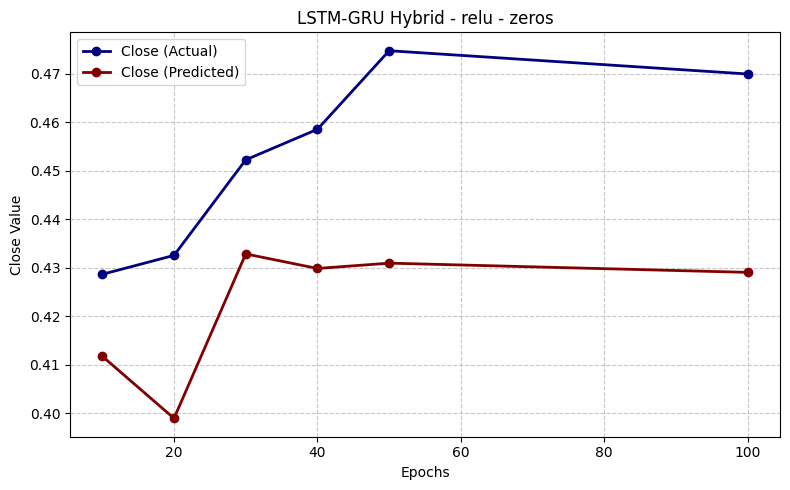

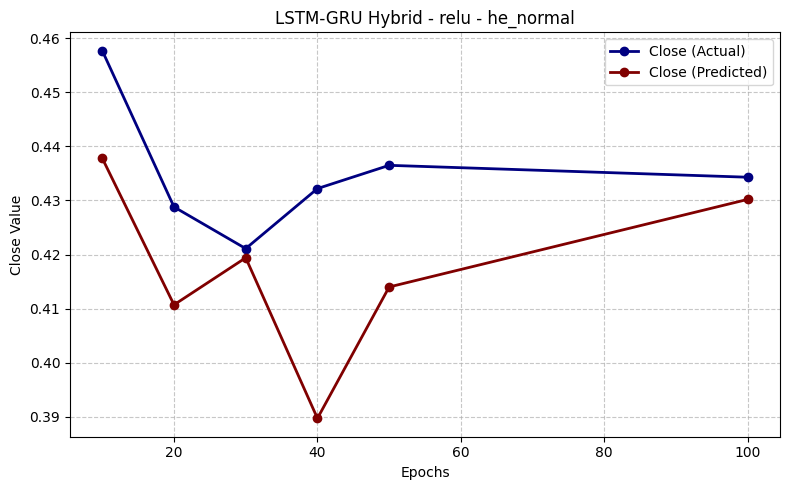

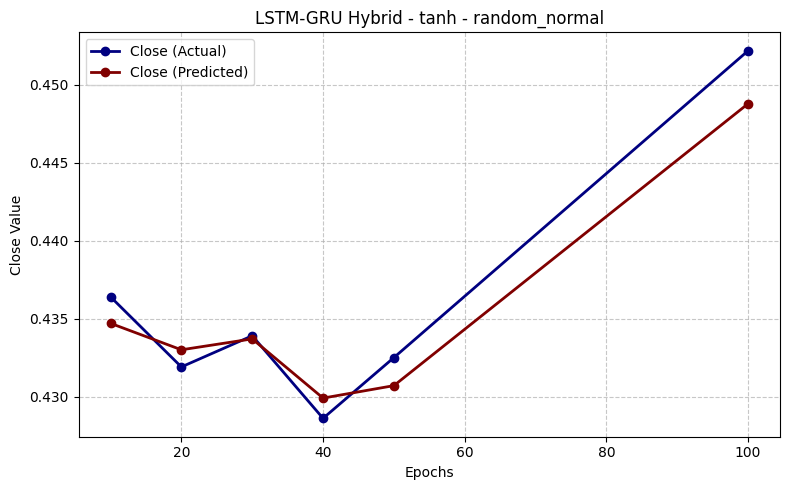

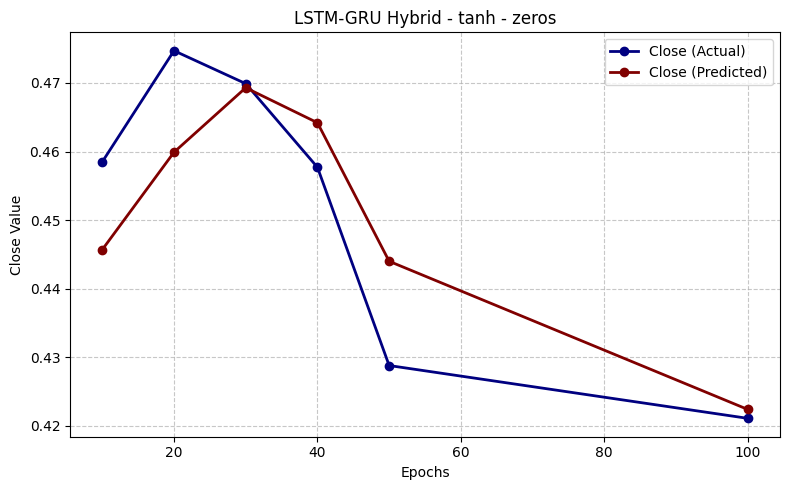

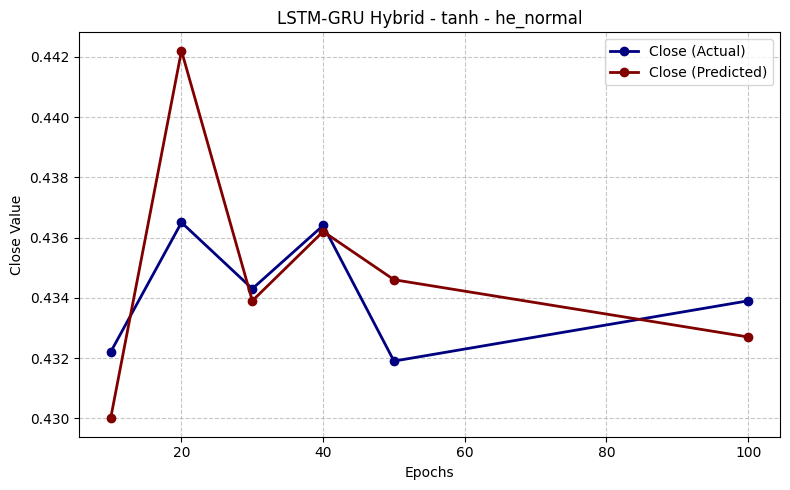

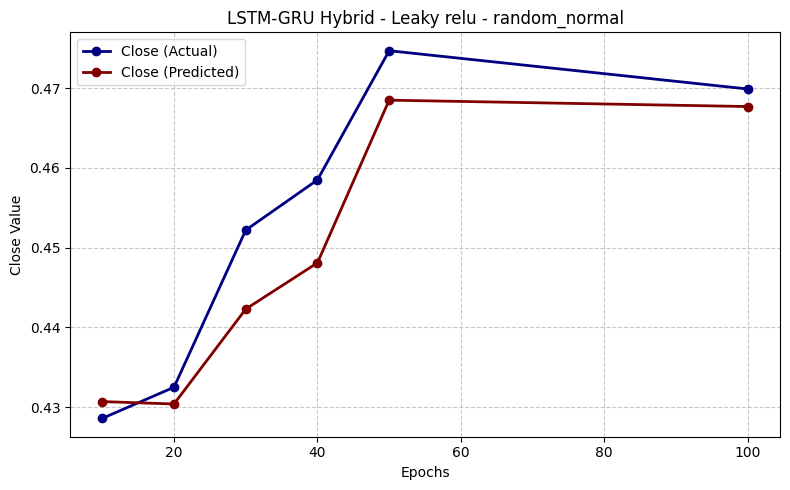

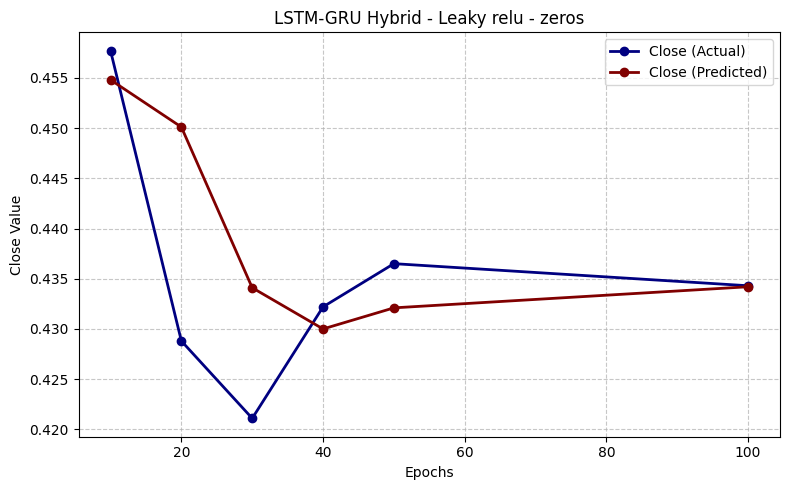

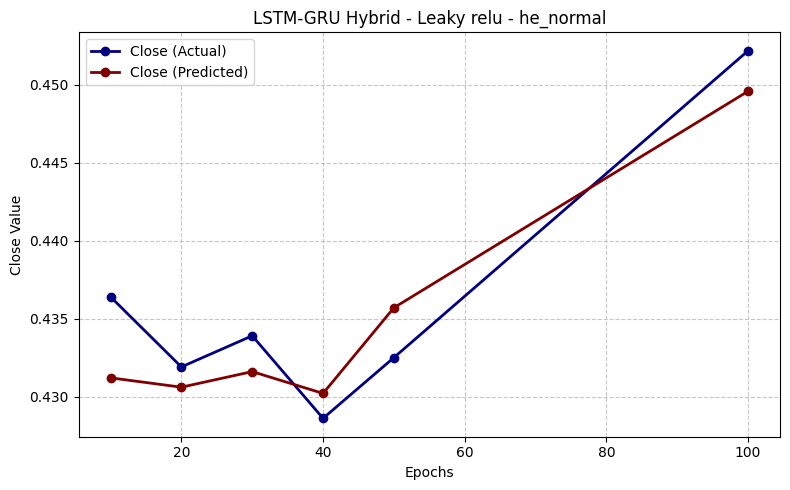

In [ ]:
import matplotlib.pyplot as plt

lstm_gru_hybrid_data = {
    ('relu', 'random_normal'): [
        (10,0.4322,0.4148),
        (20,0.4365,0.4161),
        (30,0.4343,0.4274),
        (40,0.4364,0.4074),
        (50,0.4319,0.3998),
        (100,0.4339,0.4062)
    ],
    ('relu', 'zeros'): [
        (10,0.4286,0.4117),
        (20,0.4325,0.3989),
        (30,0.4522,0.4328),
        (40,0.4585,0.4298),
        (50,0.4747,0.4309),
        (100,0.4699,0.4290)
    ],
    ('relu', 'he_normal'): [
        (10,0.4577,0.4378),
        (20,0.4288,0.4107),
        (30,0.4211,0.4194),
        (40,0.4322,0.3897),
        (50,0.4365,0.4140),
        (100,0.4343,0.4302)
    ],
    ('tanh', 'random_normal'): [
        (10,0.4364,0.4347),
        (20,0.4319,0.4330),
        (30,0.4339,0.4337),
        (40,0.4286,0.4299),
        (50,0.4325,0.4307),
        (100,0.4522,0.4488)
    ],
    ('tanh', 'zeros'): [
        (10,0.4585,0.4457),
        (20,0.4747,0.4599),
        (30,0.4699,0.4693),
        (40,0.4577,0.4642),
        (50,0.4288,0.4440),
        (100,0.4211,0.4224)
    ],
    ('tanh', 'he_normal'): [
        (10,0.4322,0.4300),
        (20,0.4365,0.4422),
        (30,0.4343,0.4339),
        (40,0.4364,0.4362),
        (50,0.4319,0.4346),
        (100,0.4339,0.4327)
    ],
    ('Leaky relu', 'random_normal'): [
        (10,0.4286,0.4307),
        (20,0.4325,0.4304),
        (30,0.4522,0.4423),
        (40,0.4585,0.4481),
        (50,0.4747,0.4685),
        (100,0.4699,0.4677)
    ],
    ('Leaky relu', 'zeros'): [
        (10,0.4577,0.4548),
        (20,0.4288,0.4501),
        (30,0.4211,0.4341),
        (40,0.4322,0.4300),
        (50,0.4365,0.4321),
        (100,0.4343,0.4342)
    ],
    ('Leaky relu', 'he_normal'): [
        (10,0.4364,0.4312),
        (20,0.4319,0.4306),
        (30,0.4339,0.4316),
        (40,0.4286,0.4302),
        (50,0.4325,0.4357),
        (100,0.4522,0.4496)
    ]
}

actual_color = 'navy'
predicted_color = 'maroon'

for (activation, init), values in lstm_gru_hybrid_data.items():
    values.sort(key=lambda x: x[0])
    epochs = [v[0] for v in values]
    actual = [v[1] for v in values]
    predicted = [v[2] for v in values]

    plt.figure(figsize=(8,5))
    plt.plot(epochs, actual, marker='o', color=actual_color, label='Close (Actual)', linewidth=2)
    plt.plot(epochs, predicted, marker='o', color=predicted_color, label='Close (Predicted)', linewidth=2)
    plt.title(f'LSTM-GRU Hybrid - {activation} - {init}')
    plt.xlabel('Epochs')
    plt.ylabel('Close Value')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()
